# Envs

In [ ]:
import pandas as pd
import ast
import json
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import os
from numpy.polynomial import Chebyshev, Polynomial
import numpy as np
from sklearn.linear_model import RANSACRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline





In [ ]:
print(os.getcwd())


/content


In [ ]:
def update_Cones_Map(heading_angle_in_radians, wheel_speed, Map):
  v = wheel_speed
  x = np.cos(heading_angle_in_radians)
  y = np.sin(heading_angle_in_radians)
  dt = 0.1

  derta_x = x * wheel_speed * dt
  derta_y = y * wheel_speed * dt

  new_x, new_y, new_c = [], [], []

  for x, y, c in zip(Map["x_list"], Map["y_list"], Map["c_list"]):

      x_new = x - derta_x
      y_new = y - derta_y

      new_x.append(x_new)
      new_y.append(y_new)
      new_c.append(c)



  return {
      "x_list": new_x,
      "y_list": new_y,
      "c_list": new_c
  }

def filter_x_range(Map, x_min=0.0, x_max=750.0):
  """Keep only points with x in (x_min, x_max)."""
  fx, fy, fc = [], [], []
  for x, y, c in zip(Map["x_list"], Map["y_list"], Map["c_list"]):
      if x_min < x < x_max:
          fx.append(x); fy.append(y); fc.append(c)
  return {"x_list": fx, "y_list": fy, "c_list": fc}


def merge_maps(base, addon, vision = 750):
    filtered_x, filtered_y, filtered_c = [], [], []
    for x, y, c in zip(base["x_list"], base["y_list"], base["c_list"]):
        if x > vision:
            filtered_x.append(x)
            filtered_y.append(y)
            filtered_c.append(c)

    return {
        "x_list": list(addon["x_list"]) + filtered_x,
        "y_list": list(addon["y_list"]) + filtered_y,
        "c_list": list(addon["c_list"]) + filtered_c,
    }

def is_empty_detection(frame):
    xs = frame.get("x_list", [])
    ys = frame.get("y_list", [])
    cs = frame.get("c_list", [])

    return (not xs) or (not ys) or (not cs)


def frame_to_map(frame):
  """Convert frame dict to map structure."""
  return {
      "x_list": frame.get("x_list", []),
      "y_list": frame.get("y_list", []),
      "c_list": frame.get("c_list", []),
  }





In [ ]:
def select_degree(n_points: int) -> int:
    """
    按点数选择拟合阶数：
      - 2点 -> 1阶
      - 3点 -> 2阶
      - 其它 -> 3阶
    """
    if n_points <= 2:
        return 1
    return 2

def weighted_polyfit(x, y, degree: int, weights=None, l2: float = 0.0) -> np.poly1d:

    x = np.asarray(x, dtype=float).ravel()
    y = np.asarray(y, dtype=float).ravel()
    n = len(x)

    # 防欠定：最多 n-1 阶；最低 0 阶
    degree = int(max(0, min(degree, max(0, n - 1))))

    # Vandermonde：高次到常数
    V = np.vstack([x ** k for k in range(degree, -1, -1)]).T  # (n, degree+1)

    if weights is not None:
        w = np.asarray(weights, dtype=float).ravel()
        W = np.diag(w)
        A = V.T @ W @ V
        b = V.T @ W @ y
    else:
        A = V.T @ V
        b = V.T @ y

    if l2 > 0:
        A = A + l2 * np.eye(A.shape[0])

    coeffs = np.linalg.solve(A, b)  # [a_d, ..., a_0]
    return np.poly1d(coeffs)

def safe_plot(x, y, *args, **kwargs):
    """只绘制 y 在 [-5000, 5000] 内的部分，避免极端值把图拉飞。"""
    y = np.asarray(y)
    x = np.asarray(x)
    mask = (y <= 5000) & (y >= -5000)
    if np.any(mask):
        plt.plot(x[mask], y[mask], *args, **kwargs)

def _scatter_line(x, y, color, label=None):
    safe_plot(x, y, color=color, label=label)

def _scatter_pts(x, y, color, s=10, label=None):
    plt.scatter(x, y, s=s, color=color, label=label)

# ========= 处理函数 =========

def handle_no_points(degree: int = 1):
    """
    没有任何点时，返回常数多项式 0 并做一个占位图。
    """
    x_fit = np.linspace(0, 100, 300)
    poly_middle = np.poly1d([0.0])
    plt.figure(figsize=(8, 6))
    plt.plot(x_fit, poly_middle(x_fit), color='green', linestyle='--', label='Default Middle Line')
    plt.title("Default Middle Line y=0")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_two_valid_groups(
    valid_groups, x_fit_full, degree, default_offset, color_map,
    ridge: float = 0.0, tail_boost: float = 2.0, bandwidth: float = 400.0,
):

    plt.figure(figsize=(8, 6))
    x_fit = x_fit_full

    assert len(valid_groups) >= 2
    # 以左边起点小的在前
    (c1, n1, x1, y1), (c2, n2, x2, y2) = sorted(valid_groups, key=lambda g: np.min(g[2]))

    # 各自拟合边界
    deg1 = select_degree(len(x1))
    deg2 = select_degree(len(x2))
    p1 = weighted_polyfit(x1, y1, deg1)
    p2 = weighted_polyfit(x2, y2, deg2)

    # 可视化
    safe_plot(x_fit, p1(x_fit), color=color_map.get(c1, 'gray'), label=f'Color {color_map.get(c1, "gray")}')
    safe_plot(x_fit, p2(x_fit), color=color_map.get(c2, 'gray'), label=f'Color {color_map.get(c2, "gray")}')
    _scatter_pts(x1, y1, color=color_map.get(c1, 'gray'))
    _scatter_pts(x2, y2, color=color_map.get(c2, 'gray'))

    # 竖直偏移（蓝上黄下）
    off1 = (+default_offset if c1 == 1 else -default_offset)
    off2 = (+default_offset if c2 == 1 else -default_offset)
    y_t1 = p1(x_fit) + off1
    y_t2 = p2(x_fit) + off2

    # 支撑度权重（最近距离核）
    def support_weight(xq, xs, h):
        xs = np.asarray(xs)
        dmin = np.min(np.abs(xq[:, None] - xs[None, :]), axis=1)
        return np.exp(-(dmin ** 2) / (2.0 * (h ** 2)))

    w1 = support_weight(x_fit, x1, bandwidth)
    w2 = support_weight(x_fit, x2, bandwidth)
    s = w1 + w2 + 1e-8
    y_target_blend = (w1 / s) * y_t1 + (w2 / s) * y_t2

    # 间隙平滑（在目标曲线上做 C1 连续的三次连接）
    x1_max = np.max(x1); x2_min = np.min(x2)
    if x2_min - x1_max > 1e-6:
        idxL = np.searchsorted(x_fit, x1_max)
        idxR = np.searchsorted(x_fit, x2_min)
        xL, xR = x_fit[idxL], x_fit[idxR]
        yL, yR = y_target_blend[idxL], y_target_blend[idxR]
        dyL = (y_target_blend[min(idxL + 1, len(x_fit) - 1)] - y_target_blend[idxL]) / \
              max(x_fit[min(idxL + 1, len(x_fit) - 1)] - xL, 1e-6)
        dyR = (y_target_blend[idxR] - y_target_blend[max(idxR - 1, 0)]) / \
              max(xR - x_fit[max(idxR - 1, 0)], 1e-6)

        A = np.array([
            [xL ** 3, xL ** 2, xL, 1.0],
            [xR ** 3, xR ** 2, xR, 1.0],
            [3 * xL ** 2, 2 * xL, 1.0, 0.0],
            [3 * xR ** 2, 2 * xR, 1.0, 0.0]
        ], float)
        b = np.array([yL, yR, dyL, dyR], float)
        a3, a2, a1, a0 = np.linalg.solve(A, b)
        gap_mask = (x_fit >= xL) & (x_fit <= xR)
        y_target_blend[gap_mask] = a3 * x_fit[gap_mask] ** 3 + a2 * x_fit[gap_mask] ** 2 + a1 * x_fit[gap_mask] + a0

    # 最终中线拟合（加强尾段）
    W = np.linspace(1.0, tail_boost, len(x_fit))
    deg_mid = select_degree(len(x_fit))
    poly_middle = weighted_polyfit(x_fit, y_target_blend, deg_mid, weights=W, l2=ridge)

    safe_plot(x_fit, poly_middle(x_fit), color='green', linestyle='--',
              label='Middle Line (weighted blend + cubic gap)')
    plt.title("Two valid groups: weighted blend + cubic gap (vertical offset)")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_one_valid_one_single(
    valid_group, single_group, x_fit_full, degree, color_map,
    default_offset: float = 500.0, ridge: float = 0.0, tail_boost: float = 2.0
):
    """
    一边是有效组，另一边只有 1 个点：
    - 拟合有效组得到边界，然后用“单点”诱导的竖直偏移作为目标
    - 从有效组的最小 x 起对目标曲线拟合中线
    """
    color, _, x_vals, y_vals = valid_group
    xs = np.asarray(x_vals, float); ys = np.asarray(y_vals, float)
    deg_base = select_degree(len(xs))
    base_poly = weighted_polyfit(xs, ys, deg_base)
    c_name = color_map.get(color, 'gray')

    plt.figure(figsize=(8, 6))
    _scatter_line(x_fit_full, base_poly(x_fit_full), color=c_name, label=f'Color {c_name}')
    _scatter_pts(xs, ys, color=c_name)

    sc, _, x_s, y_s = single_group
    x_sv, y_sv = float(x_s[0]), float(y_s[0])

    # 单点诱导的竖直偏移（与先前逻辑一致：取该点与边界的差的一半）
    y_at_sv = base_poly(x_sv)
    offset_point = (y_sv - y_at_sv) / 2.0
    y_target_full = base_poly(x_fit_full) + offset_point

    x_start = float(np.min(xs))
    idx0 = np.searchsorted(x_fit_full, x_start)

    X = x_fit_full[idx0:]
    Y = y_target_full[idx0:]
    W = np.linspace(1.0, tail_boost, len(X))
    deg_mid = select_degree(len(X))
    poly_middle = weighted_polyfit(X, Y, deg_mid, weights=W, l2=ridge)

    _scatter_pts([x_sv], [y_sv], color=color_map.get(sc, 'gray'), label=f'Single ({color_map.get(sc, "gray")})')
    safe_plot(x_fit_full, poly_middle(x_fit_full), color='green', linestyle='--',
              label='Middle Line (vertical offset)')
    plt.title("One valid + one single: direct fit on vertical-offset target")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_one_valid_only(
    valid_group, x_fit_full, degree, default_offset, color_map,
    ridge: float = 0.0, tail_boost: float = 2.0
):

    color, _, x_vals, y_vals = valid_group
    xs = np.asarray(x_vals, float); ys = np.asarray(y_vals, float)
    deg_base = select_degree(len(xs))
    base_poly = weighted_polyfit(xs, ys, deg_base)
    c_name = color_map.get(color, 'gray')

    plt.figure(figsize=(8, 6))
    _scatter_line(x_fit_full, base_poly(x_fit_full), color=c_name, label=f'Color {c_name}')
    _scatter_pts(xs, ys, color=c_name)

    # 蓝上黄下：yellow(0) -> +offset 在下方，所以中线应向上偏？原逻辑为 base - offset：
    offset = default_offset if color == 0 else -default_offset
    y_target_full = base_poly(x_fit_full) - offset

    x_start = float(np.min(xs))
    idx0 = np.searchsorted(x_fit_full, x_start)

    X = x_fit_full[idx0:]
    Y = y_target_full[idx0:]
    W = np.linspace(1.0, tail_boost, len(X))
    deg_mid = select_degree(len(X))
    poly_middle = weighted_polyfit(X, Y, deg_mid, weights=W, l2=ridge)

    safe_plot(x_fit_full, y_target_full, linestyle=':', label='Target (vertical offset)')
    safe_plot(x_fit_full, poly_middle(x_fit_full), color='green', linestyle='--',
              label='Middle Line (vertical offset)')
    plt.title("Single valid group: direct fit on vertical-offset target")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_two_single_points(
    single_groups, x_fit_full, degree, color_map, ridge: float = 0.0, tail_boost: float = 2.0
):

    (c1, _, x1, y1), (c2, _, x2, y2) = single_groups
    x1v, y1v = float(x1[0]), float(y1[0])
    x2v, y2v = float(x2[0]), float(y2[0])

    plt.figure(figsize=(8, 6))
    _scatter_pts([x1v], [y1v], color=color_map.get(c1, 'gray'), label=f'Single ({color_map.get(c1, "gray")})')
    _scatter_pts([x2v], [y2v], color=color_map.get(c2, 'gray'), label=f'Single ({color_map.get(c2, "gray")})')

    x_start = min(x1v, x2v)
    target_const = (y1v + y2v) / 2.0
    idx0 = np.searchsorted(x_fit_full, x_start)

    X = x_fit_full[idx0:]
    Y = np.full_like(X, target_const, dtype=float)
    W = np.linspace(1.0, tail_boost, len(X))
    deg_mid = select_degree(len(X))
    poly_middle = weighted_polyfit(X, Y, deg_mid, weights=W, l2=ridge)

    safe_plot(x_fit_full, poly_middle(x_fit_full), color='green', linestyle='--',
              label='Middle Line (constant target)')
    plt.title("Two single points: constant target fit")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_one_single_point(
    single_group, x_fit_full, degree, default_offset, color_map, ridge: float = 0.0, tail_boost: float = 2.0
):
    """
    只有一个单点：
    - 若该点 y 附近跨过 0（|y|<=50），按颜色给一个固定竖直偏移，否则以该点 y 作为常值目标
    - 从该点 x 起拟合中线
    """
    color, _, x_s, y_s = single_group
    x_sv, y_sv = float(x_s[0]), float(y_s[0])
    c_name = color_map.get(color, 'gray')

    plt.figure(figsize=(8, 6))
    _scatter_pts([x_sv], [y_sv], color=c_name, label=f'Single ({c_name})')

    if (y_sv - 50) <= 0 <= (y_sv + 50):
        if c_name == 'blue':
            ymid = y_sv + default_offset
        elif c_name == 'yellow':
            ymid = y_sv - default_offset
        else:
            ymid = y_sv
    else:
        ymid = y_sv

    x_start = x_sv
    idx0 = np.searchsorted(x_fit_full, x_start)

    X = x_fit_full[idx0:]
    Y = np.full_like(X, ymid, dtype=float)
    W = np.linspace(1.0, tail_boost, len(X))
    deg_mid = select_degree(len(X))
    poly_middle = weighted_polyfit(X, Y, deg_mid, weights=W, l2=ridge)

    safe_plot(x_fit_full, poly_middle(x_fit_full), color='green', linestyle='--',
              label='Middle Line (constant/offset target)')
    plt.title("One single point: constant/offset target fit")
    plt.xlabel("x"); plt.ylabel("y"); plt.grid(True); plt.legend(); plt.show()
    return poly_middle

def handle_error_case():
    print("Error case, no middle line generated")
    return None


In [ ]:
def clean_single_far_point(frame,
              yellow_code=0,
              blue_code=1,
              half_rule='midpoint',   # 'midpoint' 或 'median'
              include_equal=False):


    x_list = frame.get('x_list', [])
    y_list = frame.get('y_list', [])
    c_list = frame.get('c_list', [])
    if not x_list or not y_list or not c_list:
        return []

    x = np.asarray(x_list, dtype=float)
    y = np.asarray(y_list, dtype=float)
    c = np.asarray(c_list, dtype=int)

    # 按颜色分组索引
    idx_yellow = np.where(c == yellow_code)[0]
    idx_blue   = np.where(c == blue_code)[0]

    to_remove = []

    def half_threshold(xs_other):
        if xs_other.size == 0:
            return None
        if half_rule == 'median':
            return float(np.median(xs_other))
        else:  # 'midpoint'
            return float((xs_other.min() + xs_other.max()) / 2.0)

    # 检查黄
    if idx_yellow.size == 1 and idx_blue.size >= 1:
        i = idx_yellow[0]
        thr = half_threshold(x[idx_blue])
        if thr is not None:
            cond = (x[i] >= thr) if include_equal else (x[i] > thr)
            if cond:
                to_remove.append(i)

    # 检查蓝
    if idx_blue.size == 1 and idx_yellow.size >= 1:
        i = idx_blue[0]
        thr = half_threshold(x[idx_yellow])
        if thr is not None:
            cond = (x[i] >= thr) if include_equal else (x[i] > thr)
            if cond:
                to_remove.append(i)

    removed_info = []
    if to_remove:
        to_keep = np.ones(len(x_list), dtype=bool)
        to_keep[to_remove] = False

        # 记录被删点
        for i in to_remove:
            removed_info.append((int(c[i]), float(x[i]), float(y[i]), int(i)))

        # 原地更新 frame
        frame['x_list'] = [float(v) for v in x[to_keep]]
        frame['y_list'] = [float(v) for v in y[to_keep]]
        frame['c_list'] = [int(v)   for v in c[to_keep]]

    return removed_info

# ========= 入口 =========

def generate_middle_line(frame, degree=3, default_offset=500,
                         ridge=0.0, tail_boost=2.0):
    x_list = frame.get('x_list', [])
    y_list = frame.get('y_list', [])
    c_list = frame.get('c_list', [])
    color_map = {0: 'yellow', 1: 'blue'}

    removed = clean_single_far_point(frame,
                      yellow_code=0, blue_code=1,
                      half_rule='midpoint',  # 或 'median'
                      include_equal=False)

    if not x_list or not y_list:
        return handle_no_points(degree)

    # 分组
    color_groups = defaultdict(list)
    for x, y, c in zip(x_list, y_list, c_list):
        color_groups[c].append((x, y))

    group_info = []
    for color, pts in color_groups.items():
        pts_sorted = sorted(pts, key=lambda p: p[0])
        xs = np.array([p[0] for p in pts_sorted], dtype=float)
        ys = np.array([p[1] for p in pts_sorted], dtype=float)
        group_info.append((color, len(pts_sorted), xs, ys))

    valid_groups = [g for g in group_info if g[1] >= 2]
    single_groups = [g for g in group_info if g[1] == 1]

    # x 轴：从 0 开始到数据最大 x
    xs_all = np.concatenate([g[2] for g in group_info]) if group_info else np.array([0.0])
    x_max = float(xs_all.max()) if xs_all.size > 0 else 1.0
    x_fit_full = np.linspace(0.0, x_max, 400)

    if len(valid_groups) >= 2:
        return handle_two_valid_groups(valid_groups, x_fit_full, degree, default_offset, color_map,
                                       ridge=ridge, tail_boost=tail_boost)

    if len(valid_groups) == 1 and len(single_groups) == 1:
        _, _, x_vals, _ = valid_groups[0]
        median_x = float(np.median(x_vals))
        _, _, x_s, _ = single_groups[0]
        x_sv = float(x_s[0])
        if x_sv > median_x:
            return handle_one_valid_only(valid_groups[0], x_fit_full, degree, default_offset, color_map,
                                        ridge=ridge, tail_boost=tail_boost)
        else:
            return handle_one_valid_one_single(valid_groups[0], single_groups[0], x_fit_full, degree, color_map,
                                               default_offset=default_offset,
                                               ridge=ridge, tail_boost=tail_boost)

    if len(valid_groups) == 1 and not single_groups:
        return handle_one_valid_only(valid_groups[0], x_fit_full, degree, default_offset, color_map,
                                     ridge=ridge, tail_boost=tail_boost)

    if not valid_groups and len(single_groups) == 2:
        return handle_two_single_points(single_groups, x_fit_full, degree, color_map,
                                        ridge=ridge, tail_boost=tail_boost)

    if not valid_groups and len(single_groups) == 1:
        return handle_one_single_point(single_groups[0], x_fit_full, degree, default_offset, color_map,
                                       ridge=ridge, tail_boost=tail_boost)

    return handle_error_case()


In [ ]:
def iter_frames(path):
    with open(path, "r", encoding="utf-8") as f:
        text = f.read().replace("}{", "}\n{")

    for lineno, line in enumerate(text.splitlines(), 1):
        s = line.strip()
        if not s:
            continue
        try:
            yield json.loads(s)
        except json.JSONDecodeError as e:
            raise ValueError(f"第 {lineno} 行不是合法 JSON：{e}")

{'x_list': [np.float64(693.304931640625), np.float64(489.2293701171875), np.float64(1248.4637451171875), np.float64(1587.8184814453125), np.float64(1051.5029296875), np.float64(884.4118041992188), np.float64(2718.425048828125), np.float64(1921.4609375), np.float64(2432.109375), np.float64(3438.187255859375), np.float64(2954.537109375), np.float64(3655.785888671875), np.float64(3386.92431640625), np.float64(1136.4085693359375), np.float64(3865.361328125)], 'y_list': [np.float64(406.3970947265625), np.float64(376.5016174316406), np.float64(304.2276916503906), np.float64(211.0911865234375), np.float64(333.0987854003906), np.float64(413.55303955078125), np.float64(-283.5693359375), np.float64(112.7289047241211), np.float64(-26.5888671875), np.float64(-1068.9130859375), np.float64(-539.6735229492188), np.float64(-1273.34716796875), np.float64(-935.94482421875), np.float64(-772.7198486328125), np.float64(-1502.950927734375)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]}


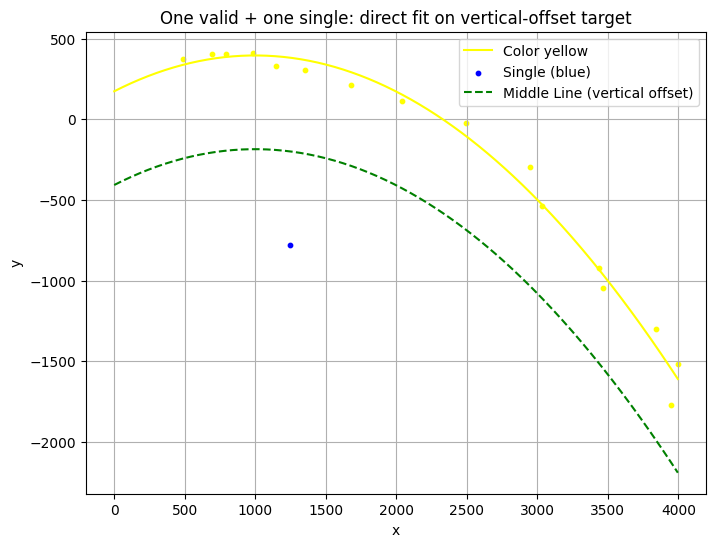

{'x_list': [np.float64(593.304931640625), np.float64(389.2293701171875), np.float64(693.304931640625), np.float64(1252.2200927734375), np.float64(1582.0382080078125), np.float64(884.4118041992188), np.float64(1938.0985107421875), np.float64(2851.056884765625), np.float64(1045.993408203125), np.float64(2394.127685546875), np.float64(3365.48486328125), np.float64(2936.13623046875), np.float64(3741.14453125), np.float64(3339.4833984375), np.float64(1149.321533203125), np.float64(3896.58447265625), np.float64(3845.684326171875)], 'y_list': [np.float64(406.3970947265625), np.float64(376.5016174316406), np.float64(406.3970947265625), np.float64(305.07513427734375), np.float64(210.3682861328125), np.float64(412.55889892578125), np.float64(113.6567153930664), np.float64(-296.9137878417969), np.float64(331.5050048828125), np.float64(-26.19003677368164), np.float64(-1046.9490966796875), np.float64(-536.4224243164062), np.float64(-1298.679443359375), np.float64(-923.2109375), np.float64(-780.7900

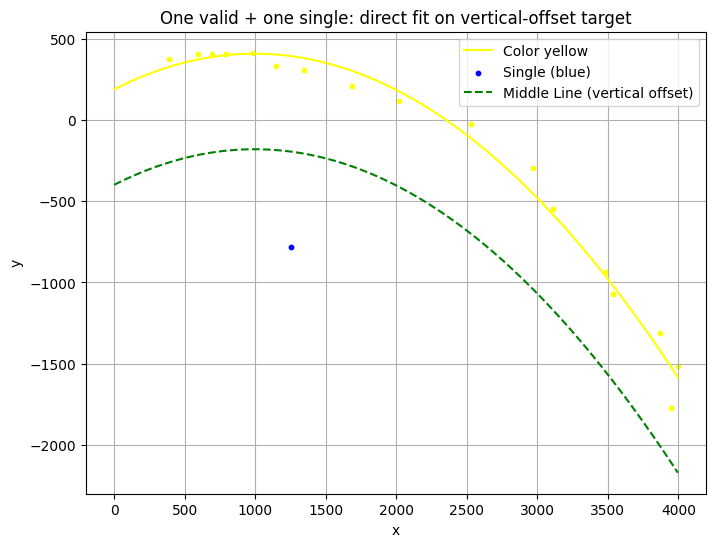

{'x_list': [np.float64(493.304931640625), np.float64(289.2293701171875), np.float64(593.304931640625), np.float64(693.304931640625), np.float64(1248.4637451171875), np.float64(1587.8184814453125), np.float64(882.3609619140625), np.float64(2868.518798828125), np.float64(1921.4609375), np.float64(1048.7415771484375), np.float64(2432.109375), np.float64(3438.187255859375), np.float64(3011.1025390625), np.float64(3770.466552734375), np.float64(3386.92431640625), np.float64(1152.592041015625), np.float64(3845.684326171875), np.float64(3896.58447265625)], 'y_list': [np.float64(406.3970947265625), np.float64(376.5016174316406), np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(304.2276916503906), np.float64(211.0911865234375), np.float64(412.6914978027344), np.float64(-298.6706848144531), np.float64(112.7289047241211), np.float64(332.29998779296875), np.float64(-26.5888671875), np.float64(-1068.9130859375), np.float64(-549.6674194335938), np.float64(-1312.22802734375), 

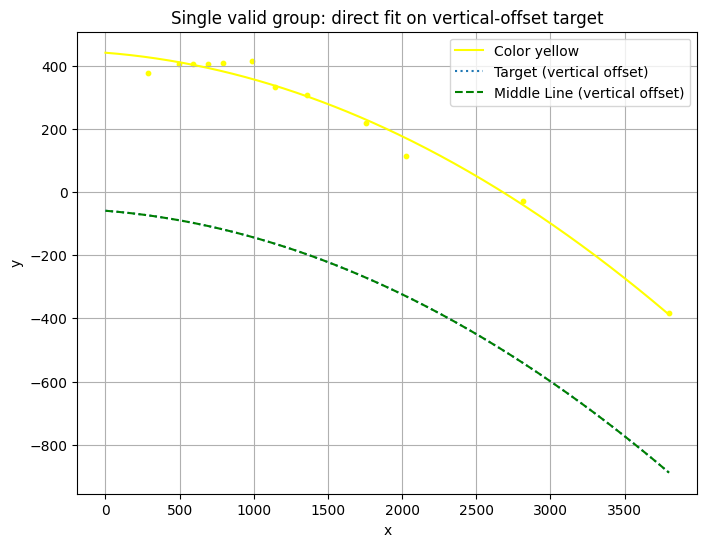

{'x_list': [np.float64(393.304931640625), np.float64(189.2293701171875), np.float64(493.304931640625), np.float64(593.304931640625), np.float64(694.675048828125), np.float64(1259.7955322265625), np.float64(1654.1256103515625), np.float64(888.539306640625), np.float64(3700.603515625), np.float64(1929.74560546875), np.float64(1045.993408203125), np.float64(2718.2236328125), np.float64(1152.592041015625)], 'y_list': [np.float64(406.3970947265625), np.float64(376.5016174316406), np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(407.0989990234375), np.float64(306.78424072265625), np.float64(219.38406372070312), np.float64(414.2887268066406), np.float64(-382.38897705078125), np.float64(113.19091796875), np.float64(331.5050048828125), np.float64(-29.59326171875), np.float64(-782.833984375)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]}


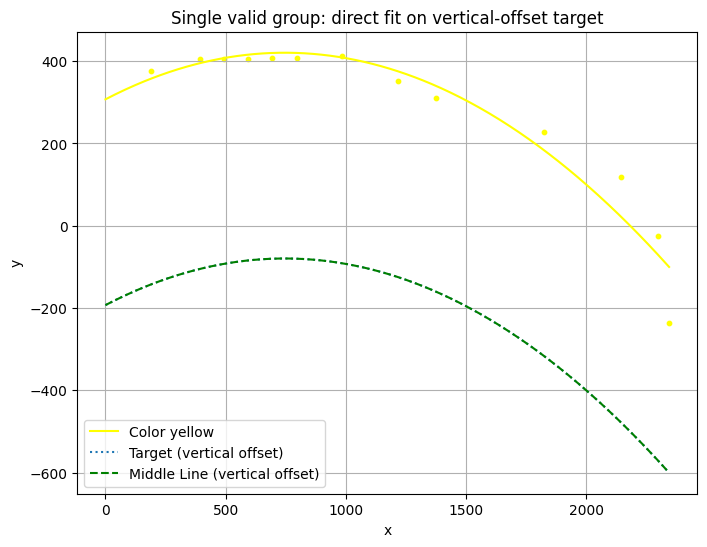

{'x_list': [np.float64(293.304931640625), np.float64(89.2293701171875), np.float64(393.304931640625), np.float64(493.304931640625), np.float64(594.675048828125), np.float64(694.675048828125), np.float64(1275.203857421875), np.float64(1725.855712890625), np.float64(2244.297607421875), np.float64(1115.8001708984375), np.float64(884.4118041992188), np.float64(2043.9736328125), np.float64(2198.7353515625), np.float64(1155.8795166015625)], 'y_list': [np.float64(406.3970947265625), np.float64(376.5016174316406), np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(407.0989990234375), np.float64(407.0989990234375), np.float64(311.6094665527344), np.float64(228.3551483154297), np.float64(-235.8660888671875), np.float64(351.6982116699219), np.float64(412.55889892578125), np.float64(119.56096649169922), np.float64(-24.138282775878906), np.float64(-784.8886108398438)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]}


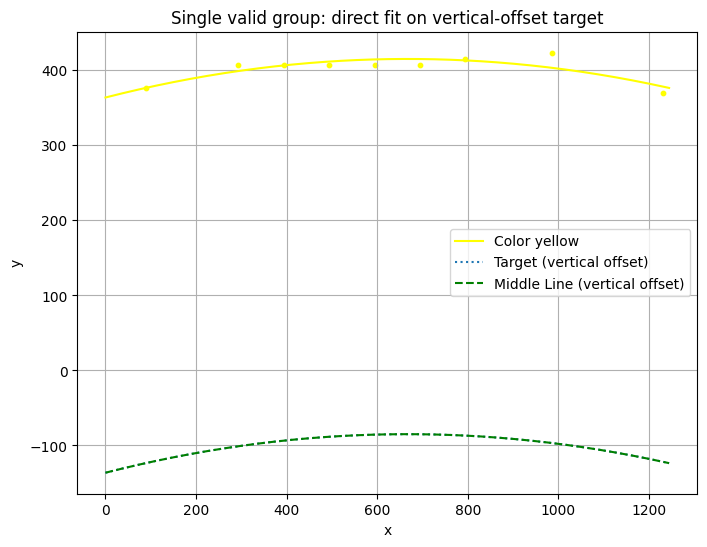

{'x_list': [np.float64(193.304931640625), np.float64(-10.7706298828125), np.float64(293.304931640625), np.float64(393.304931640625), np.float64(494.675048828125), np.float64(594.675048828125), np.float64(693.7507934570312), np.float64(886.844482421875), np.float64(1130.41650390625)], 'y_list': [np.float64(406.3970947265625), np.float64(376.5016174316406), np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(407.0989990234375), np.float64(407.0989990234375), np.float64(415.3232116699219), np.float64(423.3840026855469), np.float64(369.1336669921875)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0]}


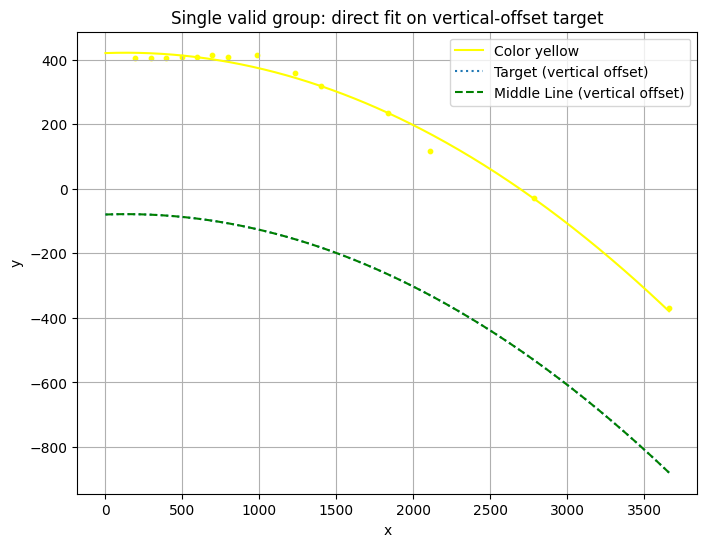

{'x_list': [np.float64(93.304931640625), np.float64(193.304931640625), np.float64(293.304931640625), np.float64(394.675048828125), np.float64(494.675048828125), np.float64(593.7507934570312), np.float64(694.675048828125), np.float64(1737.5281982421875), np.float64(1298.4686279296875), np.float64(1131.4273681640625), np.float64(886.4712524414062), np.float64(3560.59326171875), np.float64(2005.203369140625), np.float64(2683.745361328125), np.float64(1155.411376953125)], 'y_list': [np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(407.0989990234375), np.float64(407.0989990234375), np.float64(415.3232116699219), np.float64(407.9214172363281), np.float64(233.63259887695312), np.float64(318.3698425292969), np.float64(359.8910827636719), np.float64(415.4143981933594), np.float64(-368.43316650390625), np.float64(117.52589416503906), np.float64(-29.262609481811523), np.float64(-787.3883056640625)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

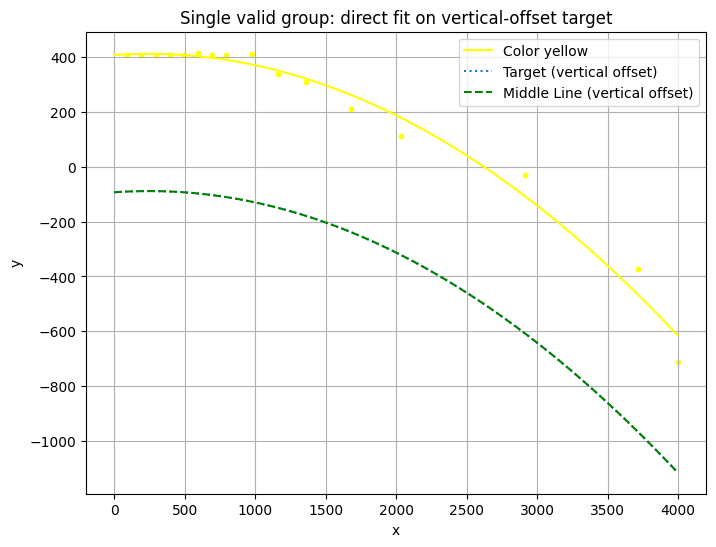

{'x_list': [np.float64(-6.695068359375), np.float64(93.304931640625), np.float64(193.304931640625), np.float64(294.675048828125), np.float64(394.675048828125), np.float64(493.75079345703125), np.float64(594.675048828125), np.float64(694.675048828125), np.float64(1259.2958984375), np.float64(1580.8165283203125), np.float64(880.318603515625), np.float64(3614.824462890625), np.float64(1936.63037109375), np.float64(1059.8675537109375), np.float64(2815.022216796875), np.float64(3898.5732421875), np.float64(1138.6875)], 'y_list': [np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(407.0989990234375), np.float64(407.0989990234375), np.float64(415.3232116699219), np.float64(407.9214172363281), np.float64(407.9214172363281), np.float64(308.1180725097656), np.float64(211.99905395507812), np.float64(411.83349609375), np.float64(-373.8914489746094), np.float64(111.6971206665039), np.float64(337.8243713378906), np.float64(-30.631622314453125), np

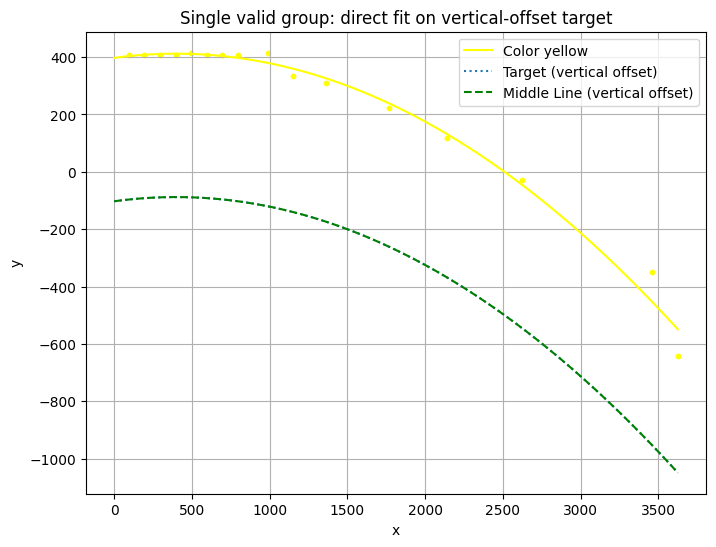

{'x_list': [np.float64(-6.695068359375), np.float64(93.304931640625), np.float64(194.675048828125), np.float64(294.675048828125), np.float64(393.75079345703125), np.float64(494.675048828125), np.float64(594.675048828125), np.float64(693.304931640625), np.float64(1259.7955322265625), np.float64(1666.103515625), np.float64(886.4712524414062), np.float64(2043.201416015625), np.float64(1048.7415771484375), np.float64(3358.62939453125), np.float64(2524.458740234375), np.float64(3524.60595703125), np.float64(1151.6580810546875)], 'y_list': [np.float64(406.3970947265625), np.float64(406.3970947265625), np.float64(407.0989990234375), np.float64(407.0989990234375), np.float64(415.3232116699219), np.float64(407.9214172363281), np.float64(407.9214172363281), np.float64(407.2181091308594), np.float64(309.4519348144531), np.float64(222.6752471923828), np.float64(414.418212890625), np.float64(117.49957275390625), np.float64(333.44189453125), np.float64(-348.1058044433594), np.float64(-27.56845664978

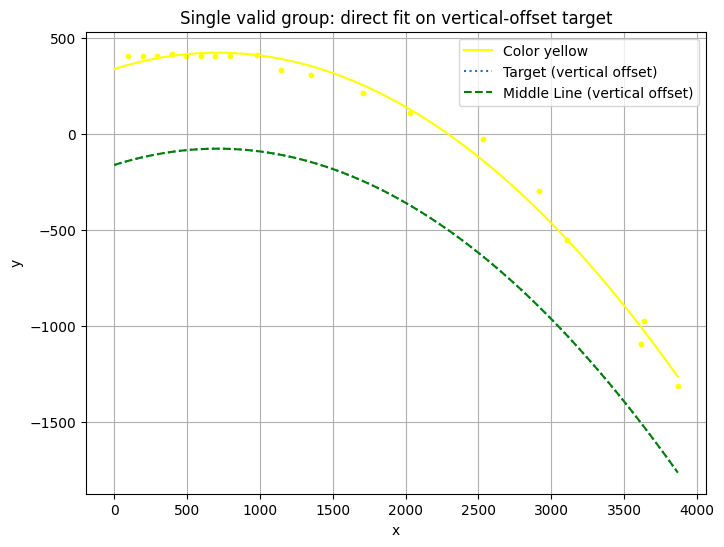

{'x_list': [np.float64(-6.695068359375), np.float64(94.675048828125), np.float64(194.675048828125), np.float64(293.75079345703125), np.float64(394.675048828125), np.float64(494.675048828125), np.float64(593.304931640625), np.float64(693.304931640625), np.float64(1252.2200927734375), np.float64(1604.780517578125), np.float64(882.3609619140625), np.float64(1929.0145263671875), np.float64(1043.2584228515625), np.float64(2431.203857421875), np.float64(2816.7421875), np.float64(3010.00146484375), np.float64(3514.005615234375), np.float64(1151.6580810546875), np.float64(3769.104736328125), np.float64(3537.439208984375)], 'y_list': [np.float64(406.3970947265625), np.float64(407.0989990234375), np.float64(407.0989990234375), np.float64(415.3232116699219), np.float64(407.9214172363281), np.float64(407.9214172363281), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(307.72796630859375), np.float64(214.94346618652344), np.float64(412.6914978027344), np.float64(111.23934173

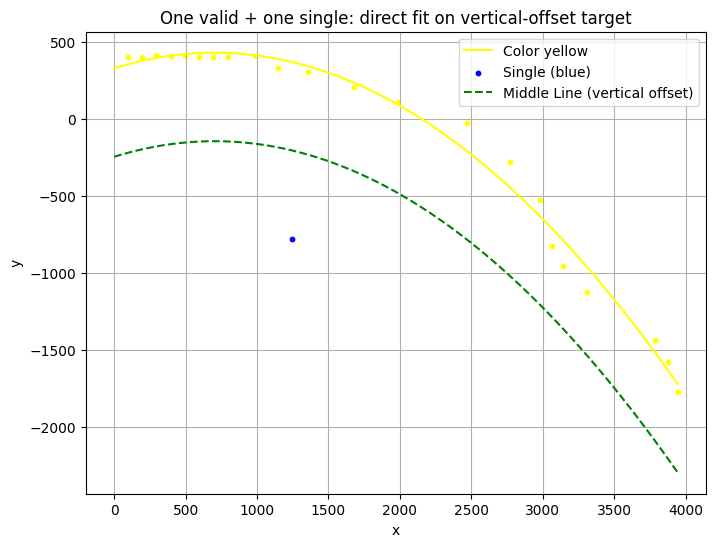

{'x_list': [np.float64(-5.324951171875), np.float64(94.675048828125), np.float64(193.75079345703125), np.float64(294.675048828125), np.float64(394.675048828125), np.float64(493.304931640625), np.float64(593.304931640625), np.float64(693.304931640625), np.float64(1255.9971923828125), np.float64(1575.6885986328125), np.float64(1043.2584228515625), np.float64(1888.2713623046875), np.float64(882.3609619140625), np.float64(2368.55029296875), np.float64(2671.7109375), np.float64(3778.636474609375), np.float64(2882.240478515625), np.float64(3686.476318359375), np.float64(3212.762939453125), np.float64(3042.613525390625), np.float64(2964.26708984375), np.float64(1145.603515625), np.float64(3845.684326171875)], 'y_list': [np.float64(407.0989990234375), np.float64(407.0989990234375), np.float64(415.3232116699219), np.float64(407.9214172363281), np.float64(407.9214172363281), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(307.2574157714844)

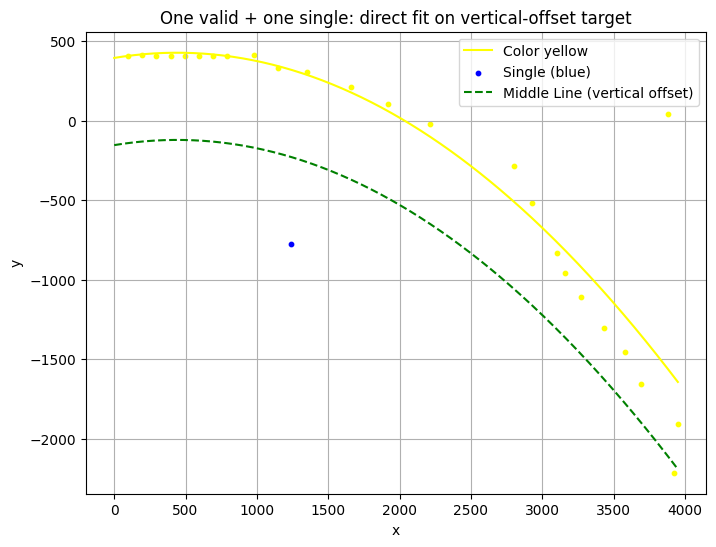

{'x_list': [np.float64(-5.324951171875), np.float64(93.75079345703125), np.float64(194.675048828125), np.float64(294.675048828125), np.float64(393.304931640625), np.float64(493.304931640625), np.float64(593.304931640625), np.float64(693.304931640625), np.float64(1248.4637451171875), np.float64(1558.705322265625), np.float64(1045.993408203125), np.float64(882.3609619140625), np.float64(1818.9129638671875), np.float64(2702.6796875), np.float64(2116.209716796875), np.float64(3478.1787109375), np.float64(2830.224609375), np.float64(3329.50146484375), np.float64(3170.017578125), np.float64(3779.998291015625), np.float64(3062.2548828125), np.float64(3000.770751953125), np.float64(1139.149658203125), np.float64(3849.832763671875), np.float64(3588.357177734375), np.float64(3822.19384765625)], 'y_list': [np.float64(407.0989990234375), np.float64(415.3232116699219), np.float64(407.9214172363281), np.float64(407.9214172363281), np.float64(407.2181091308594), np.float64(407.2181091308594), np.floa

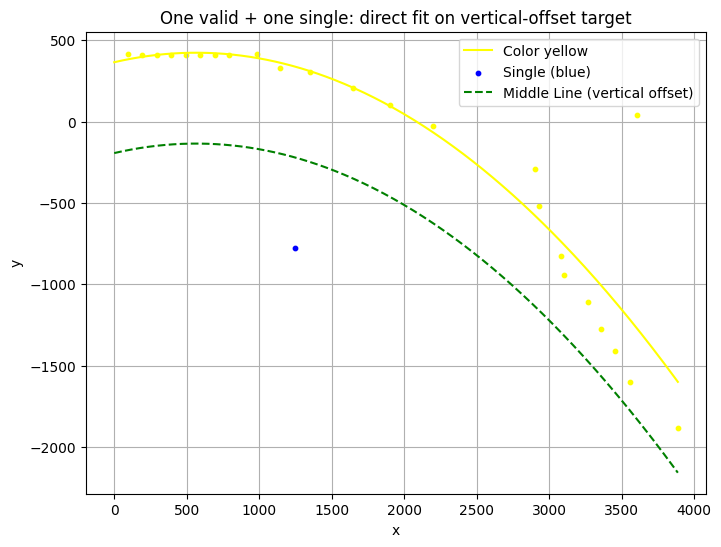

{'x_list': [np.float64(-6.24920654296875), np.float64(94.675048828125), np.float64(194.675048828125), np.float64(293.304931640625), np.float64(393.304931640625), np.float64(493.304931640625), np.float64(593.304931640625), np.float64(693.304931640625), np.float64(1252.2200927734375), np.float64(1547.5731201171875), np.float64(882.3609619140625), np.float64(1043.2584228515625), np.float64(1804.152099609375), np.float64(2799.88232421875), np.float64(2096.68359375), np.float64(3356.471923828125), np.float64(2830.224609375), np.float64(3261.365966796875), np.float64(3170.017578125), np.float64(3504.821044921875), np.float64(3004.053955078125), np.float64(2981.86376953125), np.float64(1145.603515625), np.float64(3788.16845703125), np.float64(3459.3935546875)], 'y_list': [np.float64(415.3232116699219), np.float64(407.9214172363281), np.float64(407.9214172363281), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.floa

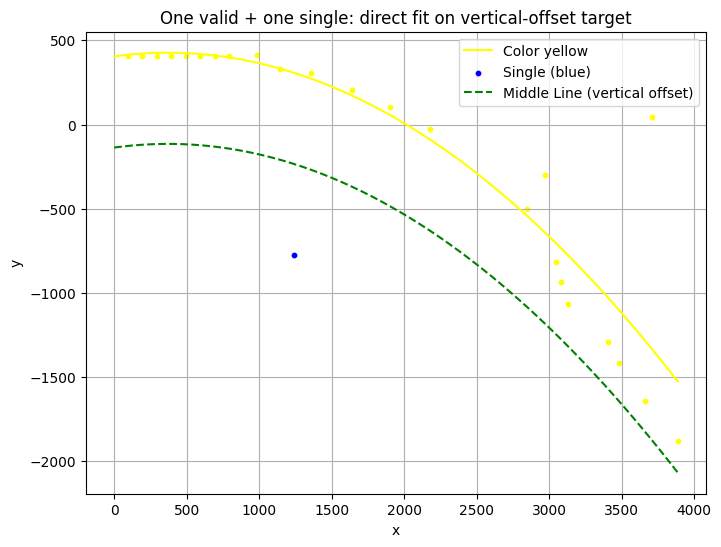

{'x_list': [np.float64(-5.324951171875), np.float64(94.675048828125), np.float64(193.304931640625), np.float64(293.304931640625), np.float64(393.304931640625), np.float64(493.304931640625), np.float64(593.304931640625), np.float64(691.9395751953125), np.float64(1255.9971923828125), np.float64(1542.0628662109375), np.float64(882.3609619140625), np.float64(2868.518798828125), np.float64(1045.993408203125), np.float64(1804.152099609375), np.float64(2077.49853515625), np.float64(3380.146484375), np.float64(2747.449951171875), np.float64(3306.48486328125), np.float64(3028.720458984375), np.float64(3610.0712890625), np.float64(2985.126953125), np.float64(2944.73291015625), np.float64(1142.3681640625), np.float64(3788.16845703125), np.float64(3561.822021484375)], 'y_list': [np.float64(407.9214172363281), np.float64(407.9214172363281), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.fl

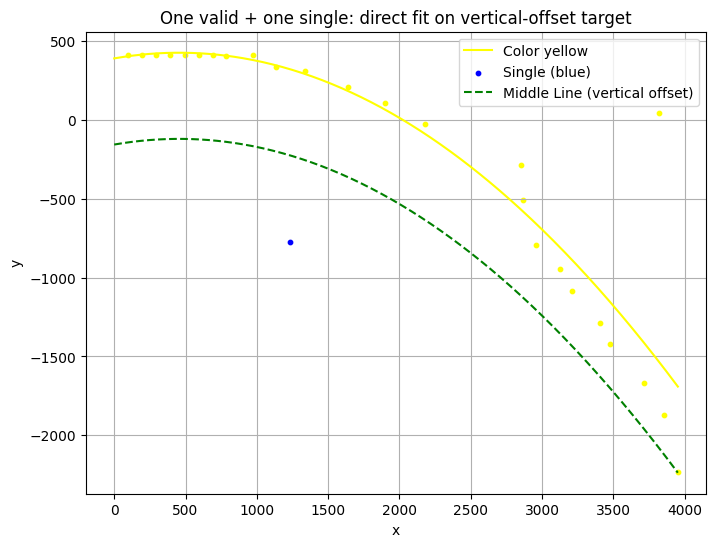

{'x_list': [np.float64(-5.324951171875), np.float64(93.304931640625), np.float64(193.304931640625), np.float64(293.304931640625), np.float64(393.304931640625), np.float64(493.304931640625), np.float64(591.9395751953125), np.float64(684.5735473632812), np.float64(1240.52099609375), np.float64(1536.5892333984375), np.float64(1796.8565673828125), np.float64(875.8900146484375), np.float64(2750.45263671875), np.float64(2077.49853515625), np.float64(1037.8272705078125), np.float64(3380.146484375), np.float64(2763.62841796875), np.float64(3107.9287109375), np.float64(3306.48486328125), np.float64(3721.652099609375), np.float64(3023.21484375), np.float64(2855.705810546875), np.float64(1132.302490234375), np.float64(3615.279296875), np.float64(3758.71240234375), np.float64(3852.598388671875)], 'y_list': [np.float64(407.9214172363281), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.floa

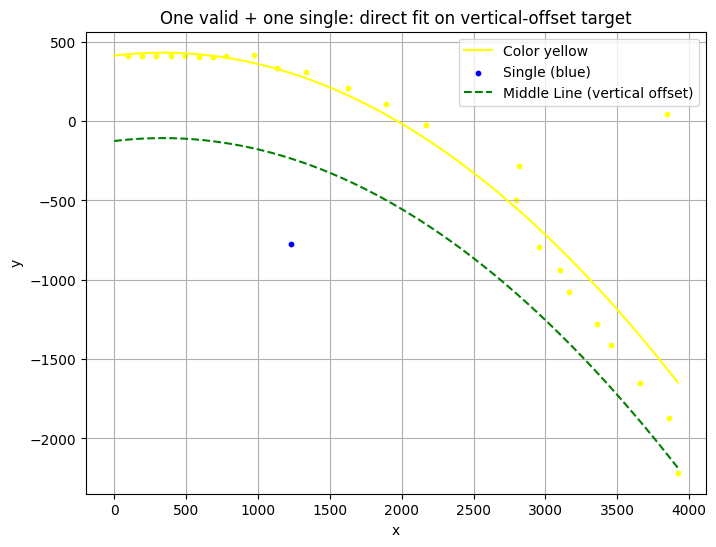

{'x_list': [np.float64(-6.695068359375), np.float64(93.304931640625), np.float64(193.304931640625), np.float64(293.304931640625), np.float64(393.304931640625), np.float64(491.9395751953125), np.float64(584.5735473632812), np.float64(677.4403686523438), np.float64(1788.2550048828125), np.float64(1529.374267578125), np.float64(1231.1953125), np.float64(1031.1822509765625), np.float64(2066.480224609375), np.float64(2716.420654296875), np.float64(870.39453125), np.float64(2698.01025390625), np.float64(3747.9013671875), np.float64(2854.66259765625), np.float64(3355.258544921875), np.float64(3002.95947265625), np.float64(3066.714599609375), np.float64(3559.25537109375), np.float64(3260.1845703125), np.float64(3820.821533203125), np.float64(3758.71240234375), np.float64(1130.4635009765625)], 'y_list': [np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(406.5172119140625), np.floa

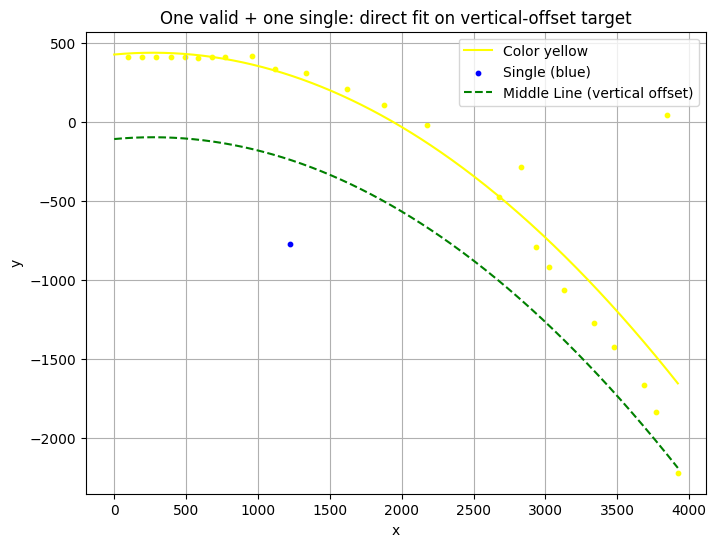

{'x_list': [np.float64(-6.695068359375), np.float64(93.304931640625), np.float64(193.304931640625), np.float64(293.304931640625), np.float64(391.9395751953125), np.float64(484.57354736328125), np.float64(577.4403686523438), np.float64(668.4166259765625), np.float64(1773.2742919921875), np.float64(1230.705322265625), np.float64(2075.16162109375), np.float64(1019.33251953125), np.float64(1518.030517578125), np.float64(2731.324951171875), np.float64(861.3623657226562), np.float64(2836.447021484375), np.float64(2577.997314453125), np.float64(3746.550048828125), np.float64(2927.569091796875), np.float64(3378.924560546875), np.float64(3026.518310546875), np.float64(3585.77197265625), np.float64(3820.821533203125), np.float64(3236.904541015625), np.float64(3671.64208984375), np.float64(1124.09033203125)], 'y_list': [np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(406.5172119140625), np.float64(404.673797607

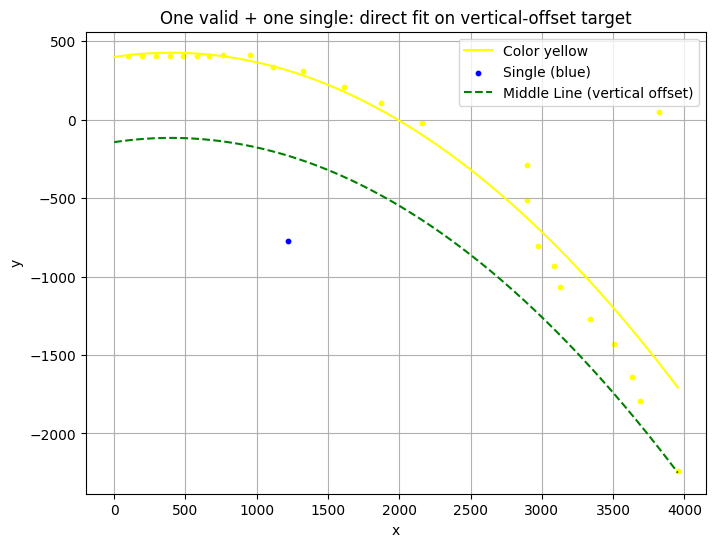

{'x_list': [np.float64(-6.695068359375), np.float64(93.304931640625), np.float64(193.304931640625), np.float64(291.9395751953125), np.float64(384.57354736328125), np.float64(477.44036865234375), np.float64(568.4166259765625), np.float64(662.69921875), np.float64(1513.294921875), np.float64(1773.949951171875), np.float64(1016.300537109375), np.float64(1227.5482177734375), np.float64(2798.851318359375), np.float64(853.200439453125), np.float64(2057.87353515625), np.float64(2873.09228515625), np.float64(3720.31103515625), np.float64(2795.5185546875), np.float64(3535.666259765625), np.float64(2985.126953125), np.float64(3853.981201171875), np.float64(3239.251708984375), np.float64(3028.720458984375), np.float64(3590.9423828125), np.float64(3404.1474609375), np.float64(1117.3729248046875)], 'y_list': [np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(406.5172119140625), np.float64(404.6737976074219), np.float64(408.386962890625), np.floa

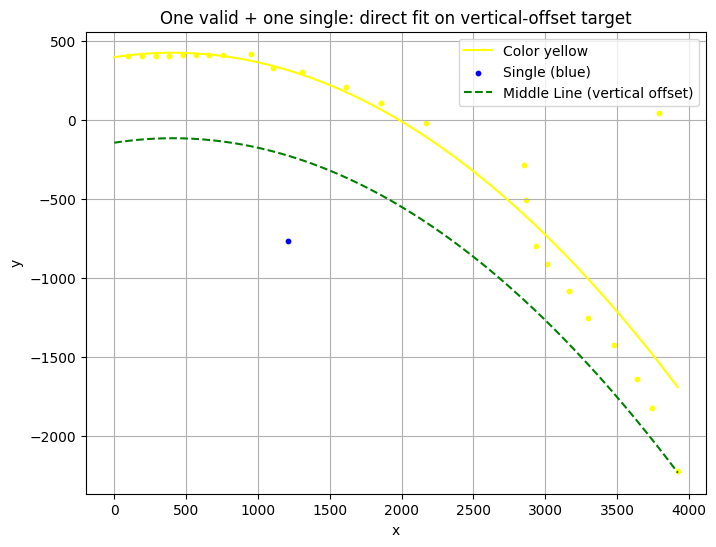

{'x_list': [np.float64(-6.695068359375), np.float64(93.304931640625), np.float64(191.9395751953125), np.float64(284.57354736328125), np.float64(377.44036865234375), np.float64(468.4166259765625), np.float64(562.69921875), np.float64(659.8690185546875), np.float64(1513.294921875), np.float64(1759.189453125), np.float64(1005.96435546875), np.float64(2749.43896484375), np.float64(2067.255859375), np.float64(1205.5975341796875), np.float64(2838.521240234375), np.float64(851.2709350585938), np.float64(3691.80126953125), np.float64(2762.614990234375), np.float64(2910.60986328125), np.float64(3822.19384765625), np.float64(3535.666259765625), np.float64(3067.829345703125), np.float64(3195.884765625), np.float64(3645.220703125), np.float64(3380.146484375), np.float64(1108.103515625)], 'y_list': [np.float64(407.2181091308594), np.float64(407.2181091308594), np.float64(406.5172119140625), np.float64(404.6737976074219), np.float64(408.386962890625), np.float64(409.0694885253906), np.float64(410.31

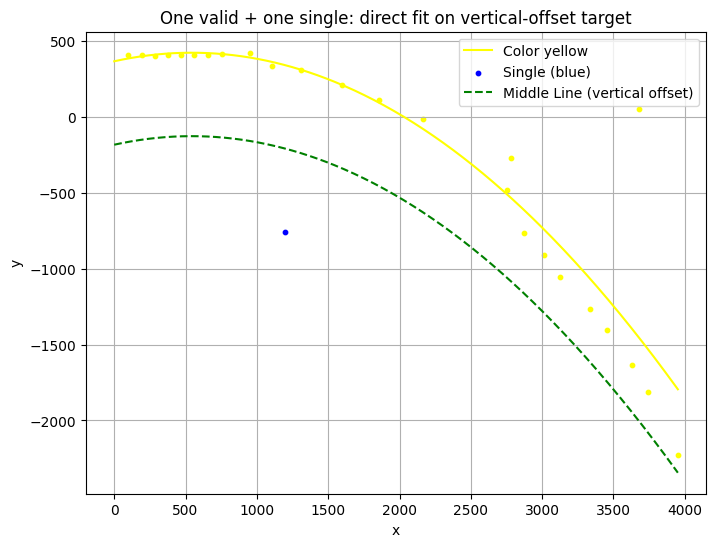

{'x_list': [np.float64(-6.695068359375), np.float64(91.9395751953125), np.float64(184.57354736328125), np.float64(277.44036865234375), np.float64(368.4166259765625), np.float64(462.69921875), np.float64(559.8690185546875), np.float64(655.216552734375), np.float64(1008.1165771484375), np.float64(848.62841796875), np.float64(1208.1619873046875), np.float64(1496.94873046875), np.float64(2684.135986328125), np.float64(1758.5189208984375), np.float64(2652.141357421875), np.float64(3355.258544921875), np.float64(2066.480224609375), np.float64(2909.548095703125), np.float64(3581.89404296875), np.float64(3027.619384765625), np.float64(2770.72314453125), np.float64(3851.215576171875), np.float64(3645.220703125), np.float64(3238.078125), np.float64(3533.117919921875), np.float64(1095.0654296875)], 'y_list': [np.float64(407.2181091308594), np.float64(406.5172119140625), np.float64(404.6737976074219), np.float64(408.386962890625), np.float64(409.0694885253906), np.float64(410.310546875), np.float6

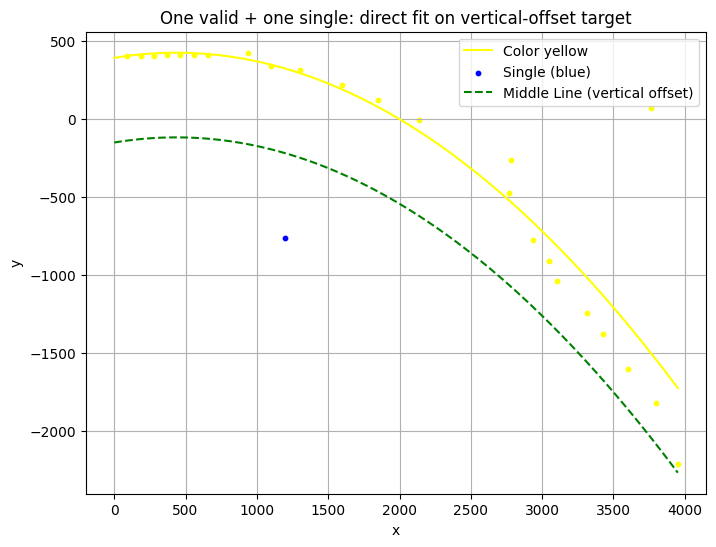

{'x_list': [np.float64(-8.0604248046875), np.float64(84.57354736328125), np.float64(177.44036865234375), np.float64(268.4166259765625), np.float64(362.69921875), np.float64(459.8690185546875), np.float64(555.216552734375), np.float64(1200.6494140625), np.float64(1496.3677978515625), np.float64(838.0718383789062), np.float64(2683.14501953125), np.float64(1750.221923828125), np.float64(2835.409912109375), np.float64(997.1068115234375), np.float64(2665.302734375), np.float64(2037.05419921875), np.float64(3851.215576171875), np.float64(3661.0712890625), np.float64(2944.73291015625), np.float64(3504.821044921875), np.float64(3006.24267578125), np.float64(3213.9287109375), np.float64(3698.457275390625), np.float64(3329.50146484375), np.float64(1100.650634765625)], 'y_list': [np.float64(406.5172119140625), np.float64(404.6737976074219), np.float64(408.386962890625), np.float64(409.0694885253906), np.float64(410.310546875), np.float64(409.7383728027344), np.float64(413.2161560058594), np.float

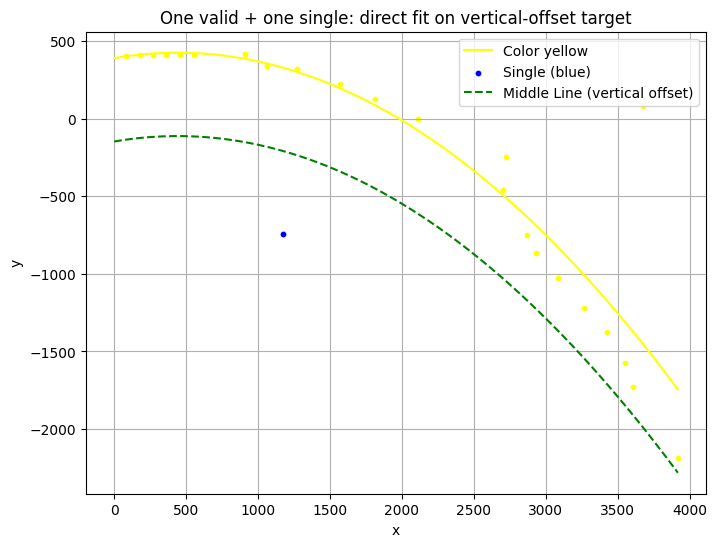

{'x_list': [np.float64(-15.42645263671875), np.float64(77.44036865234375), np.float64(168.4166259765625), np.float64(262.69921875), np.float64(359.8690185546875), np.float64(455.216552734375), np.float64(808.671142578125), np.float64(1714.89892578125), np.float64(2603.915771484375), np.float64(2620.703125), np.float64(2766.6689453125), np.float64(963.2801513671875), np.float64(1468.498046875), np.float64(2008.376708984375), np.float64(1171.3895263671875), np.float64(3818.077392578125), np.float64(3578.01611328125), np.float64(3451.908935546875), np.float64(2986.214599609375), np.float64(2835.409912109375), np.float64(3168.86669921875), np.float64(1071.3267822265625), np.float64(3328.296142578125), np.float64(3507.351318359375)], 'y_list': [np.float64(404.6737976074219), np.float64(408.386962890625), np.float64(409.0694885253906), np.float64(410.310546875), np.float64(409.7383728027344), np.float64(413.2161560058594), np.float64(419.7802429199219), np.float64(126.04829406738281), np.flo

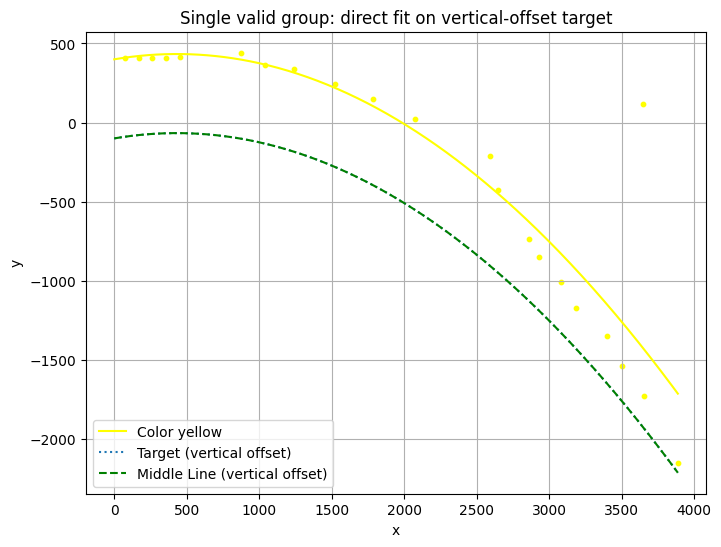

{'x_list': [np.float64(-22.55963134765625), np.float64(68.4166259765625), np.float64(162.69921875), np.float64(259.8690185546875), np.float64(355.216552734375), np.float64(772.59326171875), np.float64(1140.1181640625), np.float64(1977.43359375), np.float64(2490.134033203125), np.float64(939.149658203125), np.float64(1424.2685546875), np.float64(2763.62841796875), np.float64(1684.71826171875), np.float64(2832.298583984375), np.float64(2543.23583984375), np.float64(3556.68896484375), np.float64(3400.456787109375), np.float64(2981.86376953125), np.float64(3547.70556640625), np.float64(3786.806640625), np.float64(3301.696044921875), np.float64(3083.265380859375)], 'y_list': [np.float64(408.386962890625), np.float64(409.0694885253906), np.float64(410.310546875), np.float64(409.7383728027344), np.float64(413.2161560058594), np.float64(441.2743225097656), np.float64(337.5004577636719), np.float64(23.908742904663086), np.float64(-214.65220642089844), np.float64(362.358154296875), np.float64(24

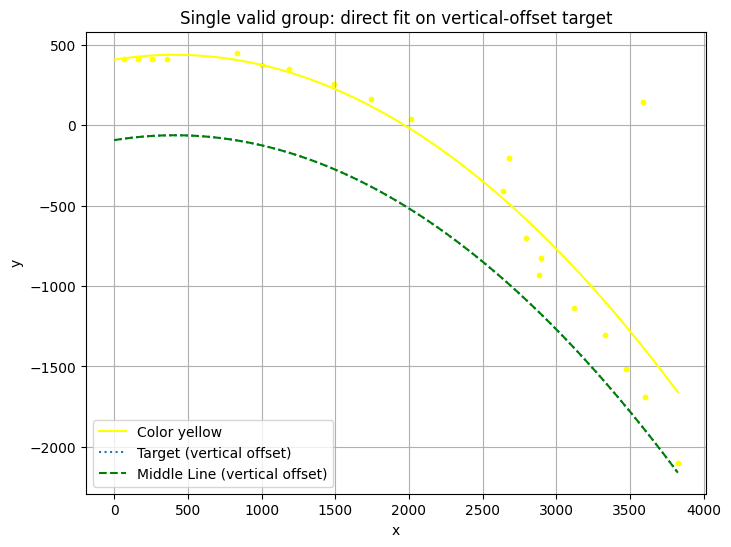

{'x_list': [np.float64(-31.5833740234375), np.float64(62.69921875), np.float64(159.8690185546875), np.float64(255.216552734375), np.float64(732.7897338867188), np.float64(903.2623291015625), np.float64(1089.0909423828125), np.float64(1913.96875), np.float64(2582.81689453125), np.float64(2539.48046875), np.float64(1642.9501953125), np.float64(3231.03662109375), np.float64(3490.90478515625), np.float64(2696.028076171875), np.float64(1392.931396484375), np.float64(2784.0693359375), np.float64(3725.67578125), np.float64(2795.5185546875), np.float64(3021.0126953125), np.float64(3374.037353515625), np.float64(3502.290771484375)], 'y_list': [np.float64(409.0694885253906), np.float64(410.310546875), np.float64(409.7383728027344), np.float64(413.2161560058594), np.float64(450.3963928222656), np.float64(372.84075927734375), np.float64(347.388671875), np.float64(38.714019775390625), np.float64(-202.24954223632812), np.float64(-408.5144348144531), np.float64(160.41607666015625), np.float64(-1303.2

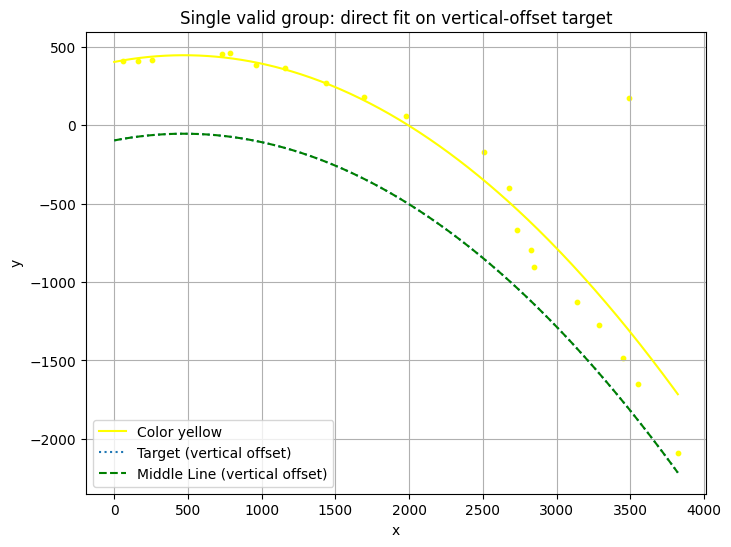

{'x_list': [np.float64(-37.30078125), np.float64(59.8690185546875), np.float64(155.216552734375), np.float64(632.7897338867188), np.float64(688.2552490234375), np.float64(858.3082885742188), np.float64(1057.7078857421875), np.float64(1879.604736328125), np.float64(1591.793212890625), np.float64(2404.868408203125), np.float64(1336.761474609375), np.float64(2633.30615234375), np.float64(2578.96337890625), np.float64(3721.652099609375), np.float64(3390.614990234375), np.float64(2749.46533203125), np.float64(2727.444091796875), np.float64(3184.301513671875), np.float64(3038.181884765625), np.float64(3346.76416015625), np.float64(3448.166748046875)], 'y_list': [np.float64(410.310546875), np.float64(409.7383728027344), np.float64(413.2161560058594), np.float64(450.3963928222656), np.float64(460.6102600097656), np.float64(382.8895568847656), np.float64(363.1900329589844), np.float64(59.046627044677734), np.float64(175.69491577148438), np.float64(-172.28712463378906), np.float64(269.0853576660

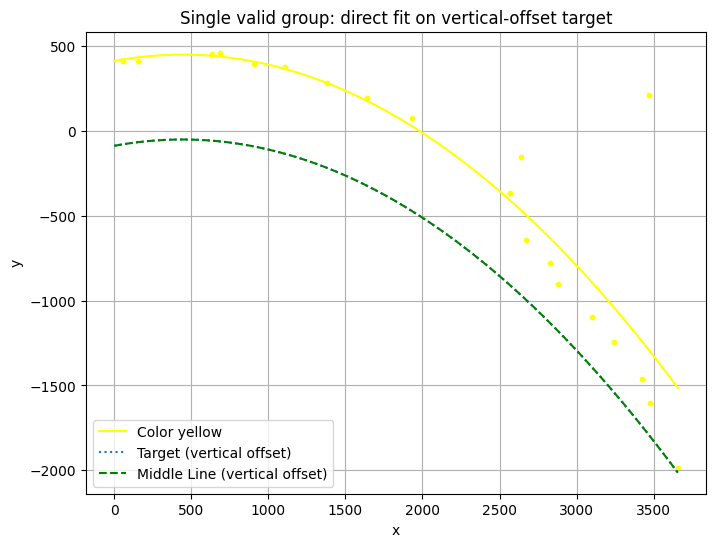

{'x_list': [np.float64(-40.1309814453125), np.float64(55.216552734375), np.float64(532.7897338867188), np.float64(588.2552490234375), np.float64(810.1273803710938), np.float64(1539.0799560546875), np.float64(1832.5108642578125), np.float64(1010.7877197265625), np.float64(1281.0069580078125), np.float64(2468.142333984375), np.float64(2536.457275390625), np.float64(2727.444091796875), np.float64(3374.037353515625), np.float64(3556.68896484375), np.float64(2574.201904296875), np.float64(3323.47509765625), np.float64(2781.01123046875), np.float64(3142.195068359375), np.float64(3366.706787109375), np.float64(2998.58203125)], 'y_list': [np.float64(409.7383728027344), np.float64(413.2161560058594), np.float64(450.3963928222656), np.float64(460.6102600097656), np.float64(395.4263610839844), np.float64(192.70260620117188), np.float64(78.12368774414062), np.float64(376.2840576171875), np.float64(282.1822204589844), np.float64(-363.85223388671875), np.float64(-156.2080078125), np.float64(-775.802

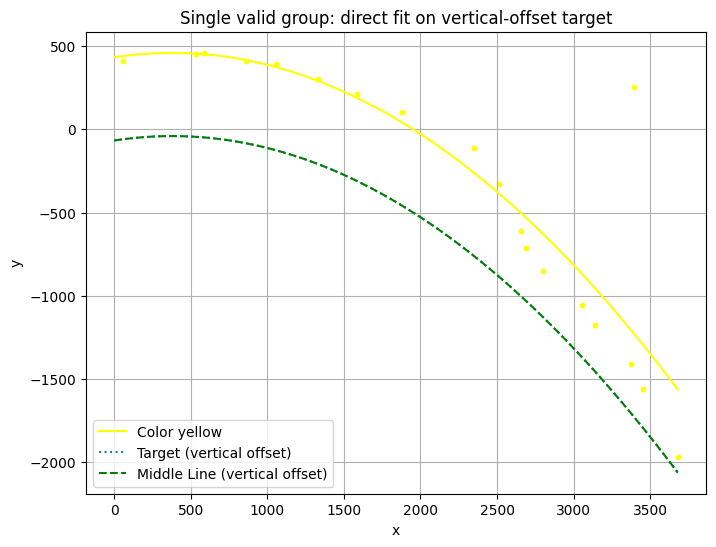

{'x_list': [np.float64(-44.783447265625), np.float64(432.78973388671875), np.float64(488.2552490234375), np.float64(760.5990600585938), np.float64(959.2984619140625), np.float64(1779.04052734375), np.float64(2414.728759765625), np.float64(2247.902099609375), np.float64(1487.7098388671875), np.float64(1227.764892578125), np.float64(2558.1650390625), np.float64(3580.601318359375), np.float64(2589.456298828125), np.float64(3294.512939453125), np.float64(3276.639404296875), np.float64(2957.7802734375), np.float64(2699.9921875), np.float64(3350.40478515625), np.float64(3040.397705078125)], 'y_list': [np.float64(413.2161560058594), np.float64(450.3963928222656), np.float64(460.6102600097656), np.float64(411.69024658203125), np.float64(395.4014892578125), np.float64(105.01362609863281), np.float64(-327.8241271972656), np.float64(-110.06103515625), np.float64(213.35447692871094), np.float64(302.1927185058594), np.float64(-612.2345581054688), np.float64(-1966.8406982421875), np.float64(-713.000

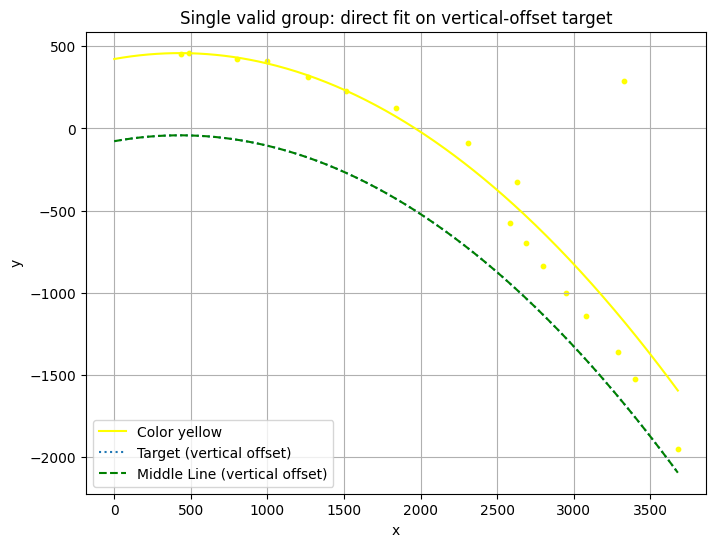

{'x_list': [np.float64(332.78973388671875), np.float64(388.2552490234375), np.float64(702.9962768554688), np.float64(897.6533203125), np.float64(1163.8387451171875), np.float64(1739.9901123046875), np.float64(1414.801025390625), np.float64(2212.65185546875), np.float64(2586.5947265625), np.float64(2531.03076171875), np.float64(3579.308837890625), np.float64(3226.342529296875), np.float64(3186.6181640625), np.float64(3300.498779296875), np.float64(2485.9775390625), np.float64(2697.019287109375), np.float64(2979.6884765625), np.float64(2848.403564453125)], 'y_list': [np.float64(450.3963928222656), np.float64(460.6102600097656), np.float64(422.9962463378906), np.float64(407.7249450683594), np.float64(314.955322265625), np.float64(126.1528091430664), np.float64(230.6970672607422), np.float64(-86.37728118896484), np.float64(-697.7218627929688), np.float64(-323.3028259277344), np.float64(-1949.5875244140625), np.float64(288.2156982421875), np.float64(-1357.42919921875), np.float64(-1524.4230

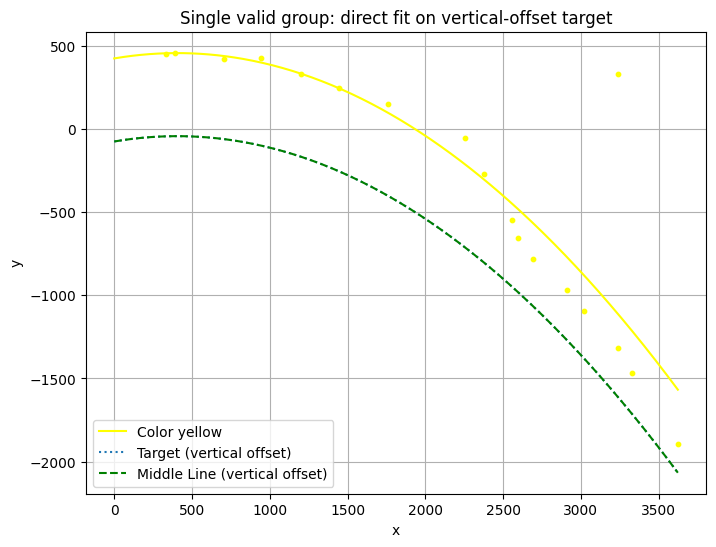

{'x_list': [np.float64(232.78973388671875), np.float64(288.2552490234375), np.float64(602.9962768554688), np.float64(844.5580444335938), np.float64(1098.009033203125), np.float64(1662.330810546875), np.float64(2154.415771484375), np.float64(1342.61279296875), np.float64(2276.209228515625), np.float64(2455.949462890625), np.float64(3136.477783203125), np.float64(2920.092041015625), np.float64(2498.452392578125), np.float64(3522.9248046875), np.float64(2811.224609375), np.float64(3229.86328125), np.float64(3139.908203125), np.float64(2589.456298828125)], 'y_list': [np.float64(450.3963928222656), np.float64(460.6102600097656), np.float64(422.9962463378906), np.float64(427.2201843261719), np.float64(332.13726806640625), np.float64(150.19375610351562), np.float64(-54.11164474487305), np.float64(250.10179138183594), np.float64(-267.5691833496094), np.float64(-549.0675659179688), np.float64(329.664794921875), np.float64(-1092.0831298828125), np.float64(-653.82568359375), np.float64(-1894.5257

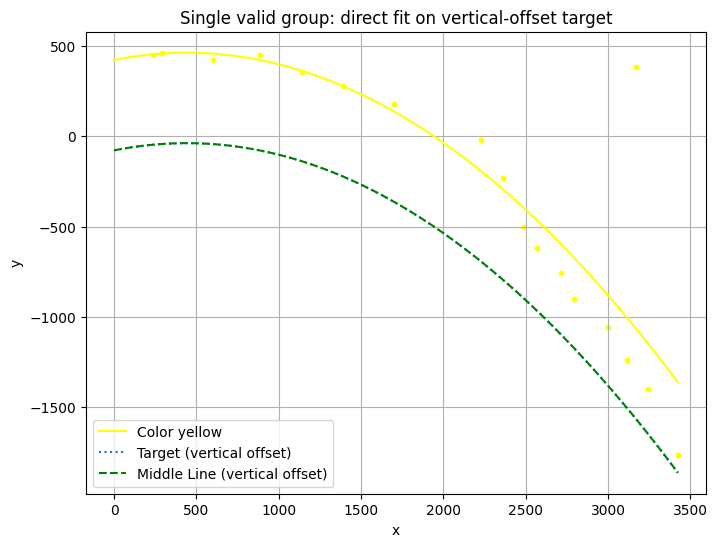

{'x_list': [np.float64(132.78973388671875), np.float64(188.2552490234375), np.float64(502.99627685546875), np.float64(1291.8870849609375), np.float64(783.22509765625), np.float64(2129.28466796875), np.float64(1602.302978515625), np.float64(1040.4456787109375), np.float64(2260.720458984375), np.float64(2388.819091796875), np.float64(3141.0517578125), np.float64(3324.680419921875), np.float64(3016.608154296875), np.float64(2468.142333984375), np.float64(2899.991943359375), np.float64(3070.924560546875), np.float64(2614.674560546875), np.float64(2695.037109375)], 'y_list': [np.float64(450.3963928222656), np.float64(460.6102600097656), np.float64(422.9962463378906), np.float64(276.4047546386719), np.float64(446.307861328125), np.float64(-19.3046932220459), np.float64(178.5684356689453), np.float64(354.2888488769531), np.float64(-232.4492645263672), np.float64(-504.6112365722656), np.float64(-1398.0228271484375), np.float64(-1763.1619873046875), np.float64(-1237.486572265625), np.float64(-6

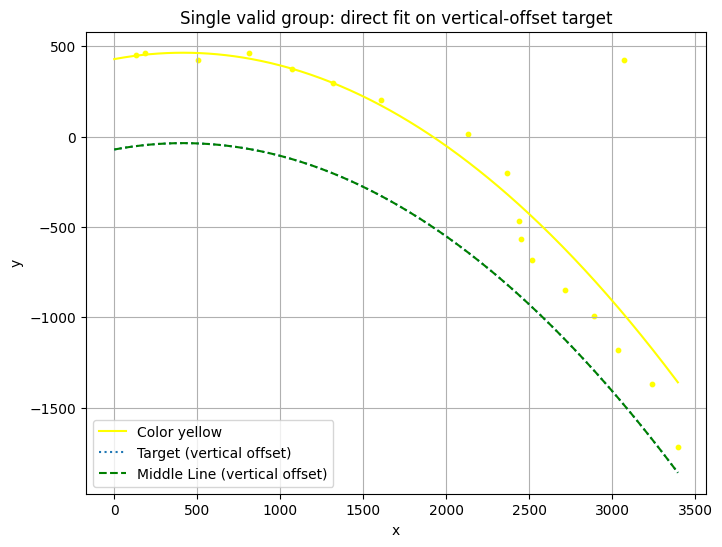

{'x_list': [np.float64(32.78973388671875), np.float64(88.2552490234375), np.float64(402.99627685546875), np.float64(711.8082275390625), np.float64(1219.0472412109375), np.float64(1509.1875), np.float64(2029.350341796875), np.float64(2267.71484375), np.float64(973.2745361328125), np.float64(2973.162353515625), np.float64(2335.90576171875), np.float64(2614.674560546875), np.float64(2350.469970703125), np.float64(3294.512939453125), np.float64(2790.392578125), np.float64(2418.314208984375), np.float64(2935.061767578125), np.float64(3136.477783203125)], 'y_list': [np.float64(450.3963928222656), np.float64(460.6102600097656), np.float64(422.9962463378906), np.float64(460.2257385253906), np.float64(297.9393005371094), np.float64(202.06427001953125), np.float64(12.3150634765625), np.float64(-201.81065368652344), np.float64(374.91290283203125), np.float64(423.91851806640625), np.float64(-464.5682067871094), np.float64(-849.4065551757812), np.float64(-564.8831787109375), np.float64(-1719.370361

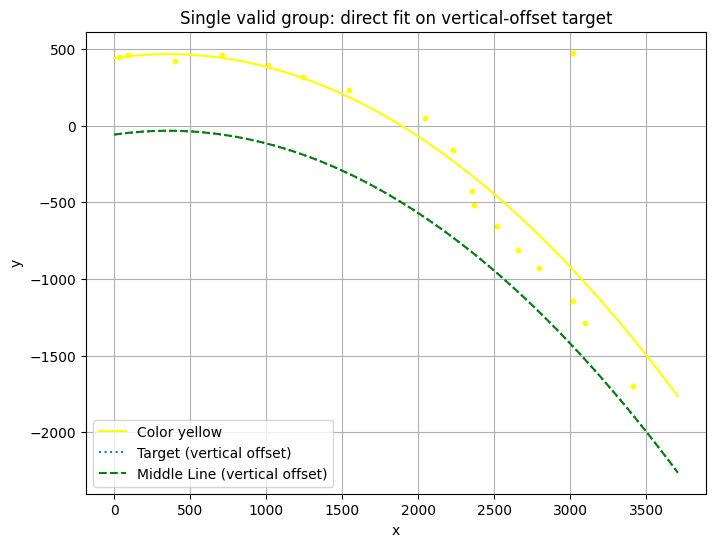

{'x_list': [np.float64(-67.21026611328125), np.float64(-11.7447509765625), np.float64(302.99627685546875), np.float64(611.8082275390625), np.float64(1445.8211669921875), np.float64(1144.244384765625), np.float64(1948.3505859375), np.float64(2128.886962890625), np.float64(909.0743408203125), np.float64(2254.633544921875), np.float64(2695.037109375), np.float64(3317.44873046875), np.float64(2919.02392578125), np.float64(2997.48779296875), np.float64(2557.22119140625), np.float64(2270.02001953125), np.float64(2917.955810546875), np.float64(2418.314208984375)], 'y_list': [np.float64(450.3963928222656), np.float64(460.6102600097656), np.float64(422.9962463378906), np.float64(460.2257385253906), np.float64(230.5566864013672), np.float64(317.4549865722656), np.float64(49.39651870727539), np.float64(-160.1510467529297), np.float64(396.8186950683594), np.float64(-426.7673034667969), np.float64(-928.5557861328125), np.float64(-1698.8131103515625), np.float64(476.1824645996094), np.float64(-1285.

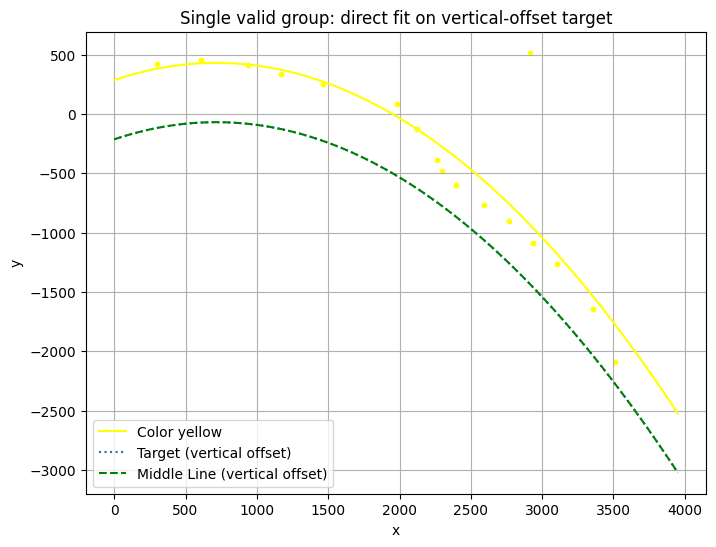

{'x_list': [np.float64(202.99627685546875), np.float64(511.8082275390625), np.float64(1882.540283203125), np.float64(2024.872314453125), np.float64(1070.9647216796875), np.float64(1365.2982177734375), np.float64(839.1421508789062), np.float64(2160.35791015625), np.float64(2817.4111328125), np.float64(2666.282958984375), np.float64(3253.096435546875), np.float64(2833.335693359375), np.float64(2194.736572265625), np.float64(2491.49462890625), np.float64(2299.527587890625), np.float64(3413.61669921875), np.float64(3001.865234375)], 'y_list': [np.float64(422.9962463378906), np.float64(460.2257385253906), np.float64(82.2323226928711), np.float64(-124.1330337524414), np.float64(336.8119812011719), np.float64(253.1060028076172), np.float64(415.2311096191406), np.float64(-385.6862487792969), np.float64(517.4699096679688), np.float64(-900.0372314453125), np.float64(-1646.140869140625), np.float64(-1085.2530517578125), np.float64(-480.5511169433594), np.float64(-765.8192138671875), np.float64(-6

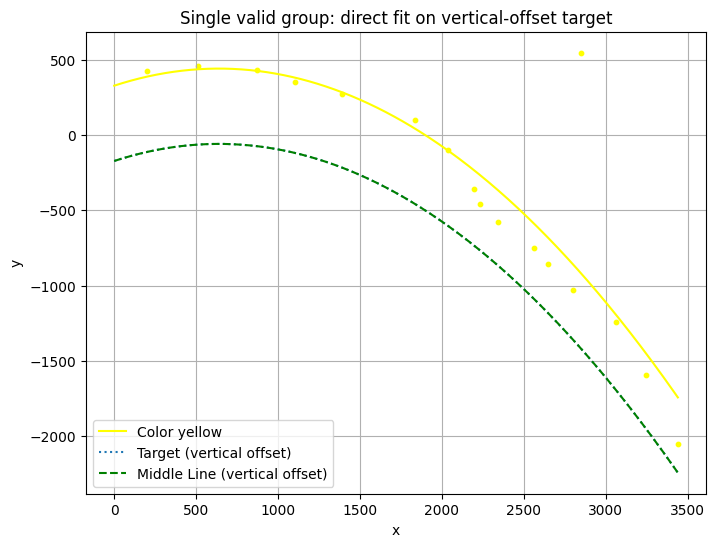

{'x_list': [np.float64(102.99627685546875), np.float64(411.8082275390625), np.float64(770.0341796875), np.float64(1293.5211181640625), np.float64(1737.9932861328125), np.float64(1002.9981689453125), np.float64(1935.59423828125), np.float64(2548.868896484375), np.float64(2749.46533203125), np.float64(2099.041015625), np.float64(3146.76904296875), np.float64(2131.677734375), np.float64(2702.965087890625), np.float64(3340.69677734375), np.float64(2963.185791015625), np.float64(2242.63037109375), np.float64(2463.23046875)], 'y_list': [np.float64(422.9962463378906), np.float64(460.2257385253906), np.float64(430.78936767578125), np.float64(268.7906799316406), np.float64(97.72401428222656), np.float64(351.9131164550781), np.float64(-101.48151397705078), np.float64(-854.6221923828125), np.float64(546.1301879882812), np.float64(-360.807861328125), np.float64(-1596.432373046875), np.float64(-457.05010986328125), np.float64(-1031.7286376953125), np.float64(-2053.739501953125), np.float64(-1240.96

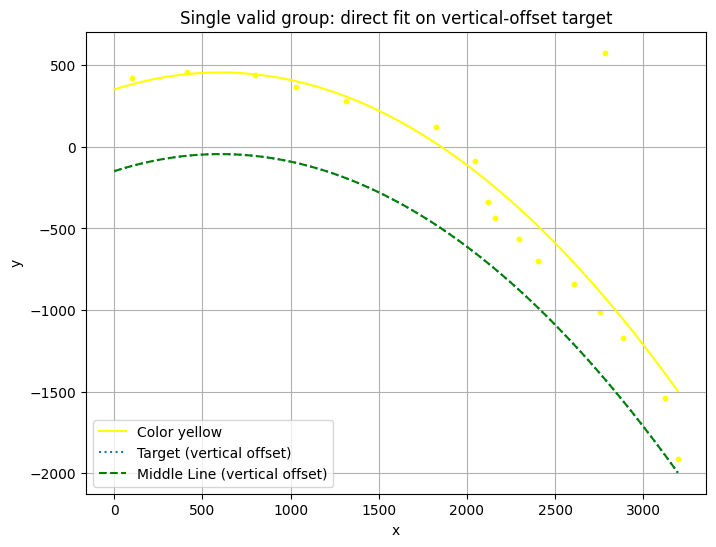

{'x_list': [np.float64(2.99627685546875), np.float64(311.8082275390625), np.float64(1947.257568359375), np.float64(696.3585815429688), np.float64(1212.6739501953125), np.float64(931.27685546875), np.float64(1725.192626953125), np.float64(2019.625732421875), np.float64(2058.645751953125), np.float64(2683.537353515625), np.float64(3023.21484375), np.float64(2195.554931640625), np.float64(2504.922119140625), np.float64(2300.381103515625), np.float64(2654.0908203125), np.float64(2785.088623046875), np.float64(3095.509765625)], 'y_list': [np.float64(422.9962463378906), np.float64(460.2257385253906), np.float64(-84.6109390258789), np.float64(439.10943603515625), np.float64(280.03143310546875), np.float64(363.3479309082031), np.float64(120.3732681274414), np.float64(-340.4198303222656), np.float64(-437.0159606933594), np.float64(576.1544799804688), np.float64(-1540.2445068359375), np.float64(-563.5553588867188), np.float64(-838.8707275390625), np.float64(-699.4641723632812), np.float64(-1012.

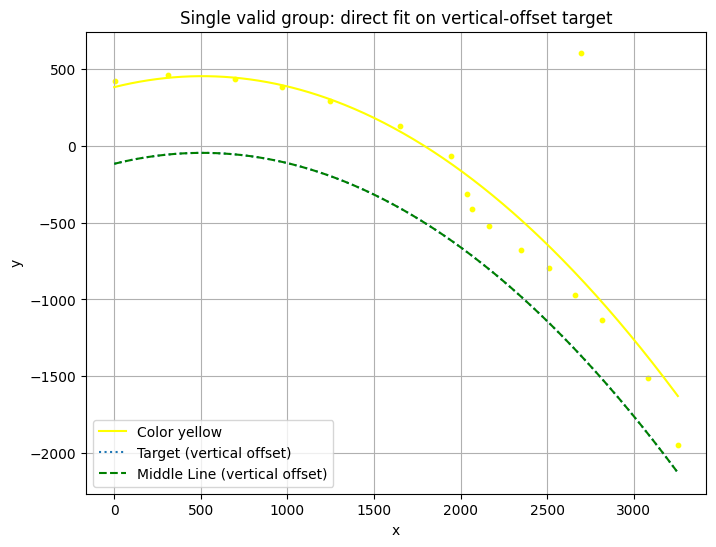

{'x_list': [np.float64(-97.00372314453125), np.float64(211.8082275390625), np.float64(596.3585815429688), np.float64(867.87451171875), np.float64(1549.516845703125), np.float64(1143.796142578125), np.float64(1847.025146484375), np.float64(1937.7874755859375), np.float64(2980.776123046875), np.float64(2593.27197265625), np.float64(1967.594970703125), np.float64(2561.940185546875), np.float64(2716.63134765625), np.float64(2409.2900390625), np.float64(3155.056640625), np.float64(2063.279052734375), np.float64(2251.95361328125)], 'y_list': [np.float64(422.9962463378906), np.float64(460.2257385253906), np.float64(439.10943603515625), np.float64(382.3149108886719), np.float64(133.07456970214844), np.float64(297.00042724609375), np.float64(-61.8662223815918), np.float64(-312.25079345703125), np.float64(-1512.7503662109375), np.float64(608.5968627929688), np.float64(-407.02734375), np.float64(-970.0014038085938), np.float64(-1133.2611083984375), np.float64(-797.6055908203125), np.float64(-1947

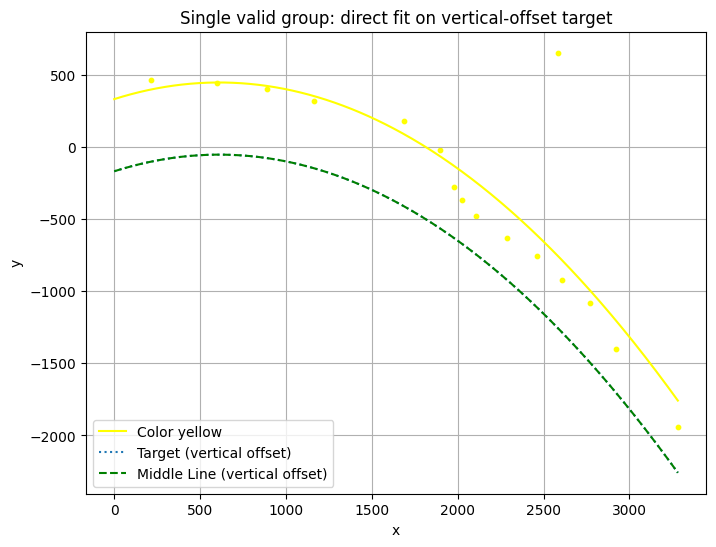

{'x_list': [np.float64(111.8082275390625), np.float64(496.35858154296875), np.float64(1585.64208984375), np.float64(791.0233764648438), np.float64(1063.7547607421875), np.float64(1799.349609375), np.float64(1880.2459716796875), np.float64(2820.50439453125), np.float64(3181.98486328125), np.float64(2482.778564453125), np.float64(1923.3953857421875), np.float64(2007.759765625), np.float64(2360.088623046875), np.float64(2670.203369140625), np.float64(2506.7705078125), np.float64(2185.887451171875)], 'y_list': [np.float64(460.2257385253906), np.float64(439.10943603515625), np.float64(177.3369140625), np.float64(401.8072814941406), np.float64(320.52960205078125), np.float64(-23.809123992919922), np.float64(-275.0854797363281), np.float64(-1403.7747802734375), np.float64(-1944.9271240234375), np.float64(652.003662109375), np.float64(-371.65460205078125), np.float64(-480.2008361816406), np.float64(-753.95556640625), np.float64(-1085.8006591796875), np.float64(-922.7577514648438), np.float64(-

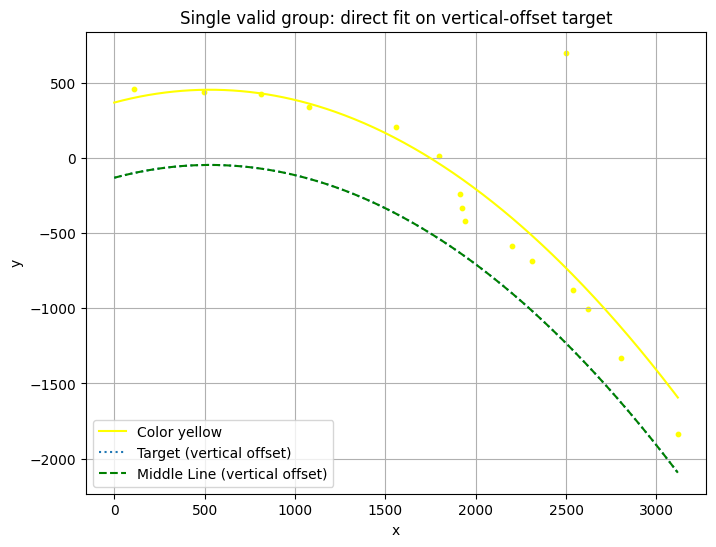

{'x_list': [np.float64(11.8082275390625), np.float64(396.35858154296875), np.float64(711.2908935546875), np.float64(1461.0654296875), np.float64(978.50244140625), np.float64(1697.745361328125), np.float64(2704.947265625), np.float64(1814.259033203125), np.float64(2524.063720703125), np.float64(3018.810546875), np.float64(1825.8270263671875), np.float64(2439.14111328125), np.float64(2209.421875), np.float64(2402.130859375), np.float64(2102.184326171875), np.float64(1840.261474609375)], 'y_list': [np.float64(460.2257385253906), np.float64(439.10943603515625), np.float64(421.88092041015625), np.float64(202.988037109375), np.float64(338.5947265625), np.float64(10.427352905273438), np.float64(-1328.0198974609375), np.float64(-242.6875762939453), np.float64(-1006.9274291992188), np.float64(-1837.1239013671875), np.float64(-330.3746643066406), np.float64(-875.4061889648438), np.float64(-684.6494140625), np.float64(698.874755859375), np.float64(-585.263916015625), np.float64(-420.5969848632812

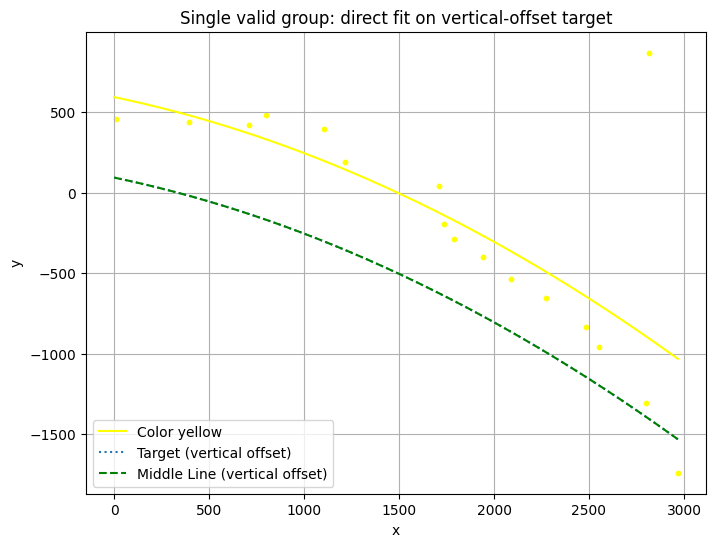

{'x_list': [np.float64(-88.1917724609375), np.float64(296.35858154296875), np.float64(611.2908935546875), np.float64(700.490234375), np.float64(1004.1348876953125), np.float64(1117.0269775390625), np.float64(1609.4775390625), np.float64(1634.61767578125), np.float64(2867.845703125), np.float64(2700.983154296875), np.float64(1688.5787353515625), np.float64(2718.425048828125), np.float64(2383.562744140625), np.float64(2173.87548828125), np.float64(2452.935546875), np.float64(1842.9630126953125), np.float64(1987.13623046875)], 'y_list': [np.float64(460.2257385253906), np.float64(439.10943603515625), np.float64(421.88092041015625), np.float64(480.3668518066406), np.float64(398.48370361328125), np.float64(190.2336883544922), np.float64(39.82013702392578), np.float64(-197.15625), np.float64(-1739.4666748046875), np.float64(-1306.856201171875), np.float64(-287.0847473144531), np.float64(869.4342651367188), np.float64(-836.8552856445312), np.float64(-655.8331909179688), np.float64(-957.1992187

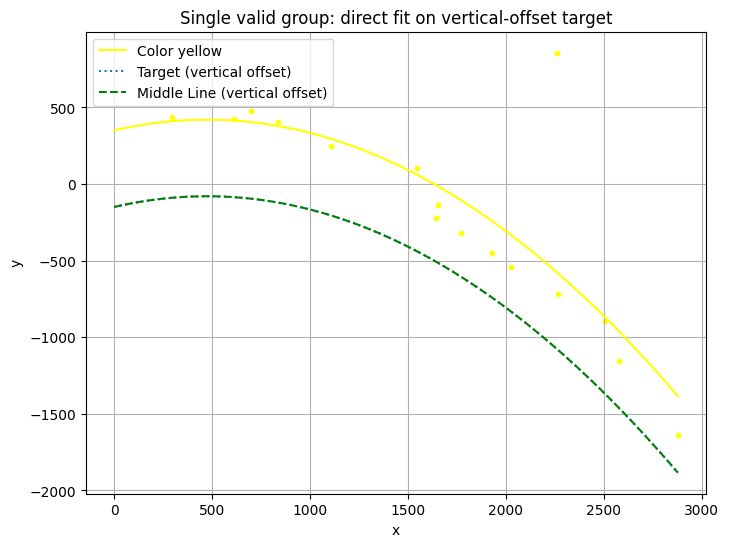

{'x_list': [np.float64(196.35858154296875), np.float64(511.2908935546875), np.float64(600.490234375), np.float64(735.7889404296875), np.float64(1446.1981201171875), np.float64(1005.8819580078125), np.float64(2480.034423828125), np.float64(1555.52294921875), np.float64(2161.1650390625), np.float64(1668.7783203125), np.float64(2408.398193359375), np.float64(2777.953369140625), np.float64(2164.3935546875), np.float64(1927.02099609375), np.float64(1543.1298828125), np.float64(1826.5184326171875)], 'y_list': [np.float64(439.10943603515625), np.float64(421.88092041015625), np.float64(480.3668518066406), np.float64(407.5435485839844), np.float64(107.33001708984375), np.float64(249.6383514404297), np.float64(-1157.4896240234375), np.float64(-136.2811737060547), np.float64(857.5593872070312), np.float64(-321.4231872558594), np.float64(-892.8421020507812), np.float64(-1640.7886962890625), np.float64(-717.5057373046875), np.float64(-538.1248779296875), np.float64(-219.04393005371094), np.float64(

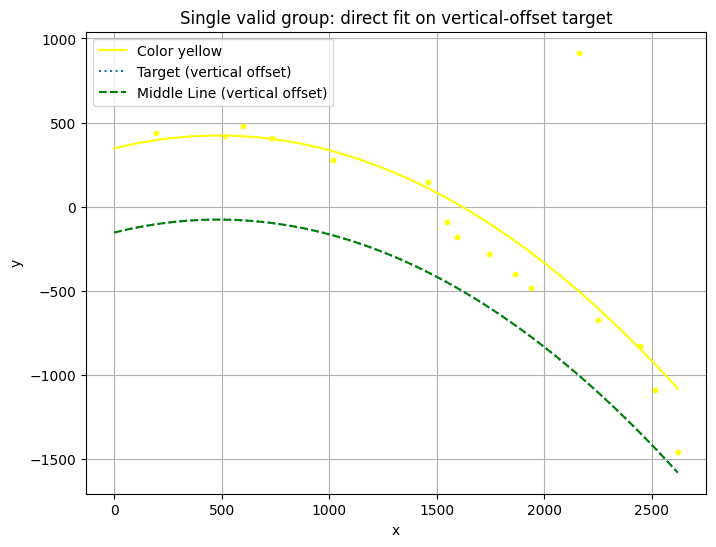

{'x_list': [np.float64(96.35858154296875), np.float64(411.2908935546875), np.float64(500.490234375), np.float64(635.7889404296875), np.float64(1358.33447265625), np.float64(920.0203857421875), np.float64(2061.734619140625), np.float64(2414.6416015625), np.float64(1641.981689453125), np.float64(1448.2598876953125), np.float64(2522.20556640625), np.float64(2152.586669921875), np.float64(2346.34765625), np.float64(1492.9627685546875), np.float64(1838.873291015625), np.float64(1766.566162109375)], 'y_list': [np.float64(439.10943603515625), np.float64(421.88092041015625), np.float64(480.3668518066406), np.float64(407.5435485839844), np.float64(145.8577117919922), np.float64(276.3285827636719), np.float64(915.259765625), np.float64(-1090.457763671875), np.float64(-283.36212158203125), np.float64(-93.13347625732422), np.float64(-1458.3087158203125), np.float64(-673.5193481445312), np.float64(-826.9314575195312), np.float64(-178.7610626220703), np.float64(-483.5939025878906), np.float64(-402.7

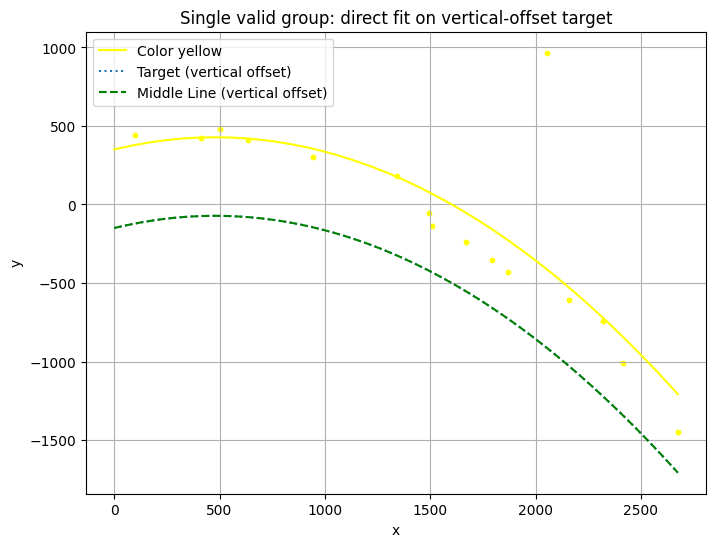

{'x_list': [np.float64(-3.64141845703125), np.float64(311.2908935546875), np.float64(400.490234375), np.float64(535.7889404296875), np.float64(1241.5267333984375), np.float64(844.1367797851562), np.float64(2575.150634765625), np.float64(1956.10302734375), np.float64(2314.494140625), np.float64(1394.9119873046875), np.float64(2217.635986328125), np.float64(1571.584228515625), np.float64(2060.190185546875), np.float64(1768.5780029296875), np.float64(1409.60009765625), np.float64(1693.1202392578125)], 'y_list': [np.float64(439.10943603515625), np.float64(421.88092041015625), np.float64(480.3668518066406), np.float64(407.5435485839844), np.float64(178.5684051513672), np.float64(303.8044128417969), np.float64(-1446.277587890625), np.float64(966.1388549804688), np.float64(-1009.5983276367188), np.float64(-53.87997055053711), np.float64(-745.1373901367188), np.float64(-237.2841339111328), np.float64(-610.1731567382812), np.float64(-431.4284362792969), np.float64(-137.72662353515625), np.float

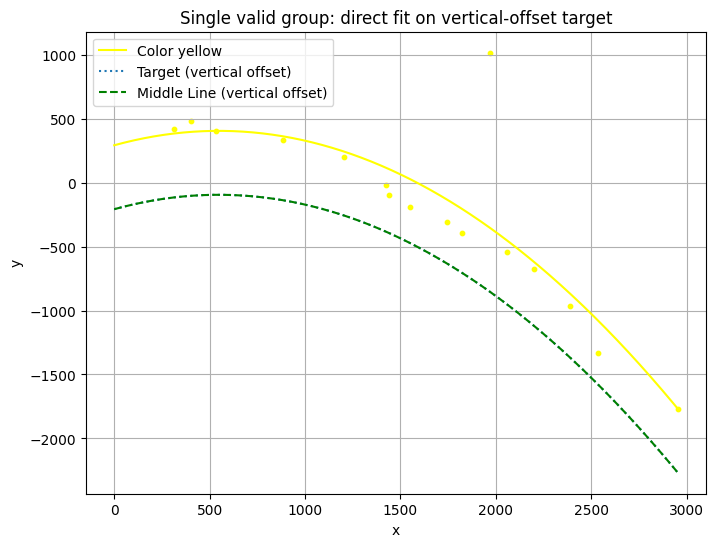

{'x_list': [np.float64(211.2908935546875), np.float64(300.490234375), np.float64(435.7889404296875), np.float64(782.9540405273438), np.float64(1106.718505859375), np.float64(1867.432861328125), np.float64(2288.101318359375), np.float64(2437.33935546875), np.float64(1323.6082763671875), np.float64(1337.753662109375), np.float64(1957.5771484375), np.float64(2100.61279296875), np.float64(1723.4244384765625), np.float64(1451.63623046875), np.float64(1645.6158447265625), np.float64(2854.204833984375)], 'y_list': [np.float64(421.88092041015625), np.float64(480.3668518066406), np.float64(407.5435485839844), np.float64(333.3277282714844), np.float64(202.19810485839844), np.float64(1016.6117553710938), np.float64(-961.43505859375), np.float64(-1334.75390625), np.float64(-18.10050392150879), np.float64(-98.03756713867188), np.float64(-545.0518798828125), np.float64(-671.2704467773438), np.float64(-390.3995666503906), np.float64(-190.77342224121094), np.float64(-311.2853698730469), np.float64(-17

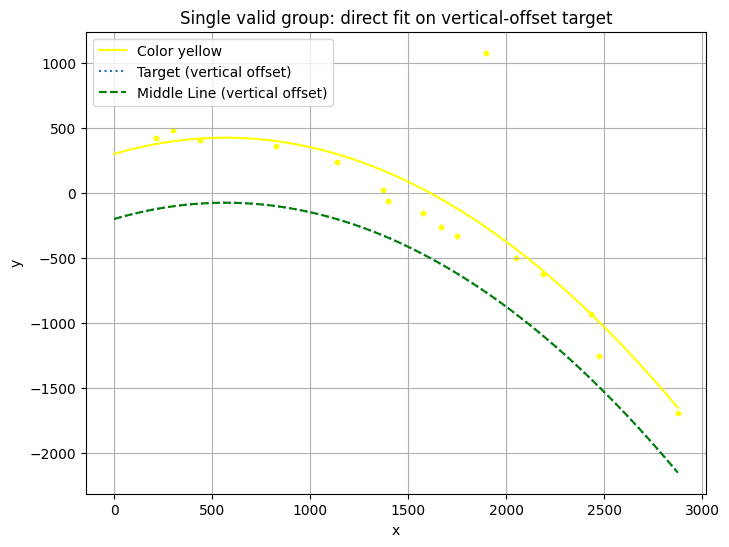

{'x_list': [np.float64(111.2908935546875), np.float64(200.490234375), np.float64(335.7889404296875), np.float64(723.9127197265625), np.float64(1035.708740234375), np.float64(1476.98291015625), np.float64(1271.3192138671875), np.float64(1795.4896240234375), np.float64(2331.874267578125), np.float64(2774.8955078125), np.float64(2088.61376953125), np.float64(2371.328369140625), np.float64(1296.587890625), np.float64(1946.907470703125), np.float64(1649.397705078125), np.float64(1565.3343505859375)], 'y_list': [np.float64(421.88092041015625), np.float64(480.3668518066406), np.float64(407.5435485839844), np.float64(362.845947265625), np.float64(234.13247680664062), np.float64(-156.1756134033203), np.float64(22.86751937866211), np.float64(1076.427734375), np.float64(-931.5608520507812), np.float64(-1692.488525390625), np.float64(-624.4674072265625), np.float64(-1252.617919921875), np.float64(-61.39888381958008), np.float64(-499.6976013183594), np.float64(-334.84210205078125), np.float64(-263.

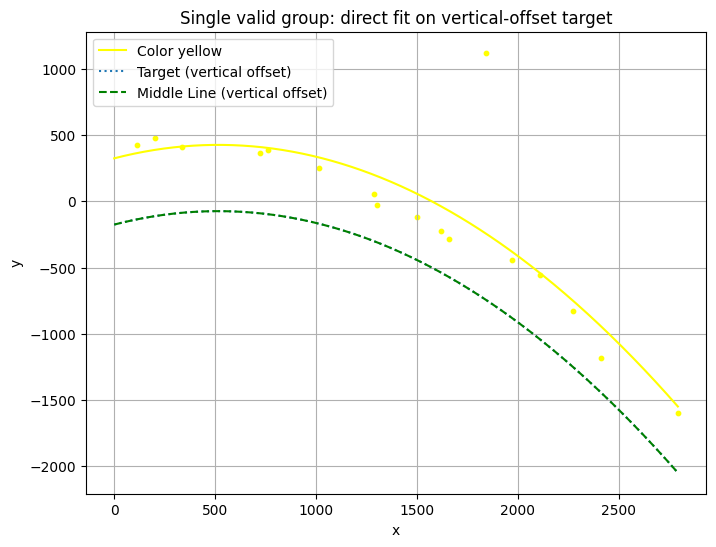

{'x_list': [np.float64(11.2908935546875), np.float64(100.490234375), np.float64(235.7889404296875), np.float64(623.9127197265625), np.float64(660.9754638671875), np.float64(913.3886108398438), np.float64(2692.064208984375), np.float64(2174.6865234375), np.float64(1201.9447021484375), np.float64(2310.2060546875), np.float64(1189.2928466796875), np.float64(2010.644287109375), np.float64(1401.13916015625), np.float64(1870.2642822265625), np.float64(1558.3477783203125), np.float64(1742.204833984375), np.float64(1517.4024658203125)], 'y_list': [np.float64(421.88092041015625), np.float64(480.3668518066406), np.float64(407.5435485839844), np.float64(362.845947265625), np.float64(390.1063537597656), np.float64(251.7979736328125), np.float64(-1595.211181640625), np.float64(-828.9903564453125), np.float64(-24.25594139099121), np.float64(-1179.0093994140625), np.float64(57.14189529418945), np.float64(-558.9091186523438), np.float64(-115.3938980102539), np.float64(-442.16943359375), np.float64(-28

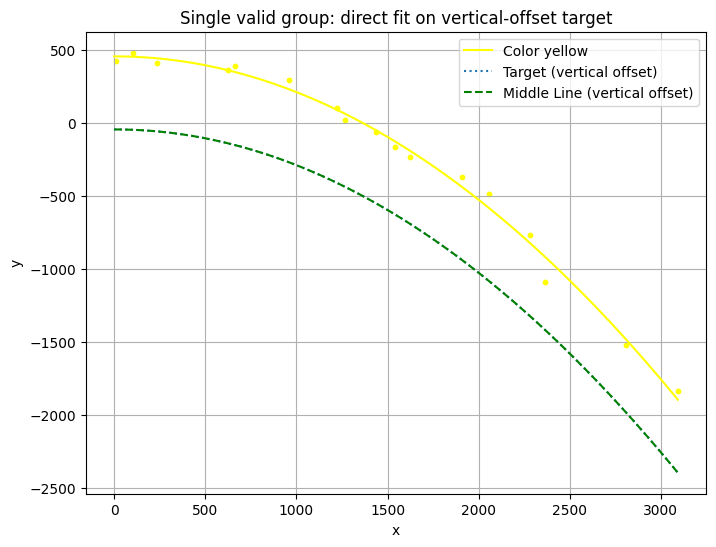

{'x_list': [np.float64(-88.7091064453125), np.float64(0.490234375), np.float64(135.7889404296875), np.float64(523.9127197265625), np.float64(560.9754638671875), np.float64(860.9388427734375), np.float64(2263.88916015625), np.float64(2183.44384765625), np.float64(2706.665771484375), np.float64(1956.840087890625), np.float64(1120.850830078125), np.float64(1168.4688720703125), np.float64(1336.1796875), np.float64(1807.58251953125), np.float64(1523.270263671875), np.float64(2993.1103515625), np.float64(1440.2305908203125)], 'y_list': [np.float64(421.88092041015625), np.float64(480.3668518066406), np.float64(407.5435485839844), np.float64(362.845947265625), np.float64(390.1063537597656), np.float64(293.25872802734375), np.float64(-1091.625732421875), np.float64(-767.5452270507812), np.float64(-1521.6556396484375), np.float64(-487.9886779785156), np.float64(100.05858612060547), np.float64(21.19136619567871), np.float64(-64.42469024658203), np.float64(-373.6200866699219), np.float64(-231.8256

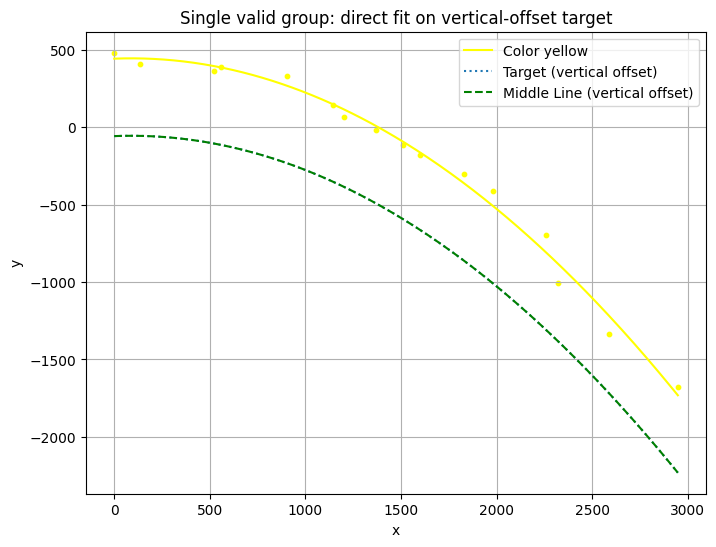

{'x_list': [np.float64(-99.509765625), np.float64(35.7889404296875), np.float64(423.9127197265625), np.float64(460.9754638671875), np.float64(802.67822265625), np.float64(2219.28759765625), np.float64(1043.0845947265625), np.float64(1100.923583984375), np.float64(1271.4761962890625), np.float64(2160.35791015625), np.float64(1880.9566650390625), np.float64(2488.736083984375), np.float64(1728.1783447265625), np.float64(2847.3603515625), np.float64(1499.8721923828125), np.float64(1412.05712890625)], 'y_list': [np.float64(480.3668518066406), np.float64(407.5435485839844), np.float64(362.845947265625), np.float64(390.1063537597656), np.float64(330.5805358886719), np.float64(-1007.4786376953125), np.float64(140.5872039794922), np.float64(62.78028106689453), np.float64(-16.096309661865234), np.float64(-698.1137084960938), np.float64(-415.47393798828125), np.float64(-1332.820068359375), np.float64(-305.74078369140625), np.float64(-1676.3851318359375), np.float64(-180.8874969482422), np.float64

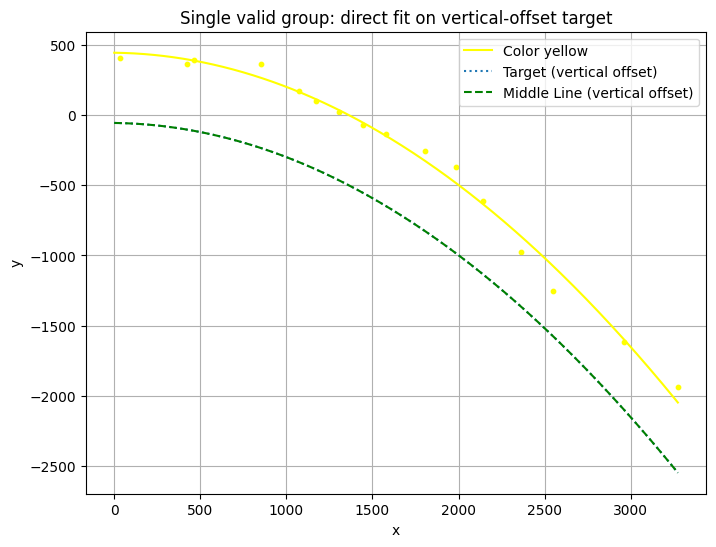

{'x_list': [np.float64(-64.2110595703125), np.float64(323.9127197265625), np.float64(360.9754638671875), np.float64(750.6214599609375), np.float64(2040.882080078125), np.float64(976.073486328125), np.float64(1204.4854736328125), np.float64(2446.59716796875), np.float64(2260.5234375), np.float64(1069.8516845703125), np.float64(1886.0263671875), np.float64(1475.9305419921875), np.float64(1704.9066162109375), np.float64(2862.59912109375), np.float64(1345.20556640625), np.float64(3173.469970703125)], 'y_list': [np.float64(407.5435485839844), np.float64(362.845947265625), np.float64(390.1063537597656), np.float64(361.2718811035156), np.float64(-615.1541748046875), np.float64(169.4523162841797), np.float64(21.76102638244629), np.float64(-1254.5111083984375), np.float64(-974.8262939453125), np.float64(97.32196044921875), np.float64(-371.4223327636719), np.float64(-138.88656616210938), np.float64(-258.9459228515625), np.float64(-1616.2193603515625), np.float64(-73.25884246826172), np.float64(-

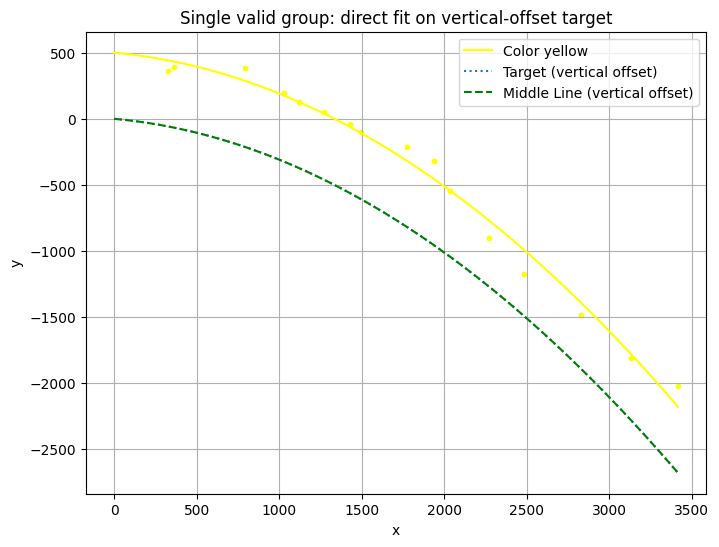

{'x_list': [np.float64(223.9127197265625), np.float64(260.9754638671875), np.float64(695.0098266601562), np.float64(1174.2060546875), np.float64(1935.2945556640625), np.float64(926.23095703125), np.float64(2173.87548828125), np.float64(1020.46826171875), np.float64(2384.44580078125), np.float64(1837.3885498046875), np.float64(1676.3701171875), np.float64(2730.45068359375), np.float64(1396.8804931640625), np.float64(1326.2161865234375), np.float64(3034.22607421875), np.float64(3316.243408203125)], 'y_list': [np.float64(362.845947265625), np.float64(390.1063537597656), np.float64(382.7491149902344), np.float64(53.8838005065918), np.float64(-544.20849609375), np.float64(198.06727600097656), np.float64(-898.2532348632812), np.float64(126.83365631103516), np.float64(-1176.3121337890625), np.float64(-318.07501220703125), np.float64(-215.82371520996094), np.float64(-1487.4012451171875), np.float64(-100.17253112792969), np.float64(-37.593353271484375), np.float64(-1807.729736328125), np.float6

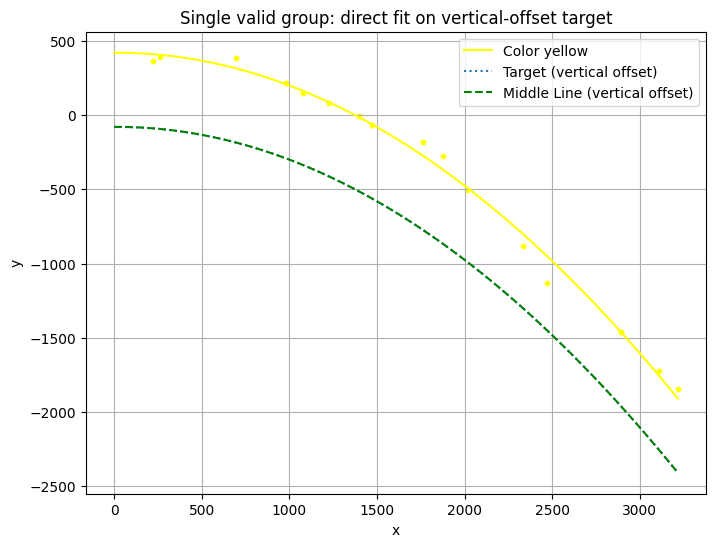

{'x_list': [np.float64(123.9127197265625), np.float64(160.9754638671875), np.float64(595.0098266601562), np.float64(1128.4256591796875), np.float64(881.4298095703125), np.float64(975.671630859375), np.float64(1775.3013916015625), np.float64(1915.20361328125), np.float64(2234.294921875), np.float64(2368.692138671875), np.float64(1297.012939453125), np.float64(1659.8592529296875), np.float64(2791.417724609375), np.float64(1370.655029296875), np.float64(3116.999267578125), np.float64(3010.6201171875)], 'y_list': [np.float64(362.845947265625), np.float64(390.1063537597656), np.float64(382.7491149902344), np.float64(82.39289855957031), np.float64(219.8523406982422), np.float64(151.22010803222656), np.float64(-274.1656494140625), np.float64(-501.24468994140625), np.float64(-881.1600952148438), np.float64(-1128.2943115234375), np.float64(-8.210042953491211), np.float64(-181.9697265625), np.float64(-1464.124267578125), np.float64(-67.20893859863281), np.float64(-1847.102783203125), np.float64(

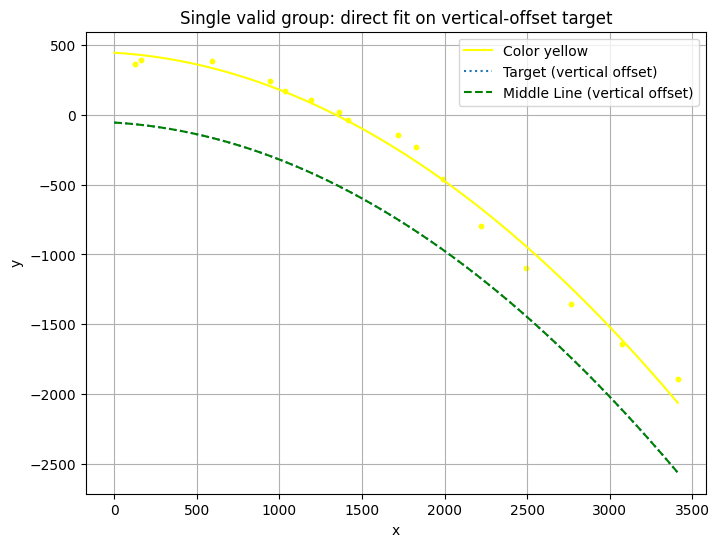

{'x_list': [np.float64(23.9127197265625), np.float64(60.9754638671875), np.float64(495.00982666015625), np.float64(935.9302978515625), np.float64(845.2070922851562), np.float64(2119.380859375), np.float64(1890.3074951171875), np.float64(1092.770751953125), np.float64(1725.54541015625), np.float64(2393.25634765625), np.float64(2664.32275390625), np.float64(1317.95068359375), np.float64(1616.314453125), np.float64(1260.295166015625), np.float64(3312.627685546875), np.float64(2972.915771484375)], 'y_list': [np.float64(362.845947265625), np.float64(390.1063537597656), np.float64(382.7491149902344), np.float64(171.8397674560547), np.float64(239.99595642089844), np.float64(-799.9865112304688), np.float64(-460.94464111328125), np.float64(107.25892639160156), np.float64(-233.6984100341797), np.float64(-1094.5089111328125), np.float64(-1352.6722412109375), np.float64(-35.88621520996094), np.float64(-142.68882751464844), np.float64(21.34151268005371), np.float64(-1895.0775146484375), np.float64(

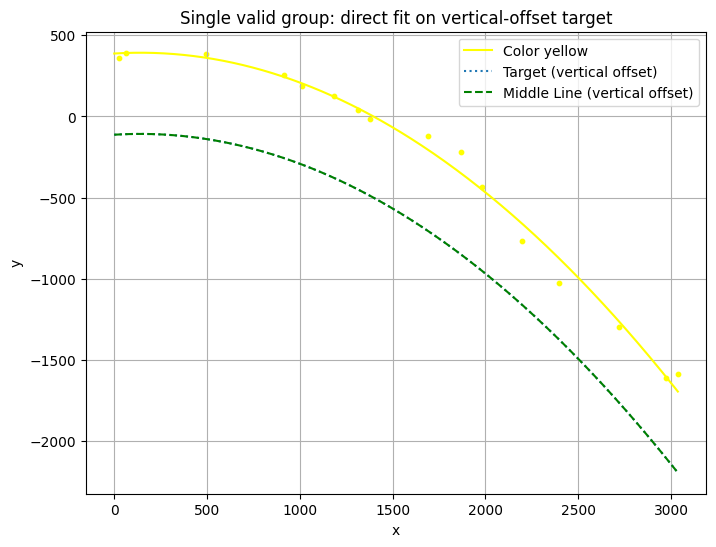

{'x_list': [np.float64(-76.0872802734375), np.float64(-39.0245361328125), np.float64(395.00982666015625), np.float64(814.5594482421875), np.float64(1766.205322265625), np.float64(1881.6673583984375), np.float64(913.00830078125), np.float64(2099.041015625), np.float64(1081.787353515625), np.float64(2619.495849609375), np.float64(2296.967041015625), np.float64(1590.883544921875), np.float64(1280.389404296875), np.float64(1214.124267578125), np.float64(2870.99365234375), np.float64(2936.1142578125)], 'y_list': [np.float64(362.845947265625), np.float64(390.1063537597656), np.float64(382.7491149902344), np.float64(253.34756469726562), np.float64(-217.4267120361328), np.float64(-434.4453125), np.float64(187.8331756591797), np.float64(-765.6678466796875), np.float64(126.3580093383789), np.float64(-1297.2755126953125), np.float64(-1025.273193359375), np.float64(-119.4547119140625), np.float64(-16.14177894592285), np.float64(38.71402359008789), np.float64(-1610.6171875), np.float64(-1585.373901

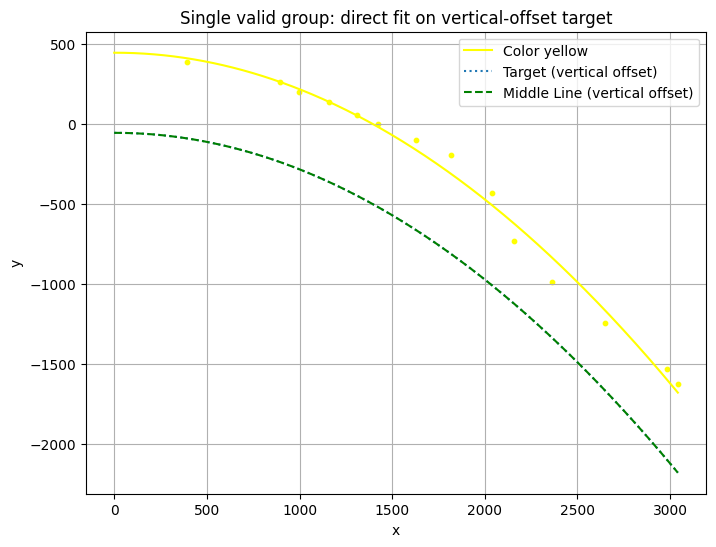

{'x_list': [np.float64(295.00982666015625), np.float64(797.1492919921875), np.float64(1060.0819091796875), np.float64(1937.056396484375), np.float64(896.2373046875), np.float64(2261.36474609375), np.float64(1716.21044921875), np.float64(1527.5230712890625), np.float64(2059.41796875), np.float64(1209.126220703125), np.float64(2546.9912109375), np.float64(2941.50927734375), np.float64(1323.0982666015625), np.float64(2880.437255859375)], 'y_list': [np.float64(382.7491149902344), np.float64(261.7185974121094), np.float64(136.8737030029297), np.float64(-431.29638671875), np.float64(198.07589721679688), np.float64(-990.54931640625), np.float64(-196.0751190185547), np.float64(-100.912841796875), np.float64(-733.85693359375), np.float64(51.479183197021484), np.float64(-1243.0867919921875), np.float64(-1623.6102294921875), np.float64(-2.77657413482666), np.float64(-1529.3861083984375)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


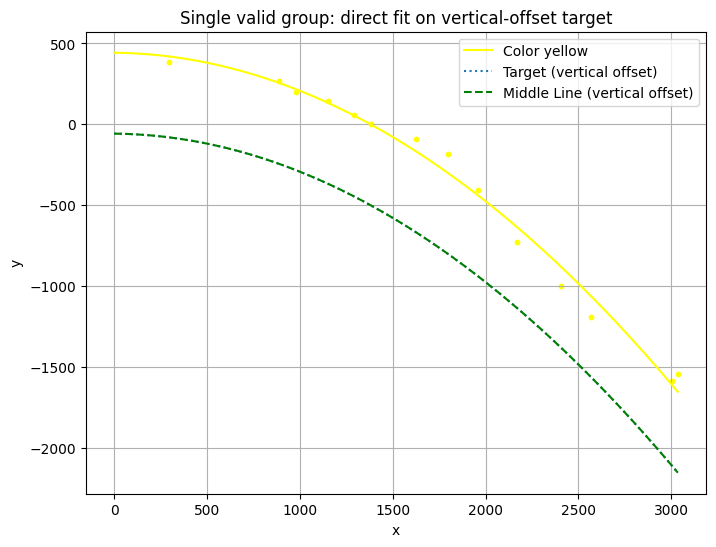

{'x_list': [np.float64(195.00982666015625), np.float64(1048.5538330078125), np.float64(787.9951782226562), np.float64(1856.8572998046875), np.float64(1696.3973388671875), np.float64(879.402099609375), np.float64(2068.806884765625), np.float64(2465.050537109375), np.float64(1526.932373046875), np.float64(2306.775634765625), np.float64(1191.195556640625), np.float64(1282.2784423828125), np.float64(2905.30078125), np.float64(2935.046142578125)], 'y_list': [np.float64(382.7491149902344), np.float64(143.5382537841797), np.float64(267.3462829589844), np.float64(-404.94256591796875), np.float64(-181.81512451171875), np.float64(202.67271423339844), np.float64(-728.7662963867188), np.float64(-1190.4560546875), np.float64(-91.45226287841797), np.float64(-998.1516723632812), np.float64(60.95135498046875), np.float64(4.046876430511475), np.float64(-1587.27490234375), np.float64(-1539.7515869140625)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


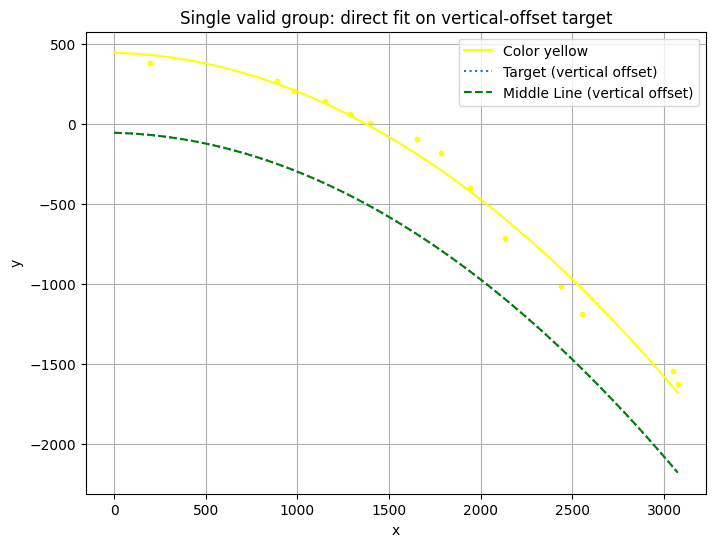

{'x_list': [np.float64(95.00982666015625), np.float64(1047.700439453125), np.float64(787.3207397460938), np.float64(1840.17578125), np.float64(1682.1390380859375), np.float64(2030.20849609375), np.float64(883.0958862304688), np.float64(2340.256591796875), np.float64(1293.1072998046875), np.float64(1553.72119140625), np.float64(2450.218994140625), np.float64(1187.287109375), np.float64(2975.337646484375), np.float64(2950.10595703125)], 'y_list': [np.float64(382.7491149902344), np.float64(144.6774444580078), np.float64(267.3462829589844), np.float64(-399.9188537597656), np.float64(-180.50238037109375), np.float64(-714.273681640625), np.float64(203.513671875), np.float64(-1012.7587890625), np.float64(5.442085266113281), np.float64(-92.99186706542969), np.float64(-1184.4130859375), np.float64(60.78925323486328), np.float64(-1623.0853271484375), np.float64(-1546.15869140625)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


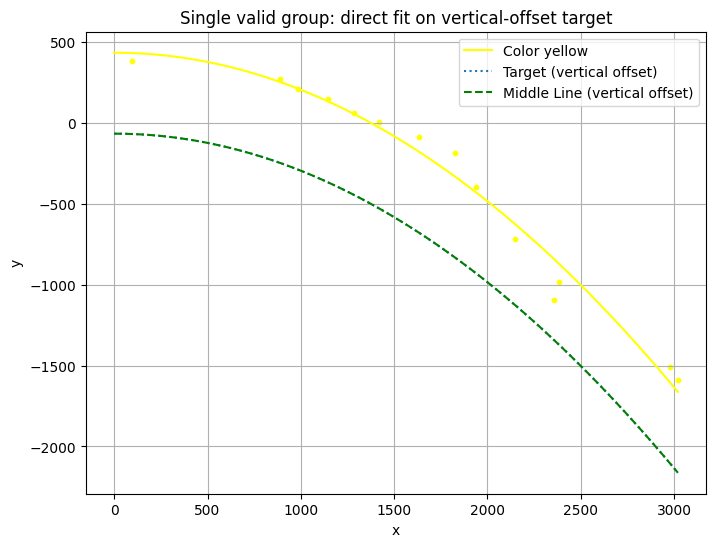

{'x_list': [np.float64(-4.99017333984375), np.float64(1047.700439453125), np.float64(1840.17578125), np.float64(786.9835815429688), np.float64(2048.572509765625), np.float64(1728.3426513671875), np.float64(886.8204956054688), np.float64(2282.1552734375), np.float64(1317.4056396484375), np.float64(1531.7447509765625), np.float64(2258.6533203125), np.float64(1186.8126220703125), np.float64(2920.092041015625), np.float64(2879.387939453125)], 'y_list': [np.float64(382.7491149902344), np.float64(144.6774444580078), np.float64(-399.9188537597656), np.float64(268.2464294433594), np.float64(-718.3787231445312), np.float64(-185.1820831298828), np.float64(205.3536834716797), np.float64(-986.3779296875), np.float64(5.537005424499512), np.float64(-90.17408752441406), np.float64(-1093.2076416015625), np.float64(60.78925323486328), np.float64(-1591.0767822265625), np.float64(-1509.778564453125)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


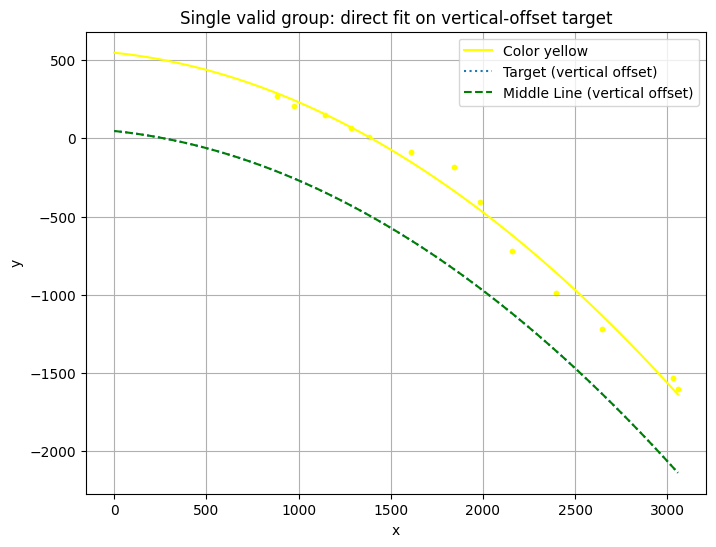

{'x_list': [np.float64(783.3068237304688), np.float64(1741.9869384765625), np.float64(1886.0263671875), np.float64(1041.8104248046875), np.float64(2057.87353515625), np.float64(876.279296875), np.float64(1509.760009765625), np.float64(1281.267822265625), np.float64(2294.406494140625), np.float64(2545.113525390625), np.float64(1186.3382568359375), np.float64(2956.69921875), np.float64(2932.90966796875)], 'y_list': [np.float64(270.8231506347656), np.float64(-181.23362731933594), np.float64(-403.802734375), np.float64(146.25604248046875), np.float64(-717.3657836914062), np.float64(206.18211364746094), np.float64(-85.86898040771484), np.float64(9.44271183013916), np.float64(-986.5406494140625), np.float64(-1218.0245361328125), np.float64(65.85502624511719), np.float64(-1604.5906982421875), np.float64(-1534.0489501953125)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


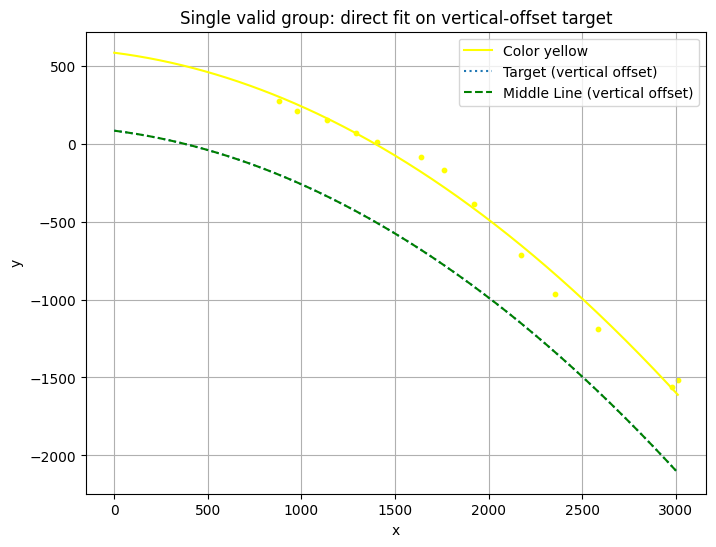

{'x_list': [np.float64(780.3052368164062), np.float64(876.8222045898438), np.float64(2074.3828125), np.float64(1034.708251953125), np.float64(1303.09521484375), np.float64(1822.3699951171875), np.float64(2257.15771484375), np.float64(1540.2730712890625), np.float64(1660.496337890625), np.float64(2486.897216796875), np.float64(1189.2928466796875), np.float64(2881.184814453125), np.float64(2911.671630859375)], 'y_list': [np.float64(274.7895202636719), np.float64(210.5435028076172), np.float64(-717.3927612304688), np.float64(150.0764617919922), np.float64(12.350553512573242), np.float64(-385.7447204589844), np.float64(-965.8417358398438), np.float64(-82.81434631347656), np.float64(-170.06517028808594), np.float64(-1188.001708984375), np.float64(69.84010314941406), np.float64(-1558.1591796875), np.float64(-1516.4144287109375)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


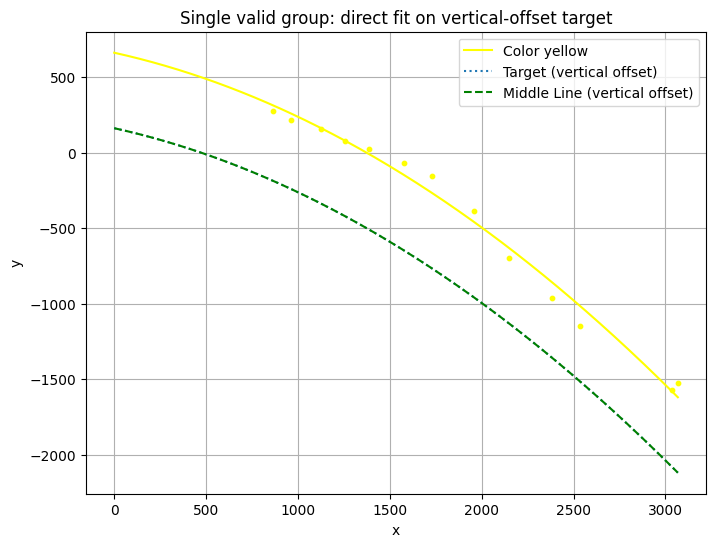

{'x_list': [np.float64(766.6030883789062), np.float64(1860.3614501953125), np.float64(1023.635009765625), np.float64(2280.456298828125), np.float64(1157.681396484375), np.float64(2046.265869140625), np.float64(1629.6104736328125), np.float64(1476.98291015625), np.float64(860.2137451171875), np.float64(2435.537353515625), np.float64(1287.10546875), np.float64(2937.2109375), np.float64(2967.51025390625)], 'y_list': [np.float64(278.6549072265625), np.float64(-383.9574279785156), np.float64(157.60968017578125), np.float64(-963.70263671875), np.float64(75.64356994628906), np.float64(-697.8536376953125), np.float64(-157.05667114257812), np.float64(-70.43213653564453), np.float64(216.7985076904297), np.float64(-1149.57177734375), np.float64(21.706323623657227), np.float64(-1569.1072998046875), np.float64(-1526.6697998046875)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


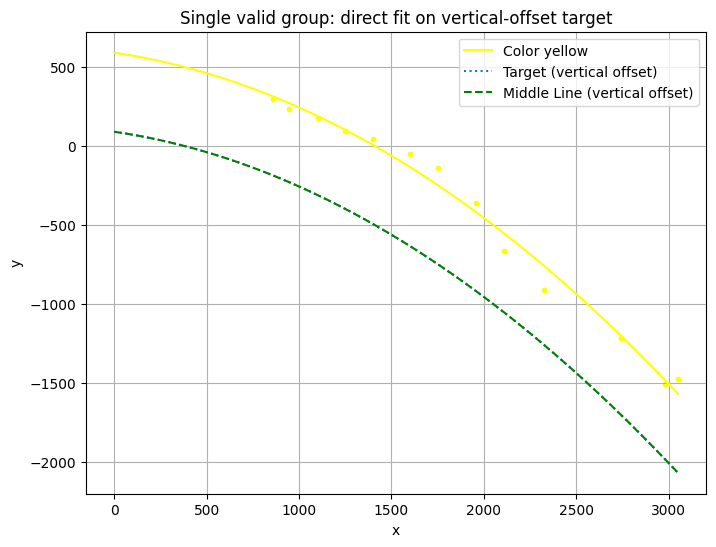

{'x_list': [np.float64(757.3433227539062), np.float64(1002.5118408203125), np.float64(1860.3614501953125), np.float64(846.0288696289062), np.float64(2010.644287109375), np.float64(1150.7027587890625), np.float64(2225.9267578125), np.float64(2644.34326171875), np.float64(1654.231201171875), np.float64(1502.1676025390625), np.float64(1298.5506591796875), np.float64(2883.2958984375), np.float64(2950.10595703125)], 'y_list': [np.float64(293.57305908203125), np.float64(171.162353515625), np.float64(-363.2538146972656), np.float64(228.0713653564453), np.float64(-665.8483276367188), np.float64(90.05522918701172), np.float64(-916.9281616210938), np.float64(-1217.7781982421875), np.float64(-138.9571533203125), np.float64(-54.46531295776367), np.float64(39.6818733215332), np.float64(-1510.2591552734375), np.float64(-1480.181640625)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


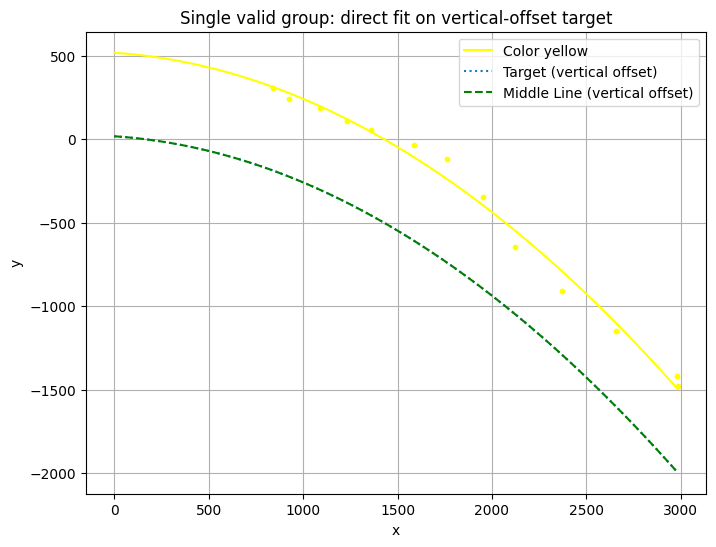

{'x_list': [np.float64(740.2886962890625), np.float64(1852.6434326171875), np.float64(1660.496337890625), np.float64(2019.625732421875), np.float64(827.8638916015625), np.float64(991.221435546875), np.float64(1486.612548828125), np.float64(1259.485107421875), np.float64(2270.02001953125), np.float64(1131.104248046875), np.float64(2558.1650390625), np.float64(2884.351318359375), np.float64(2878.338623046875)], 'y_list': [np.float64(304.5851745605469), np.float64(-343.0763244628906), np.float64(-120.74626922607422), np.float64(-646.3923950195312), np.float64(239.9659423828125), np.float64(184.81968688964844), np.float64(-35.44400405883789), np.float64(55.864986419677734), np.float64(-909.4859619140625), np.float64(106.8980941772461), np.float64(-1148.8846435546875), np.float64(-1479.2650146484375), np.float64(-1417.3431396484375)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


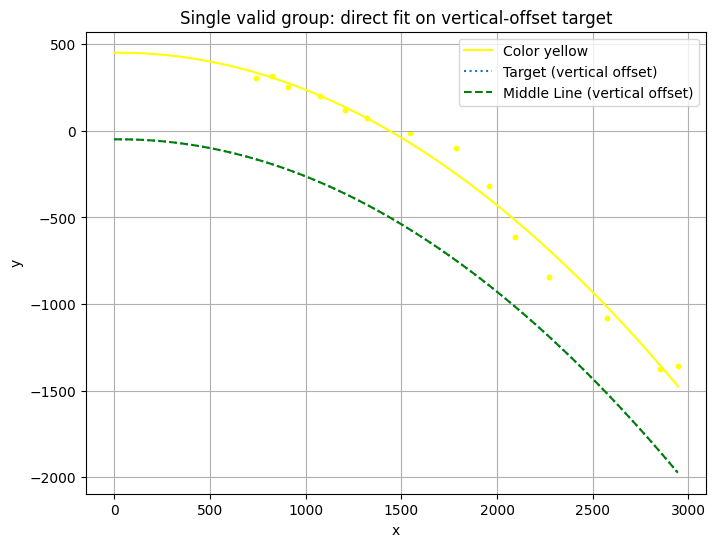

{'x_list': [np.float64(640.2886962890625), np.float64(722.8905029296875), np.float64(974.8681640625), np.float64(806.135986328125), np.float64(1445.4464111328125), np.float64(1684.71826171875), np.float64(1859.656494140625), np.float64(2172.25390625), np.float64(1992.158203125), np.float64(1220.603515625), np.float64(2475.46044921875), np.float64(1107.7177734375), np.float64(2749.46533203125), np.float64(2844.743896484375)], 'y_list': [np.float64(304.5851745605469), np.float64(319.4214782714844), np.float64(202.6992950439453), np.float64(255.06497192382812), np.float64(-10.515070915222168), np.float64(-98.34203338623047), np.float64(-318.0823669433594), np.float64(-841.9772338867188), np.float64(-612.2345581054688), np.float64(73.75652313232422), np.float64(-1081.788818359375), np.float64(122.92430877685547), np.float64(-1374.7415771484375), np.float64(-1359.3348388671875)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}


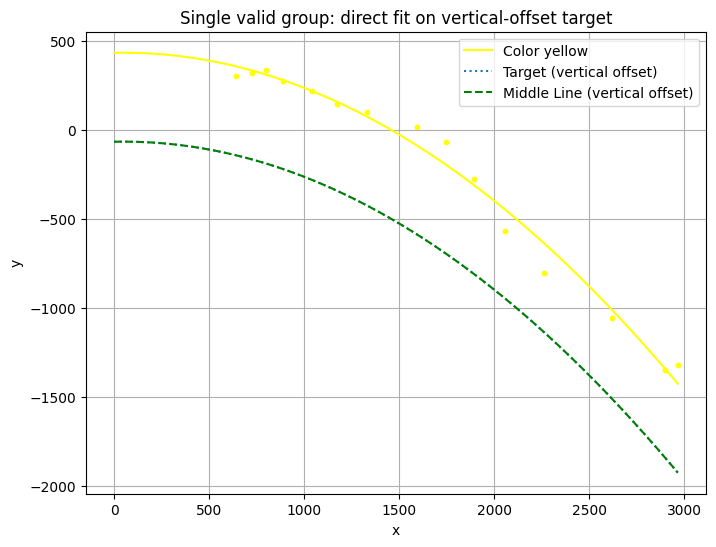

{'x_list': [np.float64(540.2886962890625), np.float64(622.8905029296875), np.float64(700.5286865234375), np.float64(785.6466064453125), np.float64(1793.0208740234375), np.float64(1490.6055908203125), np.float64(938.5758056640625), np.float64(1646.7454833984375), np.float64(1958.314208984375), np.float64(1074.4453125), np.float64(1230.9691162109375), np.float64(2163.58642578125), np.float64(2517.560302734375), np.float64(2799.619140625), np.float64(2865.09423828125)], 'y_list': [np.float64(304.5851745605469), np.float64(319.4214782714844), np.float64(337.1930847167969), np.float64(272.2326354980469), np.float64(-278.0760192871094), np.float64(17.00651741027832), np.float64(219.93614196777344), np.float64(-67.54360961914062), np.float64(-568.6642456054688), np.float64(145.17758178710938), np.float64(100.45492553710938), np.float64(-803.6925659179688), np.float64(-1059.0098876953125), np.float64(-1351.9202880859375), np.float64(-1319.9443359375)], 'c_list': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

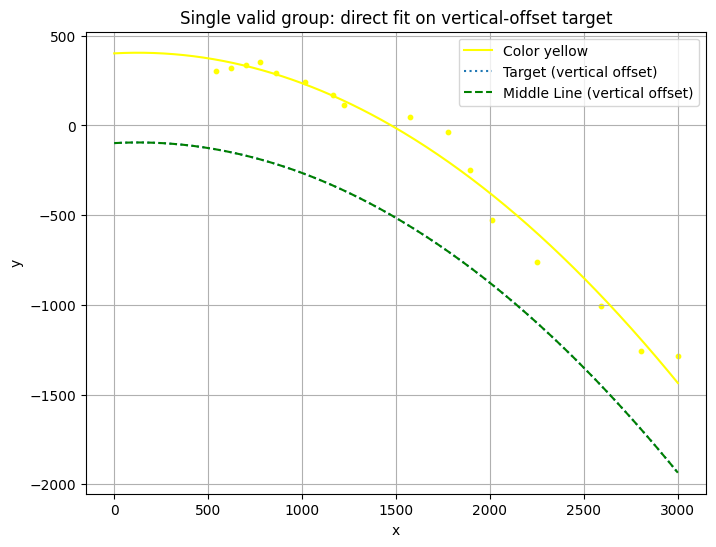

{'x_list': [np.float64(440.2886962890625), np.float64(522.8905029296875), np.float64(600.5286865234375), np.float64(678.62109375), np.float64(918.1105346679688), np.float64(1792.340087890625), np.float64(1677.631103515625), np.float64(759.9030151367188), np.float64(1473.5413818359375), np.float64(1908.516357421875), np.float64(2152.586669921875), np.float64(2490.5751953125), np.float64(1067.0123291015625), np.float64(1125.42578125), np.float64(2703.956298828125), np.float64(2900.18408203125)], 'y_list': [np.float64(304.5851745605469), np.float64(319.4214782714844), np.float64(337.1930847167969), np.float64(355.7315673828125), np.float64(240.640380859375), np.float64(-247.17869567871094), np.float64(-36.1004753112793), np.float64(290.6113586425781), np.float64(44.402870178222656), np.float64(-524.1847534179688), np.float64(-763.60791015625), np.float64(-1003.9104614257812), np.float64(167.58848571777344), np.float64(116.6406478881836), np.float64(-1259.238037109375), np.float64(-1284.84

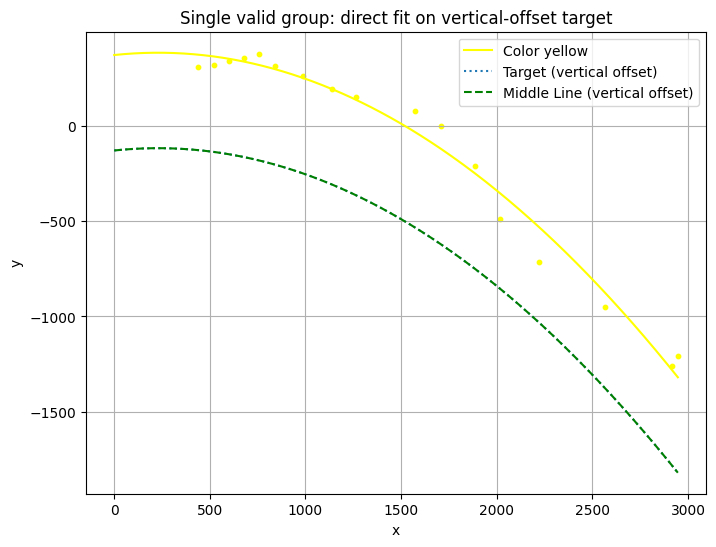

{'x_list': [np.float64(340.2886962890625), np.float64(422.8905029296875), np.float64(500.5286865234375), np.float64(578.62109375), np.float64(656.1843872070312), np.float64(738.77734375), np.float64(884.5762329101562), np.float64(1784.466552734375), np.float64(1915.92578125), np.float64(1040.3695068359375), np.float64(1472.394287109375), np.float64(2122.552001953125), np.float64(1165.6226806640625), np.float64(1608.496826171875), np.float64(2464.140625), np.float64(2817.4111328125), np.float64(2846.818115234375)], 'y_list': [np.float64(304.5851745605469), np.float64(319.4214782714844), np.float64(337.1930847167969), np.float64(355.7315673828125), np.float64(376.71673583984375), np.float64(310.8888854980469), np.float64(258.8377685546875), np.float64(-211.8378143310547), np.float64(-491.6053771972656), np.float64(191.15164184570312), np.float64(75.0255355834961), np.float64(-713.2155151367188), np.float64(147.95225524902344), np.float64(-1.6534112691879272), np.float64(-949.935363769531

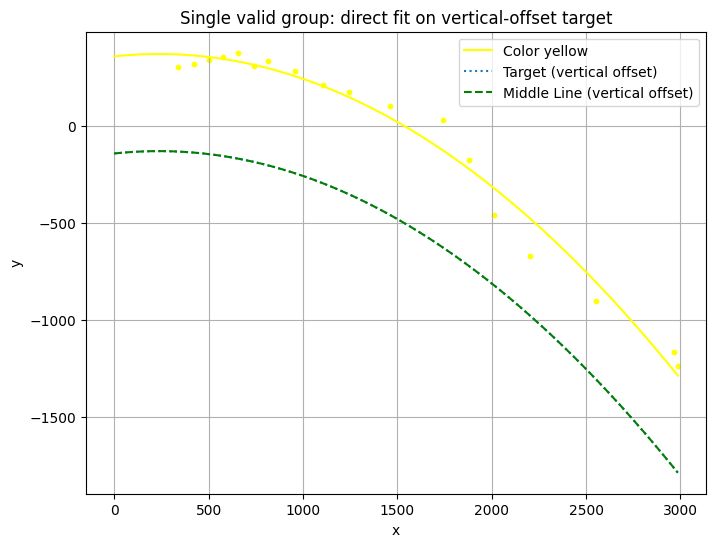

{'x_list': [np.float64(240.2886962890625), np.float64(322.8905029296875), np.float64(400.5286865234375), np.float64(478.62109375), np.float64(556.1843872070312), np.float64(638.77734375), np.float64(859.3515014648438), np.float64(1782.4317626953125), np.float64(714.42041015625), np.float64(1914.4814453125), np.float64(1361.4451904296875), np.float64(2102.184326171875), np.float64(1642.317626953125), np.float64(1146.5545654296875), np.float64(2450.218994140625), np.float64(1005.8819580078125), np.float64(2886.46240234375), np.float64(2864.051025390625)], 'y_list': [np.float64(304.5851745605469), np.float64(319.4214782714844), np.float64(337.1930847167969), np.float64(355.7315673828125), np.float64(376.71673583984375), np.float64(310.8888854980469), np.float64(281.0732116699219), np.float64(-177.4368133544922), np.float64(331.65692138671875), np.float64(-456.90380859375), np.float64(101.22441101074219), np.float64(-671.2704467773438), np.float64(30.39462661743164), np.float64(173.0457000

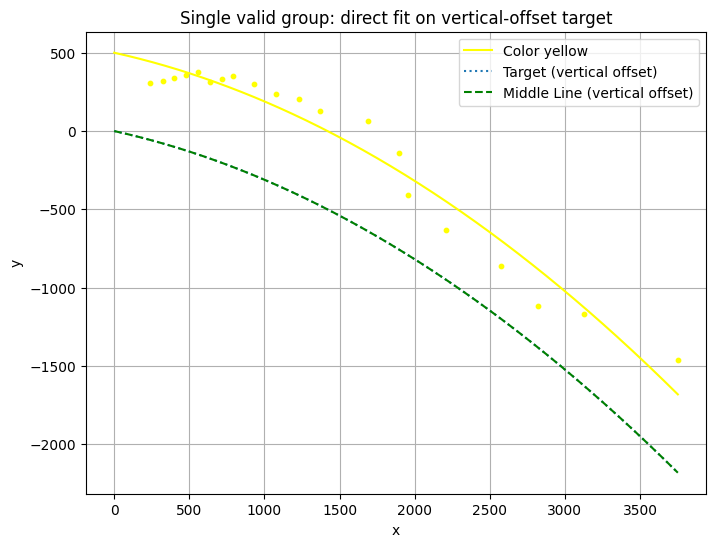

{'x_list': [np.float64(140.2886962890625), np.float64(222.8905029296875), np.float64(300.5286865234375), np.float64(378.62109375), np.float64(456.18438720703125), np.float64(538.77734375), np.float64(614.42041015625), np.float64(690.9258422851562), np.float64(831.5313720703125), np.float64(1794.80615234375), np.float64(1586.592529296875), np.float64(2111.139404296875), np.float64(1858.2618408203125), np.float64(1269.1268310546875), np.float64(1128.8795166015625), np.float64(2476.375244140625), np.float64(978.0997314453125), np.float64(2719.620849609375), np.float64(3029.821533203125), np.float64(3651.77880859375)], 'y_list': [np.float64(304.5851745605469), np.float64(319.4214782714844), np.float64(337.1930847167969), np.float64(355.7315673828125), np.float64(376.71673583984375), np.float64(310.8888854980469), np.float64(331.65692138671875), np.float64(352.2445983886719), np.float64(302.0841369628906), np.float64(-144.13185119628906), np.float64(65.45463562011719), np.float64(-634.20764

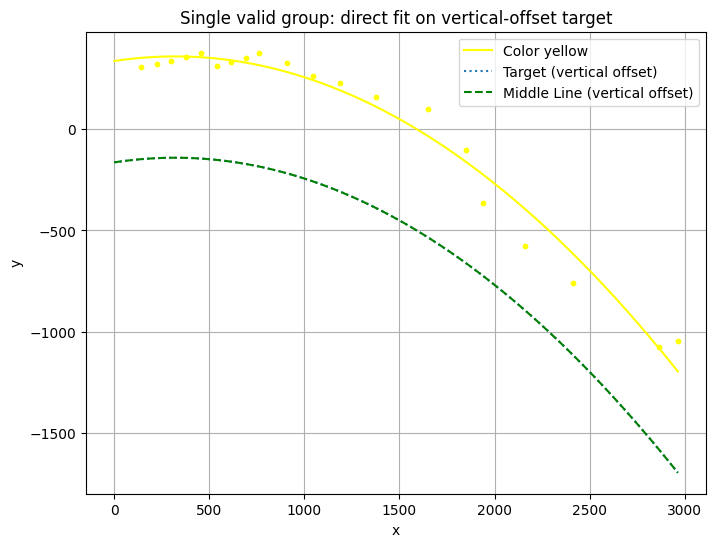

{'x_list': [np.float64(40.2886962890625), np.float64(122.8905029296875), np.float64(200.5286865234375), np.float64(278.62109375), np.float64(356.18438720703125), np.float64(438.77734375), np.float64(514.42041015625), np.float64(590.9258422851562), np.float64(808.2612915039062), np.float64(660.3062744140625), np.float64(1750.8900146484375), np.float64(1278.7412109375), np.float64(1840.87255859375), np.float64(1550.7181396484375), np.float64(1089.3851318359375), np.float64(2061.734619140625), np.float64(946.530029296875), np.float64(2312.77880859375), np.float64(2765.655517578125), np.float64(2864.051025390625)], 'y_list': [np.float64(304.5851745605469), np.float64(319.4214782714844), np.float64(337.1930847167969), np.float64(355.7315673828125), np.float64(376.71673583984375), np.float64(310.8888854980469), np.float64(331.65692138671875), np.float64(352.2445983886719), np.float64(327.8935241699219), np.float64(375.2696228027344), np.float64(-101.65692901611328), np.float64(159.1771392822

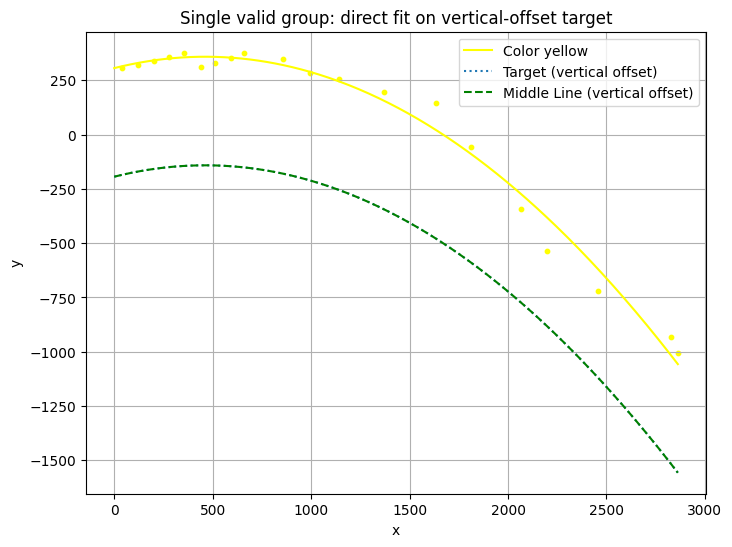

{'x_list': [np.float64(-59.7113037109375), np.float64(22.8905029296875), np.float64(100.5286865234375), np.float64(178.62109375), np.float64(256.18438720703125), np.float64(338.77734375), np.float64(414.42041015625), np.float64(490.92584228515625), np.float64(560.3062744140625), np.float64(757.9979858398438), np.float64(1713.5872802734375), np.float64(1267.9588623046875), np.float64(1535.5003662109375), np.float64(1967.291015625), np.float64(892.8153686523438), np.float64(1041.2169189453125), np.float64(2095.897705078125), np.float64(2357.46533203125), np.float64(2762.614990234375), np.float64(2727.59326171875)], 'y_list': [np.float64(304.5851745605469), np.float64(319.4214782714844), np.float64(337.1930847167969), np.float64(355.7315673828125), np.float64(376.71673583984375), np.float64(310.8888854980469), np.float64(331.65692138671875), np.float64(352.2445983886719), np.float64(375.2696228027344), np.float64(347.7442626953125), np.float64(-56.02146530151367), np.float64(197.179794311

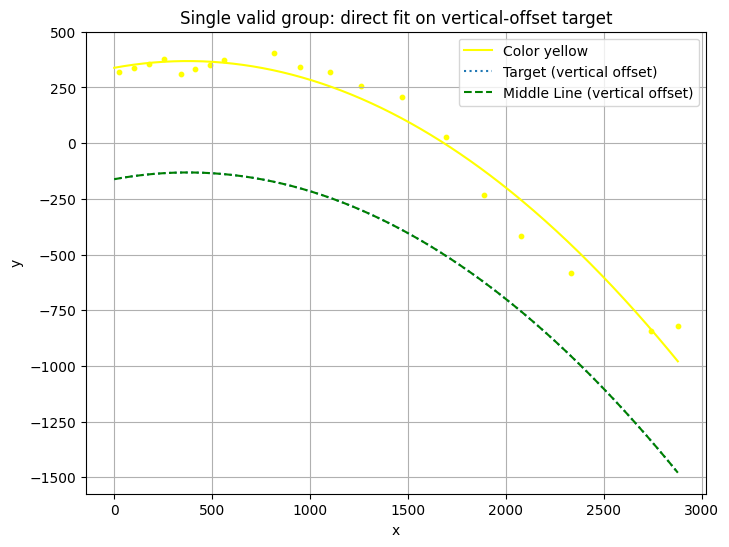

{'x_list': [np.float64(-77.1094970703125), np.float64(0.5286865234375), np.float64(78.62109375), np.float64(156.18438720703125), np.float64(238.77734375), np.float64(314.42041015625), np.float64(390.92584228515625), np.float64(460.3062744140625), np.float64(714.5977172851562), np.float64(1593.33544921875), np.float64(849.4769287109375), np.float64(1157.657958984375), np.float64(1785.822998046875), np.float64(999.977294921875), np.float64(1370.786376953125), np.float64(1976.953369140625), np.float64(2232.564208984375), np.float64(2639.122802734375), np.float64(2777.81787109375)], 'y_list': [np.float64(319.4214782714844), np.float64(337.1930847167969), np.float64(355.7315673828125), np.float64(376.71673583984375), np.float64(310.8888854980469), np.float64(331.65692138671875), np.float64(352.2445983886719), np.float64(375.2696228027344), np.float64(405.8848571777344), np.float64(29.454587936401367), np.float64(343.00469970703125), np.float64(254.78855895996094), np.float64(-231.7541961669

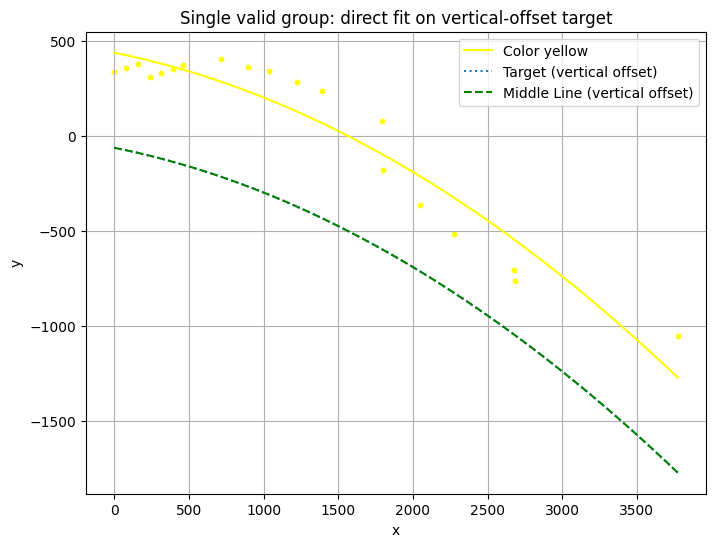

{'x_list': [np.float64(-99.4713134765625), np.float64(-21.37890625), np.float64(56.18438720703125), np.float64(138.77734375), np.float64(214.42041015625), np.float64(290.92584228515625), np.float64(360.3062744140625), np.float64(614.5977172851562), np.float64(1696.4432373046875), np.float64(795.1006469726562), np.float64(1123.10888671875), np.float64(1702.2352294921875), np.float64(1950.577880859375), np.float64(939.3531494140625), np.float64(1288.630126953125), np.float64(2177.9296875), np.float64(2580.84375), np.float64(3674.28466796875), np.float64(2578.928955078125)], 'y_list': [np.float64(337.1930847167969), np.float64(355.7315673828125), np.float64(376.71673583984375), np.float64(310.8888854980469), np.float64(331.65692138671875), np.float64(352.2445983886719), np.float64(375.2696228027344), np.float64(405.8848571777344), np.float64(78.20515441894531), np.float64(365.5267333984375), np.float64(286.9150085449219), np.float64(-176.6204071044922), np.float64(-364.4853210449219), np.

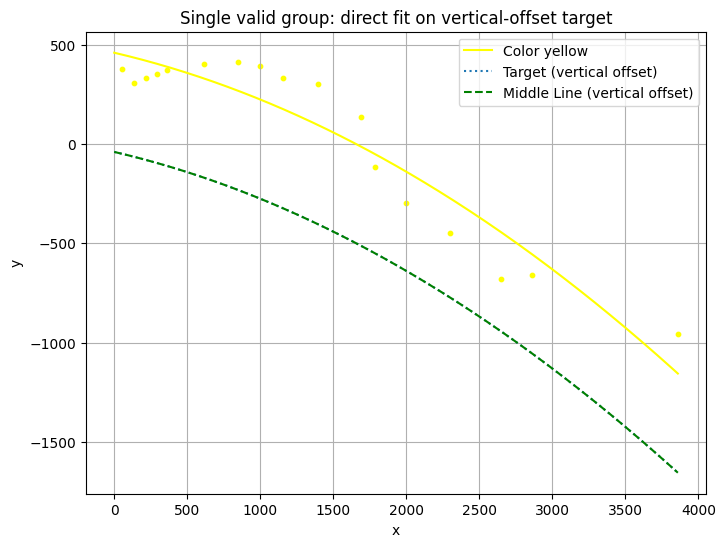

{'x_list': [np.float64(-43.81561279296875), np.float64(38.77734375), np.float64(114.42041015625), np.float64(190.92584228515625), np.float64(260.3062744140625), np.float64(514.5977172851562), np.float64(1592.4083251953125), np.float64(748.7437133789062), np.float64(1685.35888671875), np.float64(1294.449951171875), np.float64(1898.30078125), np.float64(898.935546875), np.float64(1058.576171875), np.float64(2196.373291015625), np.float64(2550.74658203125), np.float64(2759.54345703125), np.float64(3758.71240234375)], 'y_list': [np.float64(376.71673583984375), np.float64(310.8888854980469), np.float64(331.65692138671875), np.float64(352.2445983886719), np.float64(375.2696228027344), np.float64(405.8848571777344), np.float64(137.9287109375), np.float64(412.7494201660156), np.float64(-116.89678192138672), np.float64(305.139892578125), np.float64(-296.4187927246094), np.float64(395.8140869140625), np.float64(332.7539978027344), np.float64(-449.9706115722656), np.float64(-679.1865844726562), n

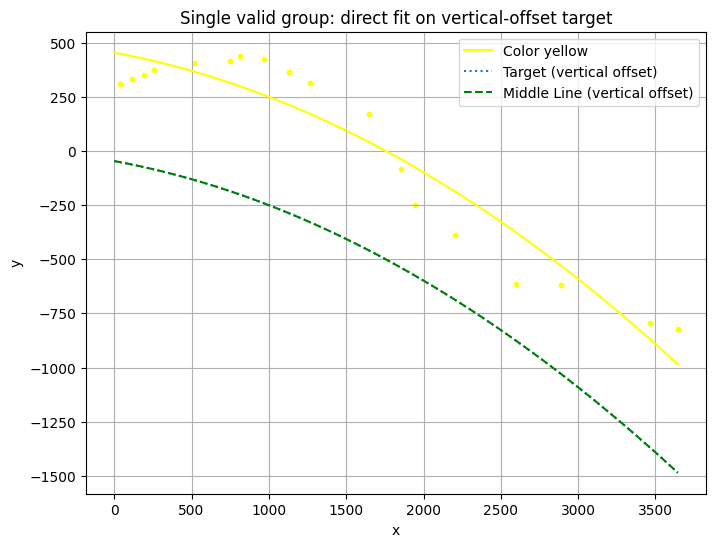

{'x_list': [np.float64(-61.22265625), np.float64(14.42041015625), np.float64(90.92584228515625), np.float64(160.3062744140625), np.float64(414.59771728515625), np.float64(648.7437133789062), np.float64(1545.77734375), np.float64(715.0897216796875), np.float64(1168.935791015625), np.float64(1028.37744140625), np.float64(1751.55810546875), np.float64(866.9877319335938), np.float64(1843.65966796875), np.float64(2105.32763671875), np.float64(2495.172607421875), np.float64(2792.223876953125), np.float64(3364.96630859375), np.float64(3544.58544921875)], 'y_list': [np.float64(310.8888854980469), np.float64(331.65692138671875), np.float64(352.2445983886719), np.float64(375.2696228027344), np.float64(405.8848571777344), np.float64(412.7494201660156), np.float64(172.57620239257812), np.float64(437.618408203125), np.float64(314.130859375), np.float64(361.8986511230469), np.float64(-83.82238006591797), np.float64(424.4659118652344), np.float64(-251.11184692382812), np.float64(-390.1759338378906), 

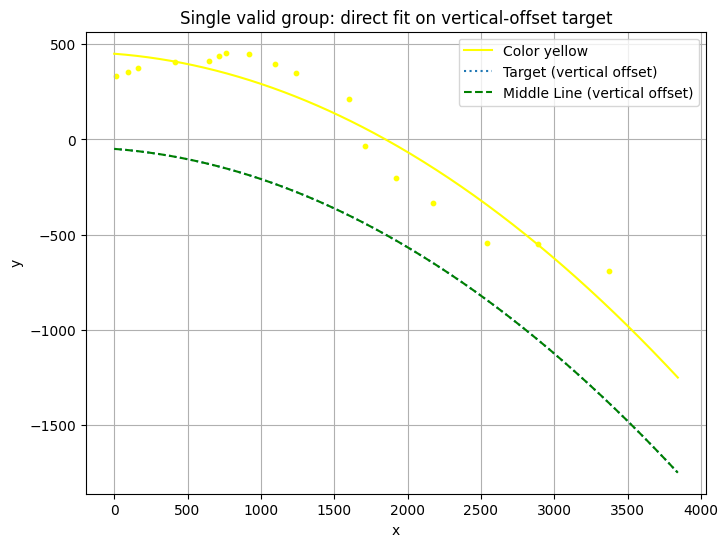

{'x_list': [np.float64(-85.57958984375), np.float64(-9.07415771484375), np.float64(60.3062744140625), np.float64(314.59771728515625), np.float64(548.7437133789062), np.float64(615.0897216796875), np.float64(1500.4188232421875), np.float64(1608.7574462890625), np.float64(821.0773315429688), np.float64(663.7210693359375), np.float64(1136.5340576171875), np.float64(994.126708984375), np.float64(1819.080078125), np.float64(2075.787109375), np.float64(2441.84375), np.float64(2791.20458984375), np.float64(3271.997802734375)], 'y_list': [np.float64(331.65692138671875), np.float64(352.2445983886719), np.float64(375.2696228027344), np.float64(405.8848571777344), np.float64(412.7494201660156), np.float64(437.618408203125), np.float64(213.1927947998047), np.float64(-36.24918746948242), np.float64(449.1054382324219), np.float64(455.6164245605469), np.float64(349.5252380371094), np.float64(395.54742431640625), np.float64(-204.0782012939453), np.float64(-335.3981018066406), np.float64(-545.926330566

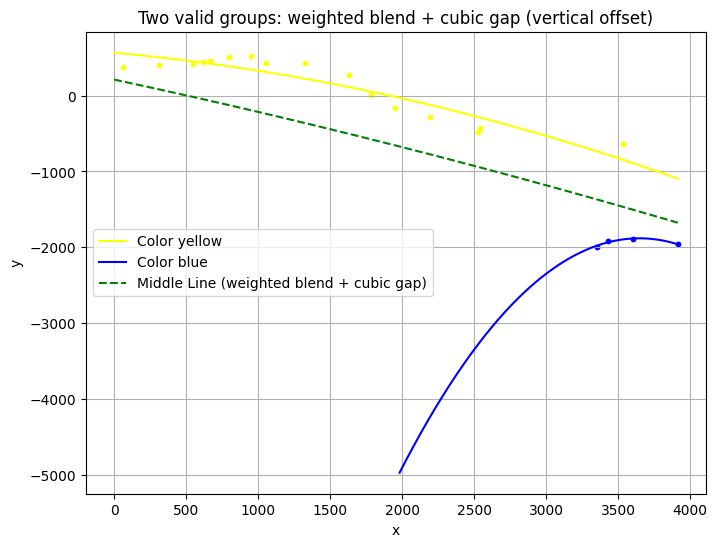

{'x_list': [np.float64(-39.6937255859375), np.float64(214.59771728515625), np.float64(448.74371337890625), np.float64(515.0897216796875), np.float64(563.7210693359375), np.float64(1529.4539794921875), np.float64(847.4111938476562), np.float64(1228.47412109375), np.float64(953.8707275390625), np.float64(1680.85107421875), np.float64(697.8511352539062), np.float64(2094.090576171875), np.float64(1847.7843017578125), np.float64(3327.0908203125), np.float64(3504.821044921875), np.float64(2441.620361328125), np.float64(2429.07080078125), np.float64(3815.3330078125), np.float64(3250.73388671875), np.float64(3435.914306640625)], 'y_list': [np.float64(375.2696228027344), np.float64(405.8848571777344), np.float64(412.7494201660156), np.float64(437.618408203125), np.float64(455.6164245605469), np.float64(266.6622009277344), np.float64(514.8179321289062), np.float64(423.7105407714844), np.float64(426.6679382324219), np.float64(6.876281261444092), np.float64(505.3194885253906), np.float64(-288.2156

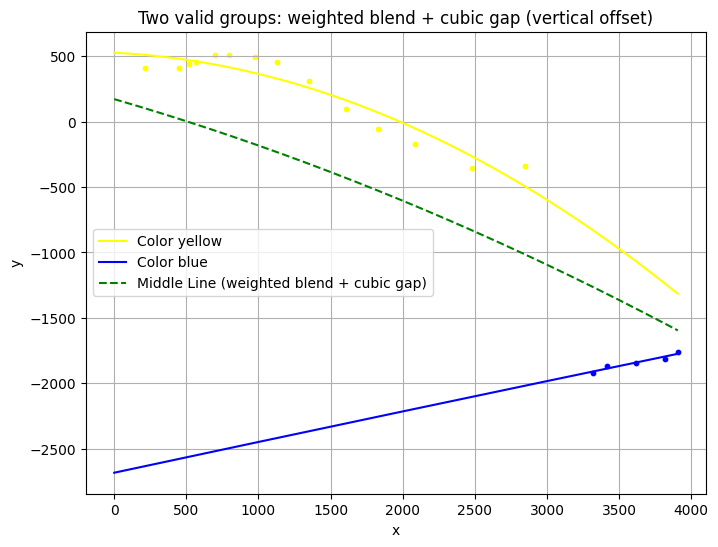

{'x_list': [np.float64(114.59771728515625), np.float64(348.74371337890625), np.float64(415.0897216796875), np.float64(463.7210693359375), np.float64(597.8511352539062), np.float64(1505.082275390625), np.float64(878.6548461914062), np.float64(1250.9412841796875), np.float64(1028.514404296875), np.float64(1726.20361328125), np.float64(1986.389892578125), np.float64(2383.562744140625), np.float64(3714.946044921875), np.float64(3516.553955078125), np.float64(694.8154907226562), np.float64(3807.099853515625), np.float64(3215.780517578125), np.float64(2750.47314453125), np.float64(3312.627685546875)], 'y_list': [np.float64(405.8848571777344), np.float64(412.7494201660156), np.float64(437.618408203125), np.float64(455.6164245605469), np.float64(505.3194885253906), np.float64(93.3691177368164), np.float64(493.9651794433594), np.float64(308.19586181640625), np.float64(455.9671325683594), np.float64(-57.985321044921875), np.float64(-173.33839416503906), np.float64(-358.3155212402344), np.float64

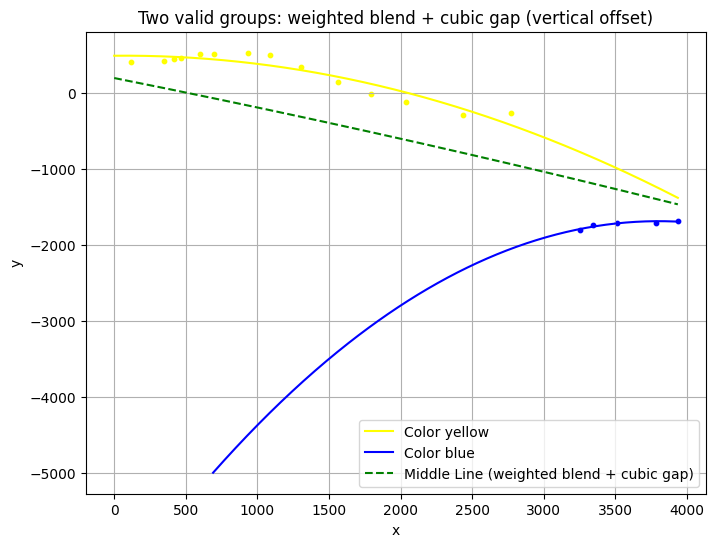

{'x_list': [np.float64(14.59771728515625), np.float64(248.74371337890625), np.float64(315.0897216796875), np.float64(363.7210693359375), np.float64(497.85113525390625), np.float64(594.8154907226562), np.float64(1203.5264892578125), np.float64(3414.85546875), np.float64(1466.3363037109375), np.float64(990.452880859375), np.float64(836.1994018554688), np.float64(1697.0460205078125), np.float64(1940.7117919921875), np.float64(3150.453125), np.float64(3683.81396484375), np.float64(2333.606201171875), np.float64(3244.8271484375), np.float64(3837.3876953125), np.float64(2670.203369140625)], 'y_list': [np.float64(405.8848571777344), np.float64(412.7494201660156), np.float64(437.618408203125), np.float64(455.6164245605469), np.float64(505.3194885253906), np.float64(507.48858642578125), np.float64(343.0561828613281), np.float64(-1709.6273193359375), np.float64(133.87876892089844), np.float64(489.2583923339844), np.float64(524.6561279296875), np.float64(-12.12100887298584), np.float64(-120.99718

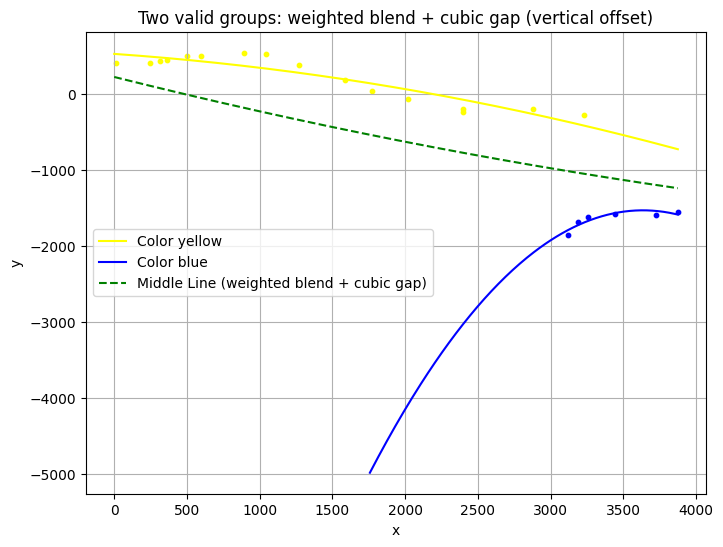

{'x_list': [np.float64(-85.40228271484375), np.float64(148.74371337890625), np.float64(215.0897216796875), np.float64(263.7210693359375), np.float64(397.85113525390625), np.float64(494.81549072265625), np.float64(791.7021484375), np.float64(944.906005859375), np.float64(1168.9888916015625), np.float64(1488.2889404296875), np.float64(1675.0867919921875), np.float64(3087.606689453125), np.float64(1921.9451904296875), np.float64(2296.967041015625), np.float64(3339.4833984375), np.float64(3774.551513671875), np.float64(3018.238525390625), np.float64(3626.858154296875), np.float64(3157.358154296875), np.float64(2778.97265625), np.float64(3129.497314453125), np.float64(2299.527587890625)], 'y_list': [np.float64(405.8848571777344), np.float64(412.7494201660156), np.float64(437.618408203125), np.float64(455.6164245605469), np.float64(505.3194885253906), np.float64(507.48858642578125), np.float64(545.379150390625), np.float64(523.3811645507812), np.float64(382.44573974609375), np.float64(183.97

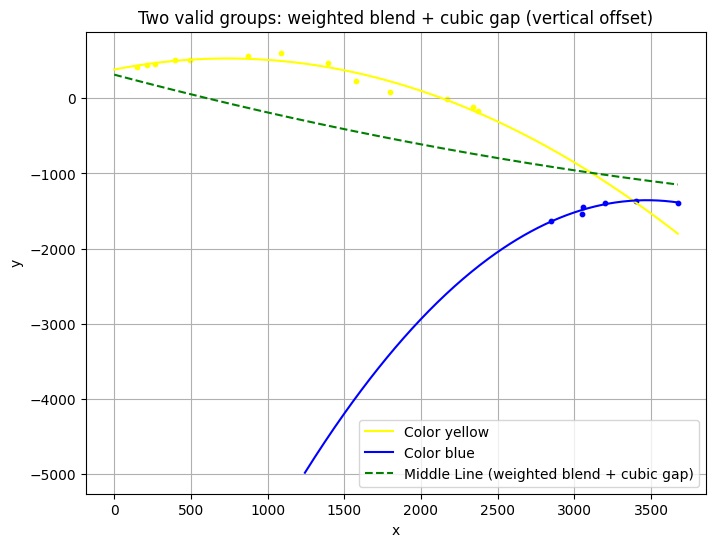

{'x_list': [np.float64(48.74371337890625), np.float64(115.0897216796875), np.float64(163.7210693359375), np.float64(297.85113525390625), np.float64(394.81549072265625), np.float64(989.8153076171875), np.float64(1293.23046875), np.float64(1474.58935546875), np.float64(1697.0943603515625), np.float64(2068.151123046875), np.float64(2949.131591796875), np.float64(2956.69921875), np.float64(2750.45263671875), np.float64(3100.025634765625), np.float64(2270.865478515625), np.float64(2240.86083984375), np.float64(3299.301513671875), np.float64(774.7142333984375), np.float64(3575.430908203125)], 'y_list': [np.float64(412.7494201660156), np.float64(437.618408203125), np.float64(455.6164245605469), np.float64(505.3194885253906), np.float64(507.48858642578125), np.float64(604.8507080078125), np.float64(473.429931640625), np.float64(230.41087341308594), np.float64(85.1567153930664), np.float64(-16.635194778442383), np.float64(-1541.0997314453125), np.float64(-1445.8631591796875), np.float64(-1631.4

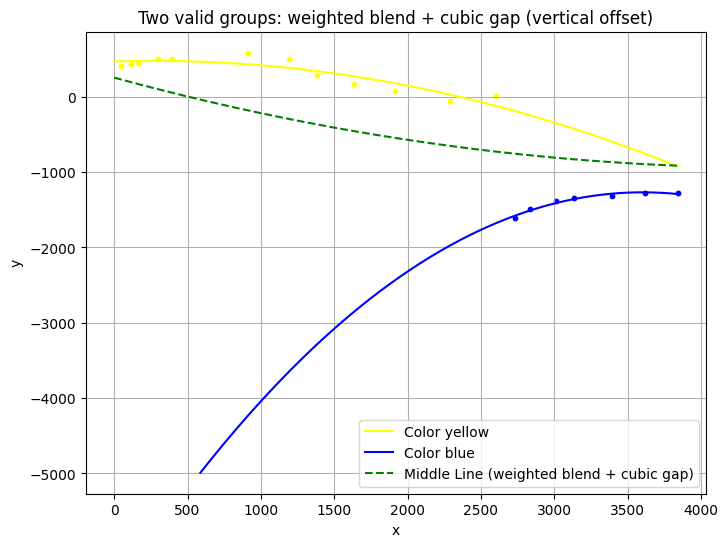

{'x_list': [np.float64(-51.25628662109375), np.float64(15.0897216796875), np.float64(63.7210693359375), np.float64(197.85113525390625), np.float64(294.81549072265625), np.float64(1088.6483154296875), np.float64(1531.7447509765625), np.float64(1281.64453125), np.float64(1813.5701904296875), np.float64(2191.463623046875), np.float64(2734.348388671875), np.float64(3290.92138671875), np.float64(2912.614990234375), np.float64(2630.696533203125), np.float64(3742.49609375), np.float64(3517.828125), np.float64(3031.533935546875), np.float64(2504.922119140625), np.float64(810.6210327148438)], 'y_list': [np.float64(412.7494201660156), np.float64(437.618408203125), np.float64(455.6164245605469), np.float64(505.3194885253906), np.float64(507.48858642578125), np.float64(503.359130859375), np.float64(164.52816772460938), np.float64(286.7917175292969), np.float64(79.05731964111328), np.float64(-54.60807418823242), np.float64(-1490.4241943359375), np.float64(-1323.0841064453125), np.float64(-1385.7763

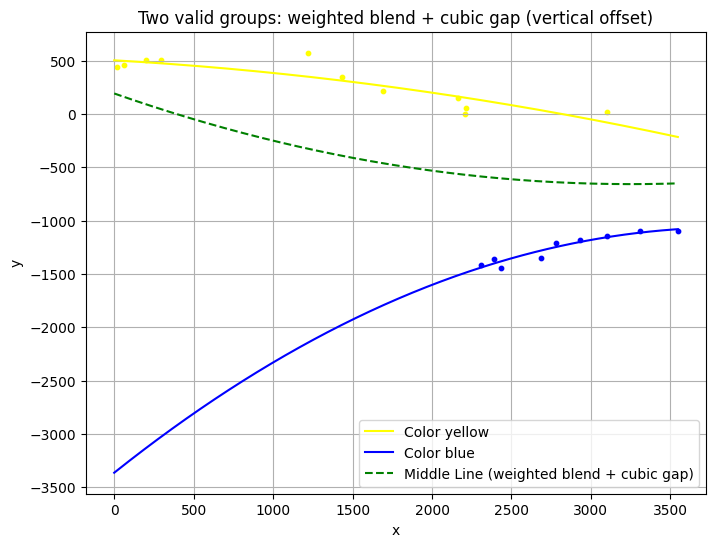

{'x_list': [np.float64(-84.9102783203125), np.float64(-36.2789306640625), np.float64(97.85113525390625), np.float64(194.81549072265625), np.float64(1120.56640625), np.float64(1335.7059326171875), np.float64(2061.91943359375), np.float64(1591.1781005859375), np.float64(2291.845947265625), np.float64(2109.560791015625), np.float64(2679.59521484375), np.float64(2582.779052734375), np.float64(2832.298583984375), np.float64(3000.770751953125), np.float64(3446.91943359375), np.float64(3210.43115234375), np.float64(2210.955322265625), np.float64(2113.185791015625), np.float64(3002.95947265625), np.float64(2333.05224609375)], 'y_list': [np.float64(437.618408203125), np.float64(455.6164245605469), np.float64(505.3194885253906), np.float64(507.48858642578125), np.float64(574.8289794921875), np.float64(346.5706787109375), np.float64(149.7167510986328), np.float64(218.38711547851562), np.float64(-1355.6390380859375), np.float64(2.107002019882202), np.float64(-1212.818359375), np.float64(-1349.6081

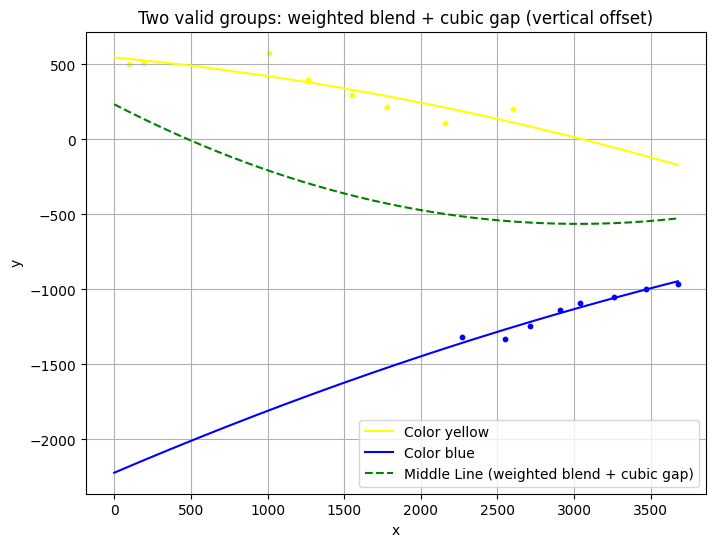

{'x_list': [np.float64(-2.14886474609375), np.float64(94.81549072265625), np.float64(907.8167114257812), np.float64(1165.6669921875), np.float64(1448.6435546875), np.float64(2450.489013671875), np.float64(1679.578369140625), np.float64(2810.193359375), np.float64(2060.190185546875), np.float64(2612.74609375), np.float64(3161.961669921875), np.float64(2939.360107421875), np.float64(2169.596923828125), np.float64(3576.7236328125), np.float64(3370.3720703125), np.float64(2503.997802734375)], 'y_list': [np.float64(505.3194885253906), np.float64(507.48858642578125), np.float64(578.5110473632812), np.float64(396.4031982421875), np.float64(295.35369873046875), np.float64(-1328.937744140625), np.float64(219.24949645996094), np.float64(-1136.782470703125), np.float64(109.25399017333984), np.float64(-1243.222412109375), np.float64(-1047.6014404296875), np.float64(-1087.1876220703125), np.float64(-1317.6556396484375), np.float64(-962.7167358398438), np.float64(-994.7647705078125), np.float64(202.

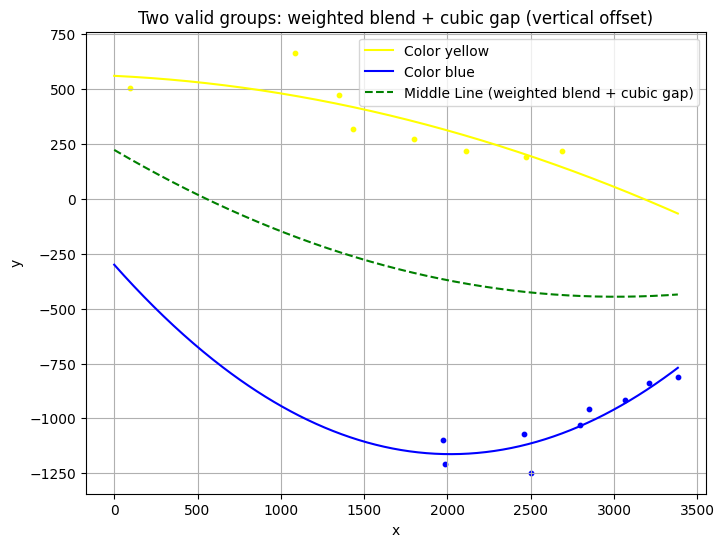

{'x_list': [np.float64(-5.18450927734375), np.float64(986.482177734375), np.float64(1333.01416015625), np.float64(1247.0283203125), np.float64(1696.3973388671875), np.float64(2399.479248046875), np.float64(2368.55029296875), np.float64(2697.019287109375), np.float64(3106.799560546875), np.float64(2963.185791015625), np.float64(2360.962890625), np.float64(1871.679931640625), np.float64(3282.58544921875), np.float64(1887.6572265625), np.float64(2749.46533203125), np.float64(2010.895751953125), np.float64(2590.33203125)], 'y_list': [np.float64(507.48858642578125), np.float64(665.9971313476562), np.float64(316.9894714355469), np.float64(474.85235595703125), np.float64(271.8569030761719), np.float64(-1247.5980224609375), np.float64(190.9444580078125), np.float64(-1031.7286376953125), np.float64(-840.8539428710938), np.float64(-914.8475952148438), np.float64(-1071.41064453125), np.float64(-1099.7547607421875), np.float64(-809.5101318359375), np.float64(-1205.81689453125), np.float64(-957.745

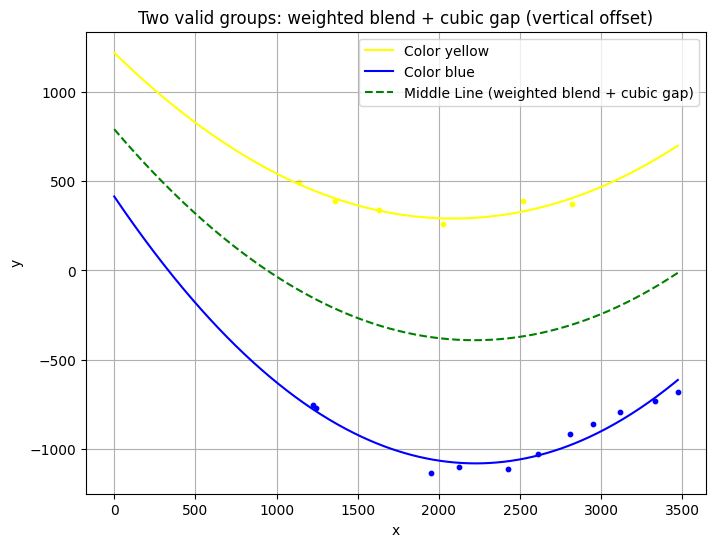

{'x_list': [np.float64(1040.536376953125), np.float64(1258.488525390625), np.float64(2021.822998046875), np.float64(1530.476318359375), np.float64(1922.6702880859375), np.float64(2511.056640625), np.float64(1122.8475341796875), np.float64(2324.947021484375), np.float64(2847.3603515625), np.float64(3016.608154296875), np.float64(1851.9007568359375), np.float64(2709.655517578125), np.float64(3228.689697265625), np.float64(3371.593994140625), np.float64(2418.314208984375), np.float64(1142.9210205078125), np.float64(2721.614013671875)], 'y_list': [np.float64(496.5903015136719), np.float64(389.7247619628906), np.float64(-1100.91748046875), np.float64(340.58087158203125), np.float64(259.3839416503906), np.float64(-1029.24853515625), np.float64(-756.2898559570312), np.float64(-1111.8629150390625), np.float64(-860.4701538085938), np.float64(-796.5768432617188), np.float64(-1134.9329833984375), np.float64(-917.7818603515625), np.float64(-733.0704345703125), np.float64(-681.658447265625), np.flo

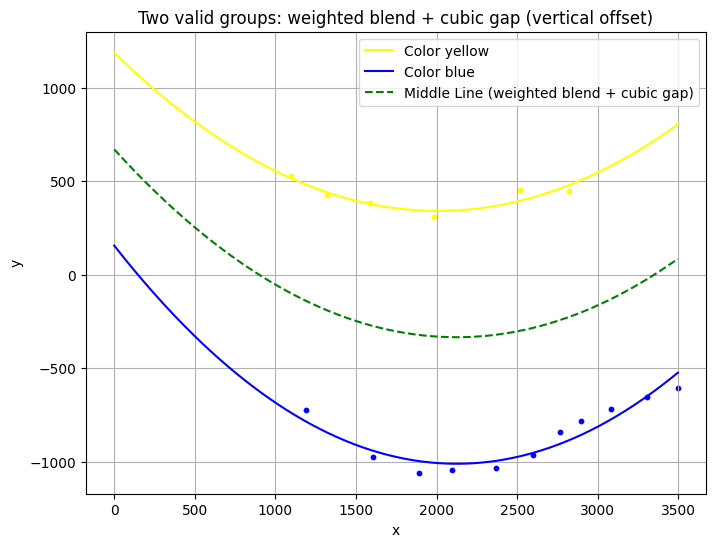

{'x_list': [np.float64(1219.1494140625), np.float64(994.9996337890625), np.float64(2267.48388671875), np.float64(1994.964599609375), np.float64(1486.6732177734375), np.float64(2980.776123046875), np.float64(2663.342529296875), np.float64(1881.6673583984375), np.float64(3208.099365234375), np.float64(1792.0723876953125), np.float64(2498.452392578125), np.float64(2797.56884765625), np.float64(3396.76611328125), np.float64(1090.27392578125), np.float64(1507.4271240234375), np.float64(2419.210693359375), np.float64(2720.617431640625)], 'y_list': [np.float64(427.0114440917969), np.float64(528.606201171875), np.float64(-1033.6092529296875), np.float64(-1042.779296875), np.float64(382.4820251464844), np.float64(-717.1771850585938), np.float64(-839.8602905273438), np.float64(309.2340393066406), np.float64(-653.5838623046875), np.float64(-1060.0076904296875), np.float64(-964.7012939453125), np.float64(-782.690673828125), np.float64(-607.5431518554688), np.float64(-726.1190795898438), np.float64

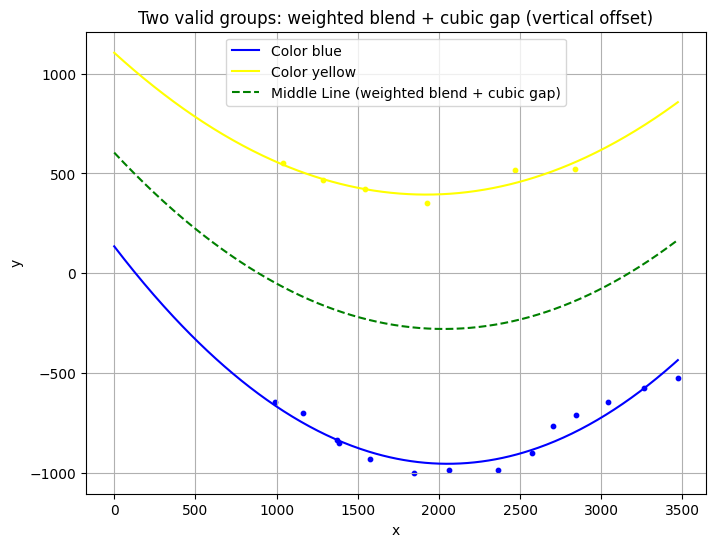

{'x_list': [np.float64(941.887939453125), np.float64(1187.287109375), np.float64(1443.9522705078125), np.float64(1825.1356201171875), np.float64(2266.638427734375), np.float64(1959.453125), np.float64(2941.50927734375), np.float64(1748.8857421875), np.float64(2470.886474609375), np.float64(3164.263427734375), np.float64(2603.915771484375), np.float64(2746.442138671875), np.float64(3371.593994140625), np.float64(1060.517822265625), np.float64(2366.9345703125), np.float64(890.9483642578125), np.float64(2735.46142578125), np.float64(1282.908935546875), np.float64(1275.1396484375), np.float64(1474.58935546875)], 'y_list': [np.float64(554.501953125), np.float64(466.0509338378906), np.float64(422.2749938964844), np.float64(354.36834716796875), np.float64(-983.9599609375), np.float64(-983.9786376953125), np.float64(-642.5595092773438), np.float64(-998.7346801757812), np.float64(-898.6417236328125), np.float64(-574.4911499023438), np.float64(-762.9159545898438), np.float64(-707.5480346679688),

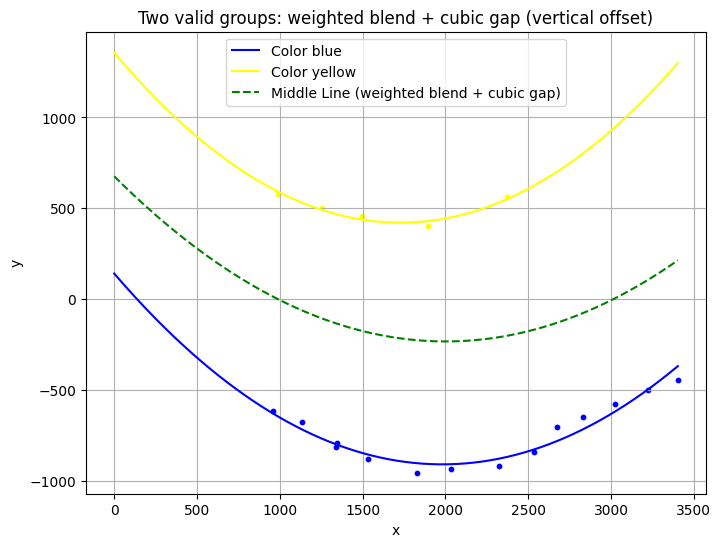

{'x_list': [np.float64(891.5310668945312), np.float64(1154.4146728515625), np.float64(1398.73046875), np.float64(1934.8631591796875), np.float64(2431.933837890625), np.float64(2575.150634765625), np.float64(2924.364501953125), np.float64(2223.437744140625), np.float64(1794.382568359375), np.float64(3122.68017578125), np.float64(1728.3426513671875), np.float64(858.2572631835938), np.float64(2731.452880859375), np.float64(3302.893310546875), np.float64(2271.7109375), np.float64(1031.749267578125), np.float64(1432.7332763671875), np.float64(1236.3450927734375), np.float64(1245.406982421875)], 'y_list': [np.float64(579.0059204101562), np.float64(502.15606689453125), np.float64(457.2516174316406), np.float64(-934.8009033203125), np.float64(-839.3317260742188), np.float64(-701.6093139648438), np.float64(-578.8325805664062), np.float64(-919.1428833007812), np.float64(401.6653747558594), np.float64(-500.446533203125), np.float64(-955.8922729492188), np.float64(-616.5826416015625), np.float64(-

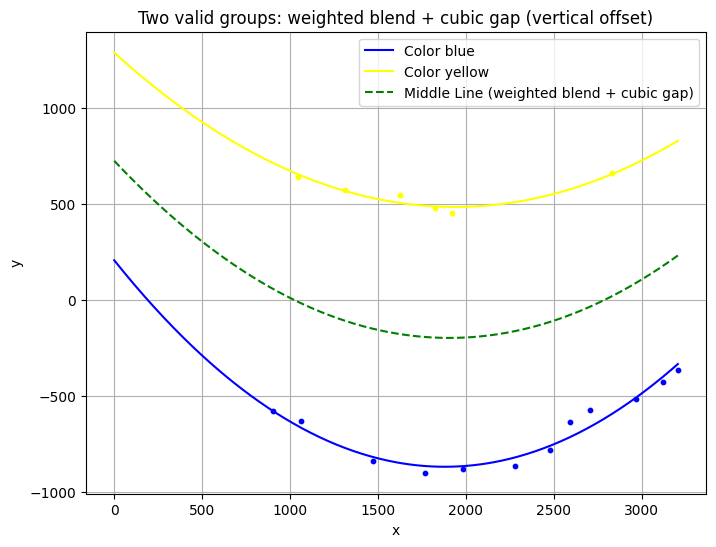

{'x_list': [np.float64(1214.6607666015625), np.float64(945.4732666015625), np.float64(1524.6331787109375), np.float64(2379.147216796875), np.float64(2178.556884765625), np.float64(2489.655517578125), np.float64(1820.2957763671875), np.float64(1883.8858642578125), np.float64(1666.1669921875), np.float64(803.868408203125), np.float64(2607.751953125), np.float64(2867.845703125), np.float64(3021.0126953125), np.float64(964.86083984375), np.float64(2729.448486328125), np.float64(1724.4373779296875), np.float64(1371.32373046875), np.float64(3105.670654296875)], 'y_list': [np.float64(575.0618896484375), np.float64(643.3753662109375), np.float64(545.7904663085938), np.float64(-780.2791748046875), np.float64(-867.5653686523438), np.float64(-635.7282104492188), np.float64(454.034423828125), np.float64(-881.8899536132812), np.float64(-901.1625366210938), np.float64(-581.0725708007812), np.float64(-573.4671020507812), np.float64(-515.3975219726562), np.float64(-429.152099609375), np.float64(-630.6

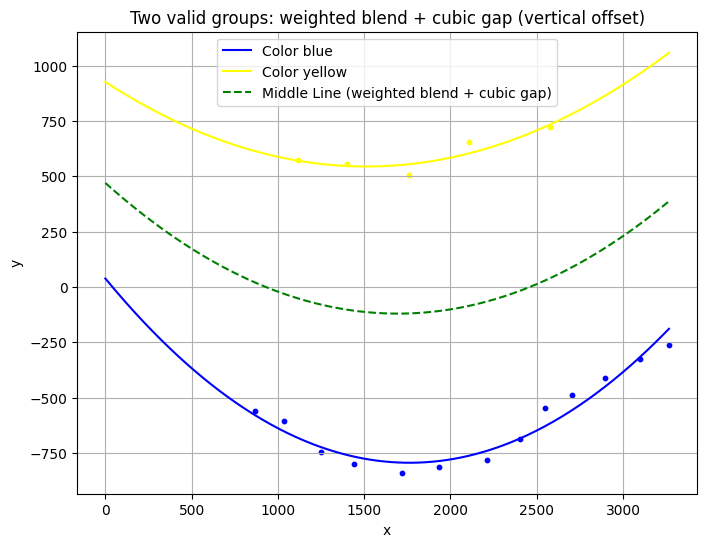

{'x_list': [np.float64(1014.1142578125), np.float64(1299.575927734375), np.float64(1659.3096923828125), np.float64(1833.904541015625), np.float64(2305.060546875), np.float64(2446.59716796875), np.float64(2603.915771484375), np.float64(2114.6240234375), np.float64(2797.56884765625), np.float64(768.4816284179688), np.float64(1619.820556640625), np.float64(2999.676513671875), np.float64(2479.11962890625), np.float64(3166.56494140625), np.float64(935.001220703125), np.float64(2004.749267578125), np.float64(1340.455810546875), np.float64(1152.541259765625)], 'y_list': [np.float64(574.970947265625), np.float64(555.5462036132812), np.float64(503.2960510253906), np.float64(-812.8583374023438), np.float64(-686.8015747070312), np.float64(-548.697509765625), np.float64(-486.4229431152344), np.float64(-780.9391479492188), np.float64(-410.5021057128906), np.float64(-559.739013671875), np.float64(-839.1466674804688), np.float64(-327.1928405761719), np.float64(720.3786010742188), np.float64(-261.1323

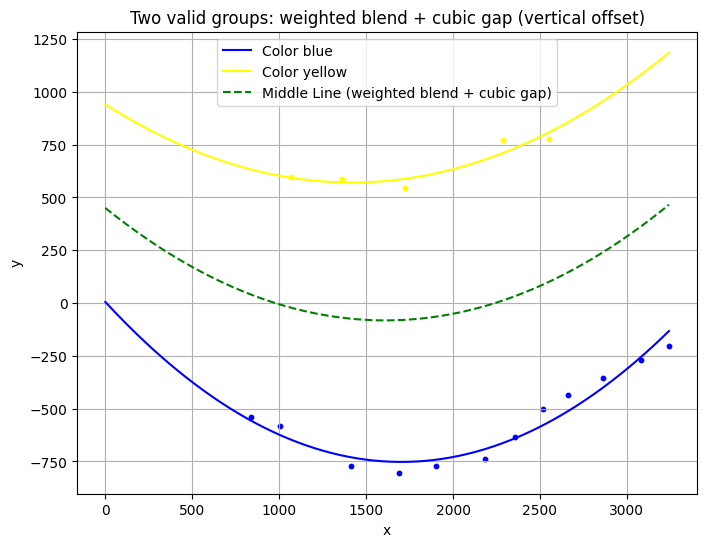

{'x_list': [np.float64(967.2484130859375), np.float64(1260.7947998046875), np.float64(1802.780029296875), np.float64(2560.996337890625), np.float64(2257.999267578125), np.float64(2979.6884765625), np.float64(2420.10693359375), np.float64(2763.62841796875), np.float64(2084.701904296875), np.float64(1625.4339599609375), np.float64(738.8815307617188), np.float64(1589.0445556640625), np.float64(3142.195068359375), np.float64(903.783203125), np.float64(2451.12451171875), np.float64(1313.25732421875), np.float64(2186.553955078125)], 'y_list': [np.float64(595.761962890625), np.float64(586.8916015625), np.float64(-772.8807983398438), np.float64(-435.8706970214844), np.float64(-635.6586303710938), np.float64(-270.0303039550781), np.float64(-500.1112365722656), np.float64(-357.1368408203125), np.float64(-739.3359375), np.float64(542.7814331054688), np.float64(-541.4725952148438), np.float64(-803.4556884765625), np.float64(-204.51426696777344), np.float64(-584.3598022460938), np.float64(775.91149

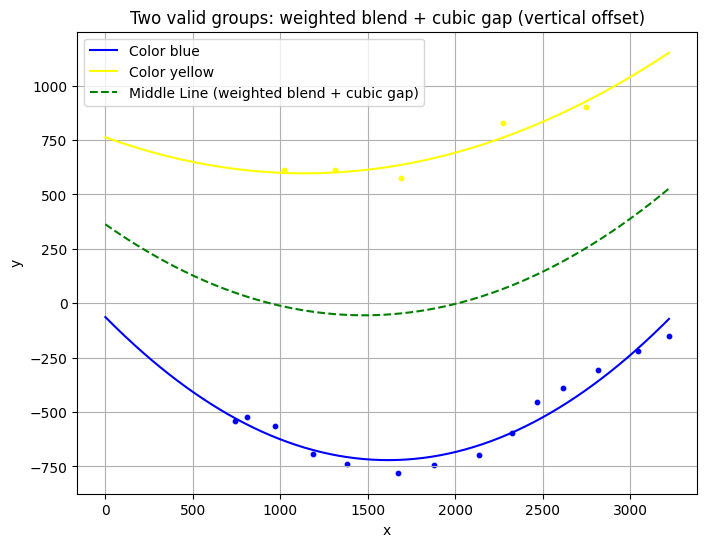

{'x_list': [np.float64(638.8815307617188), np.float64(919.0370483398438), np.float64(2036.28857421875), np.float64(1569.9891357421875), np.float64(2713.6416015625), np.float64(1212.6739501953125), np.float64(2224.267333984375), np.float64(2368.692138671875), np.float64(2517.560302734375), np.float64(1587.5362548828125), np.float64(706.9392700195312), np.float64(1779.71875), np.float64(2941.50927734375), np.float64(3120.407958984375), np.float64(2644.34326171875), np.float64(2173.669677734375), np.float64(871.130126953125), np.float64(1084.5745849609375), np.float64(1279.6175537109375)], 'y_list': [np.float64(-541.4725952148438), np.float64(610.332763671875), np.float64(-696.9021606445312), np.float64(-779.0604248046875), np.float64(-308.5875244140625), np.float64(610.3910522460938), np.float64(-595.7817993164062), np.float64(-455.0708923339844), np.float64(-389.37835693359375), np.float64(574.0281982421875), np.float64(-524.13720703125), np.float64(-742.337646484375), np.float64(-218.0

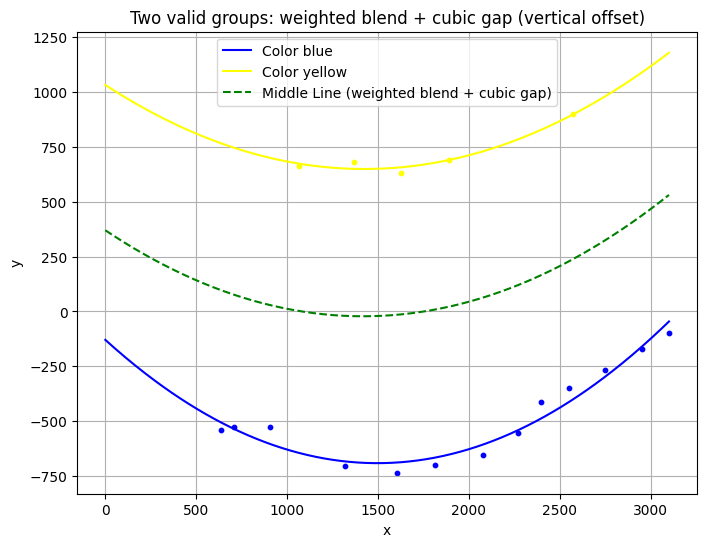

{'x_list': [np.float64(538.8815307617188), np.float64(606.9392700195312), np.float64(1268.6346435546875), np.float64(1792.48876953125), np.float64(1979.672607421875), np.float64(2296.113525390625), np.float64(1715.5546875), np.float64(963.201171875), np.float64(2650.191650390625), np.float64(806.8522338867188), np.float64(2449.313720703125), np.float64(2169.0107421875), np.float64(1502.1676025390625), np.float64(2850.489990234375), np.float64(3000.770751953125), np.float64(1217.21044921875), np.float64(2472.716064453125), np.float64(1526.135986328125)], 'y_list': [np.float64(-541.4725952148438), np.float64(-524.13720703125), np.float64(682.5731201171875), np.float64(690.4645385742188), np.float64(-653.5056762695312), np.float64(-412.3876647949219), np.float64(-698.5176391601562), np.float64(661.06591796875), np.float64(-265.4131774902344), np.float64(-526.7423706054688), np.float64(-348.07244873046875), np.float64(-554.1032104492188), np.float64(-734.5037231445312), np.float64(-172.650

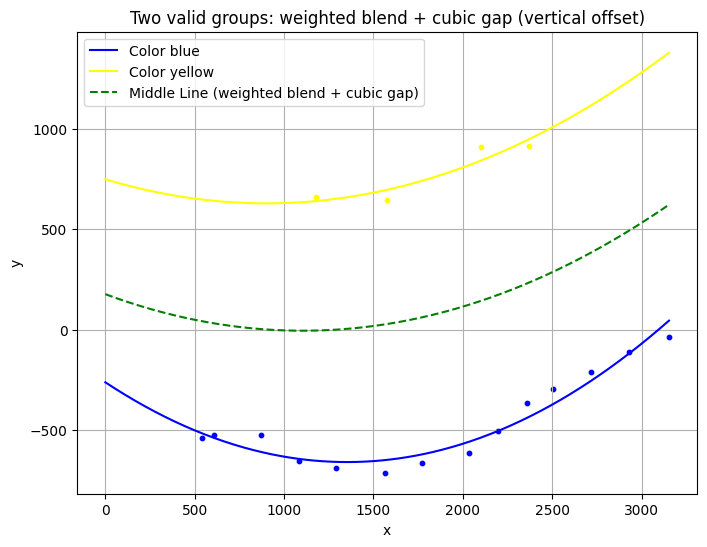

{'x_list': [np.float64(438.88153076171875), np.float64(506.93927001953125), np.float64(1077.8428955078125), np.float64(1671.8785400390625), np.float64(1934.132080078125), np.float64(2257.999267578125), np.float64(2828.150390625), np.float64(2095.112060546875), np.float64(1467.3544921875), np.float64(2615.638916015625), np.float64(1474.114990234375), np.float64(3053.3359375), np.float64(2405.722412109375), np.float64(2271.7109375), np.float64(773.633544921875), np.float64(1191.3092041015625), np.float64(2004.4443359375), np.float64(982.529052734375)], 'y_list': [np.float64(-541.4725952148438), np.float64(-524.13720703125), np.float64(659.8695678710938), np.float64(-666.3129272460938), np.float64(-612.7921752929688), np.float64(-363.8752746582031), np.float64(-110.74010467529297), np.float64(-503.4528503417969), np.float64(-712.7474975585938), np.float64(-208.49070739746094), np.float64(646.1383056640625), np.float64(-35.71368408203125), np.float64(-297.614013671875), np.float64(916.2562

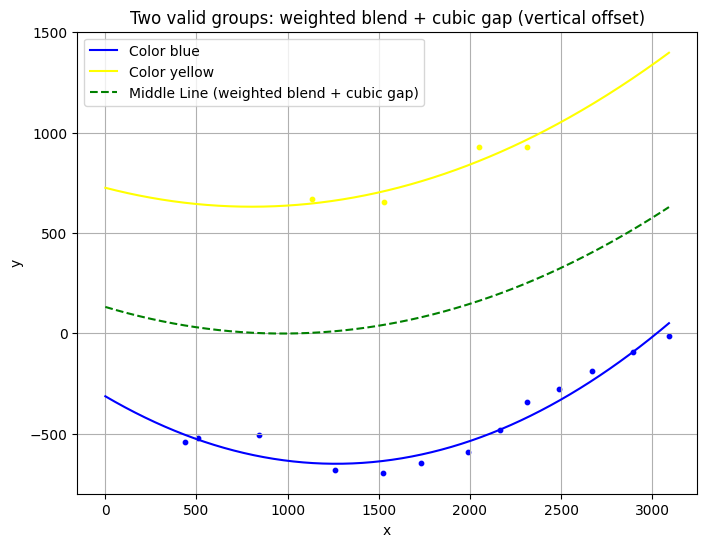

{'x_list': [np.float64(338.88153076171875), np.float64(406.93927001953125), np.float64(2064.153564453125), np.float64(1034.861328125), np.float64(1631.9320068359375), np.float64(1425.3834228515625), np.float64(1890.4205322265625), np.float64(2570.406494140625), np.float64(1427.0557861328125), np.float64(2212.680908203125), np.float64(2390.593994140625), np.float64(2792.44287109375), np.float64(2212.680908203125), np.float64(2992.015869140625), np.float64(1160.9974365234375), np.float64(742.4494018554688), np.float64(1951.6826171875)], 'y_list': [np.float64(-541.4725952148438), np.float64(-524.13720703125), np.float64(-484.46392822265625), np.float64(667.3341064453125), np.float64(-647.2057495117188), np.float64(-694.9288330078125), np.float64(-592.8375854492188), np.float64(-189.96641540527344), np.float64(653.2627563476562), np.float64(-343.9095153808594), np.float64(-279.5498962402344), np.float64(-93.0471420288086), np.float64(928.1148681640625), np.float64(-14.60682201385498), np.f

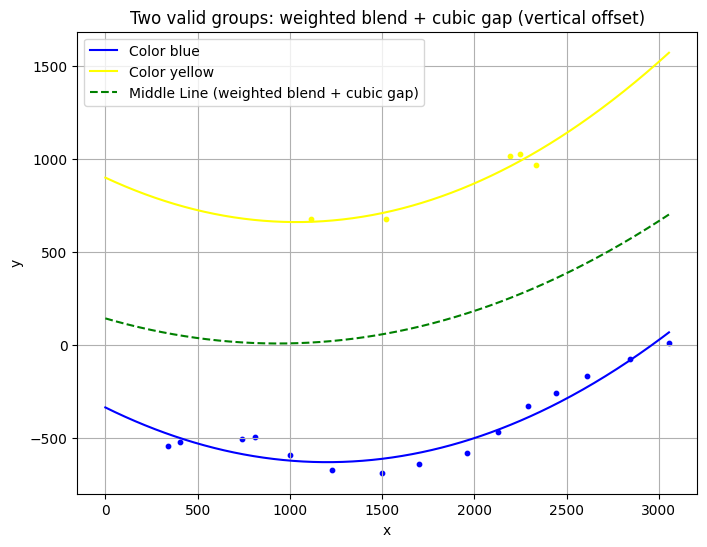

{'x_list': [np.float64(238.88153076171875), np.float64(306.93927001953125), np.float64(642.4494018554688), np.float64(1016.9351806640625), np.float64(1600.7333984375), np.float64(1418.96435546875), np.float64(2512.914794921875), np.float64(1857.541259765625), np.float64(2341.126708984375), np.float64(1400.2694091796875), np.float64(2025.634765625), np.float64(2954.537109375), np.float64(2742.410888671875), np.float64(2189.0087890625), np.float64(1127.0087890625), np.float64(710.208740234375), np.float64(2231.794189453125), np.float64(2148.25048828125), np.float64(2095.5966796875), np.float64(901.6566162109375)], 'y_list': [np.float64(-541.4725952148438), np.float64(-524.13720703125), np.float64(-507.125732421875), np.float64(677.3863525390625), np.float64(-637.6561279296875), np.float64(679.4129638671875), np.float64(-168.64794921875), np.float64(-581.58251953125), np.float64(-260.1582336425781), np.float64(-687.1679077148438), np.float64(-468.0425720214844), np.float64(8.6578626632690

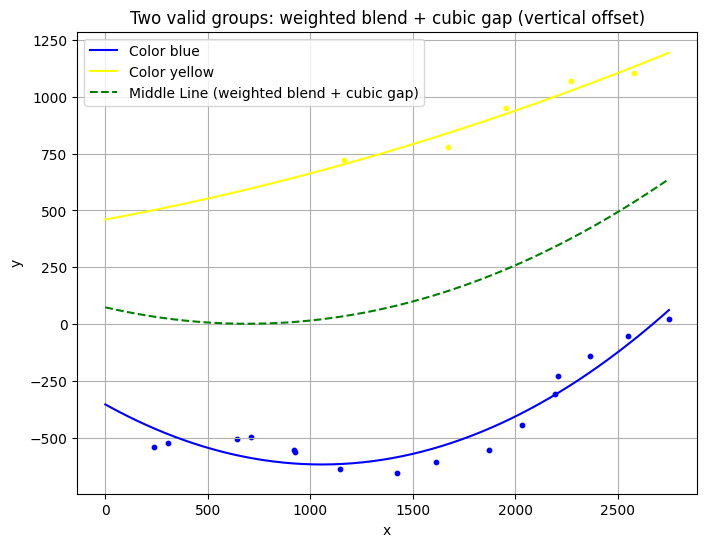

{'x_list': [np.float64(138.88153076171875), np.float64(206.93927001953125), np.float64(542.4494018554688), np.float64(610.208740234375), np.float64(1571.2677001953125), np.float64(1512.7081298828125), np.float64(2263.047607421875), np.float64(1934.8631591796875), np.float64(2450.218994140625), np.float64(2095.112060546875), np.float64(1772.5986328125), np.float64(1322.0435791015625), np.float64(2111.139404296875), np.float64(1062.9412841796875), np.float64(2650.191650390625), np.float64(1046.846923828125), np.float64(2480.891357421875), np.float64(827.5127563476562), np.float64(1853.2401123046875), np.float64(822.3655395507812), np.float64(2172.6435546875)], 'y_list': [np.float64(-541.4725952148438), np.float64(-524.13720703125), np.float64(-507.125732421875), np.float64(-497.1043395996094), np.float64(777.2738647460938), np.float64(-606.1928100585938), np.float64(-141.50704956054688), np.float64(-444.9573669433594), np.float64(-50.76056671142578), np.float64(-308.3648376464844), np.fl

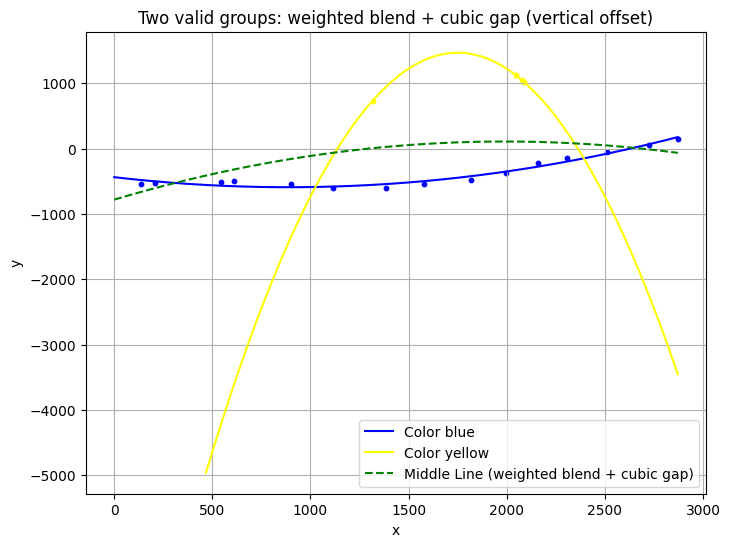

{'x_list': [np.float64(38.88153076171875), np.float64(106.93927001953125), np.float64(442.44940185546875), np.float64(510.208740234375), np.float64(1015.57275390625), np.float64(1476.315673828125), np.float64(2412.93603515625), np.float64(1897.0078125), np.float64(2061.05126953125), np.float64(1718.963134765625), np.float64(1283.933349609375), np.float64(2208.5517578125), np.float64(1216.4251708984375), np.float64(2625.55029296875), np.float64(798.9182739257812), np.float64(2771.83740234375), np.float64(1978.92626953125), np.float64(1987.882568359375), np.float64(1945.389892578125)], 'y_list': [np.float64(-541.4725952148438), np.float64(-524.13720703125), np.float64(-507.125732421875), np.float64(-497.1043395996094), np.float64(-607.7738647460938), np.float64(-548.3778686523438), np.float64(-50.25041580200195), np.float64(-366.7373046875), np.float64(-221.5283660888672), np.float64(-477.9396057128906), np.float64(-606.79248046875), np.float64(-145.50018310546875), np.float64(731.789978

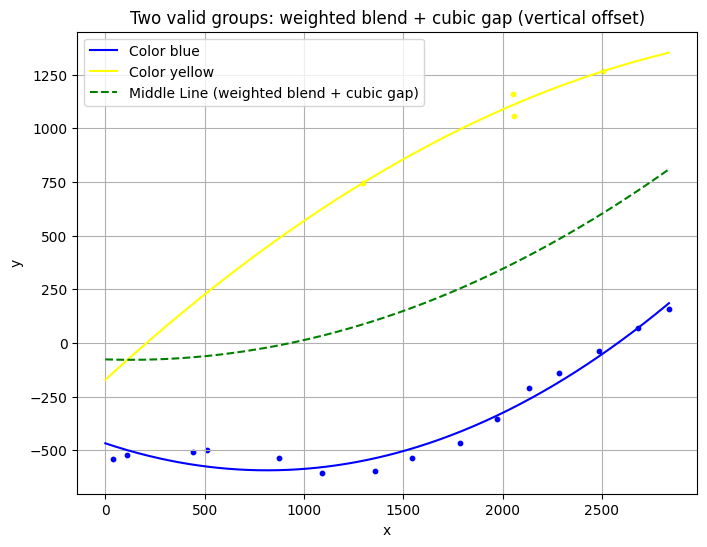

{'x_list': [np.float64(-61.11846923828125), np.float64(6.93927001953125), np.float64(342.44940185546875), np.float64(410.208740234375), np.float64(1872.428466796875), np.float64(1445.256591796875), np.float64(1685.364501953125), np.float64(2386.156494140625), np.float64(2580.87109375), np.float64(2032.460693359375), np.float64(772.9642333984375), np.float64(1255.2984619140625), np.float64(2185.73583984375), np.float64(1195.8541259765625), np.float64(990.9083251953125), np.float64(2737.371826171875), np.float64(1955.75244140625), np.float64(2403.97216796875), np.float64(1950.1962890625)], 'y_list': [np.float64(-541.4725952148438), np.float64(-524.13720703125), np.float64(-507.125732421875), np.float64(-497.1043395996094), np.float64(-356.6625671386719), np.float64(-537.9656372070312), np.float64(-467.55596923828125), np.float64(-35.536006927490234), np.float64(71.300048828125), np.float64(-212.54495239257812), np.float64(-537.8270874023438), np.float64(-597.5623779296875), np.float64(-1

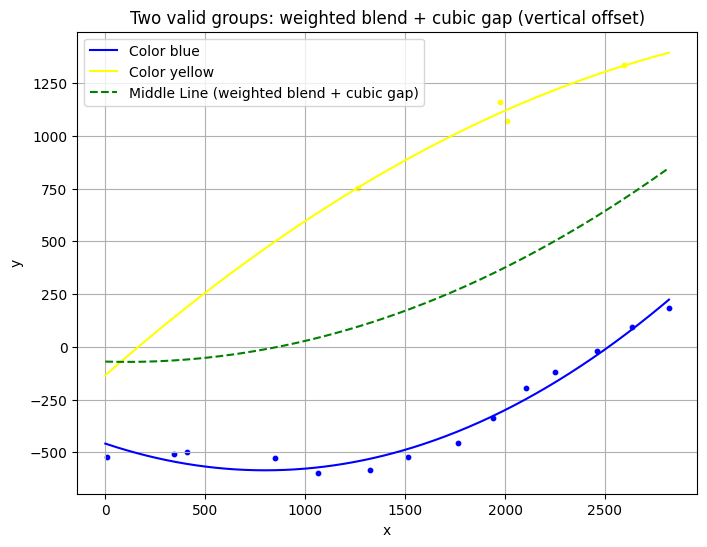

{'x_list': [np.float64(-93.06072998046875), np.float64(242.44940185546875), np.float64(310.208740234375), np.float64(2535.724853515625), np.float64(1839.389892578125), np.float64(2003.085693359375), np.float64(750.469970703125), np.float64(966.0390625), np.float64(2359.90478515625), np.float64(1226.7847900390625), np.float64(2720.42919921875), np.float64(1663.609619140625), np.float64(1413.6929931640625), np.float64(2152.286376953125), np.float64(1161.966064453125), np.float64(1911.0682373046875), np.float64(1876.1488037109375), np.float64(2493.404541015625)], 'y_list': [np.float64(-524.13720703125), np.float64(-507.125732421875), np.float64(-497.1043395996094), np.float64(95.23648834228516), np.float64(-337.9961853027344), np.float64(-195.71905517578125), np.float64(-528.6062622070312), np.float64(-597.1007690429688), np.float64(-18.765811920166016), np.float64(-586.0707397460938), np.float64(181.9123992919922), np.float64(-453.9947204589844), np.float64(-523.5049438476562), np.float6

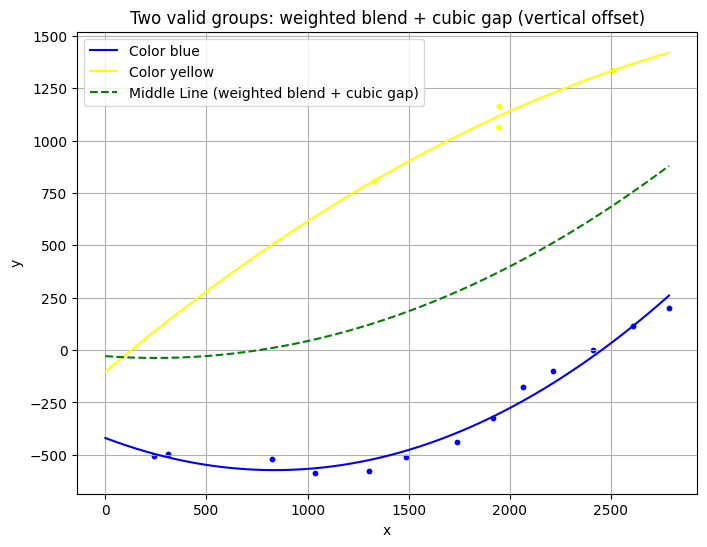

{'x_list': [np.float64(142.44940185546875), np.float64(210.208740234375), np.float64(1636.7913818359375), np.float64(1388.911376953125), np.float64(2310.64697265625), np.float64(1815.4560546875), np.float64(1967.291015625), np.float64(1227.9281005859375), np.float64(2111.452880859375), np.float64(724.3834838867188), np.float64(2507.340576171875), np.float64(1203.3409423828125), np.float64(935.314453125), np.float64(2687.109130859375), np.float64(1840.08935546875), np.float64(2411.212890625), np.float64(1847.6126708984375)], 'y_list': [np.float64(-507.125732421875), np.float64(-497.1043395996094), np.float64(-440.8473815917969), np.float64(-512.5878295898438), np.float64(2.300398349761963), np.float64(-324.837646484375), np.float64(-178.5684356689453), np.float64(808.5868530273438), np.float64(-99.46922302246094), np.float64(-518.7748413085938), np.float64(114.08538055419922), np.float64(-576.56689453125), np.float64(-585.5897827148438), np.float64(201.05479431152344), np.float64(1066.2

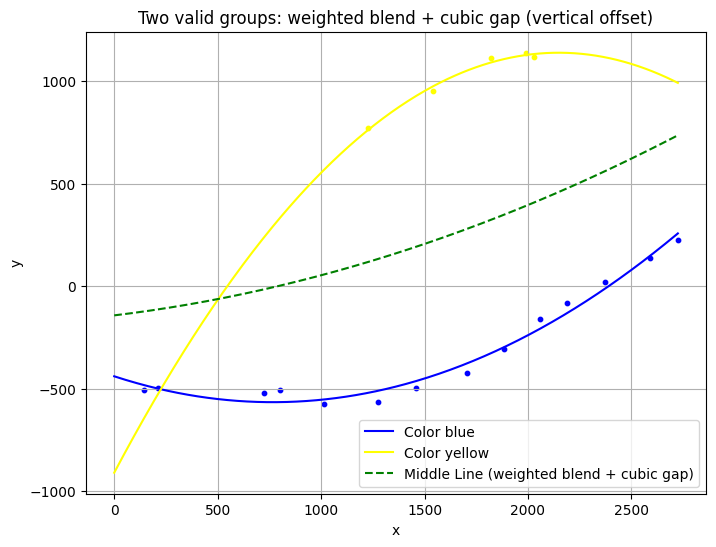

{'x_list': [np.float64(42.44940185546875), np.float64(110.208740234375), np.float64(624.3834838867188), np.float64(913.405029296875), np.float64(700.1944580078125), np.float64(1604.780517578125), np.float64(2089.611328125), np.float64(2491.058349609375), np.float64(1784.169921875), np.float64(2274.51025390625), np.float64(1176.775146484375), np.float64(1956.492431640625), np.float64(1359.94140625), np.float64(2624.580810546875), np.float64(1129.03369140625), np.float64(1890.534423828125), np.float64(1928.013671875), np.float64(1722.6844482421875), np.float64(1439.1923828125)], 'y_list': [np.float64(-507.125732421875), np.float64(-497.1043395996094), np.float64(-518.7748413085938), np.float64(-576.3237915039062), np.float64(-507.76171875), np.float64(-421.619873046875), np.float64(-83.90880584716797), np.float64(135.69967651367188), np.float64(-307.1558837890625), np.float64(20.407819747924805), np.float64(-563.335205078125), np.float64(-160.0447235107422), np.float64(-494.7721862792969

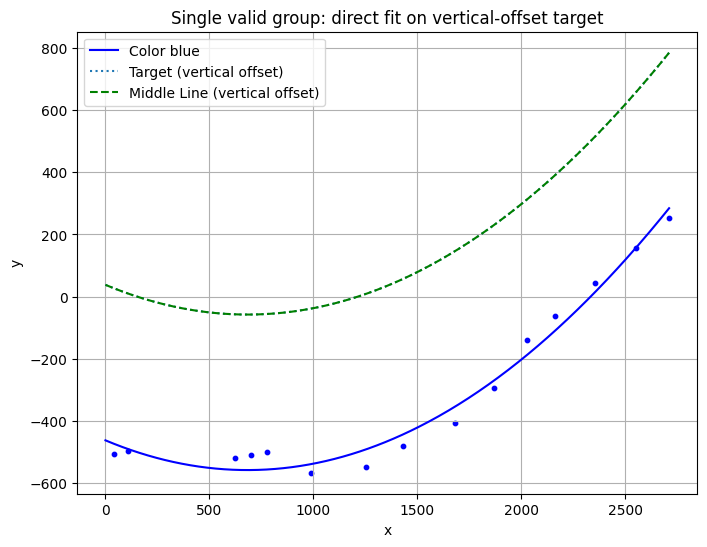

{'x_list': [np.float64(-57.55059814453125), np.float64(10.208740234375), np.float64(524.3834838867188), np.float64(600.1944580078125), np.float64(889.8665771484375), np.float64(1581.4273681640625), np.float64(678.1810302734375), np.float64(1930.476806640625), np.float64(1769.22021484375), np.float64(1152.10693359375), np.float64(2453.21923828125), np.float64(2252.95068359375), np.float64(1329.3592529296875), np.float64(2611.781982421875), np.float64(2061.82666015625)], 'y_list': [np.float64(-507.125732421875), np.float64(-497.1043395996094), np.float64(-518.7748413085938), np.float64(-507.76171875), np.float64(-566.2169799804688), np.float64(-407.6904602050781), np.float64(-498.9352111816406), np.float64(-140.5128631591797), np.float64(-292.202880859375), np.float64(-549.3458862304688), np.float64(157.9176483154297), np.float64(42.676727294921875), np.float64(-478.9835510253906), np.float64(252.2480010986328), np.float64(-62.11075973510742)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

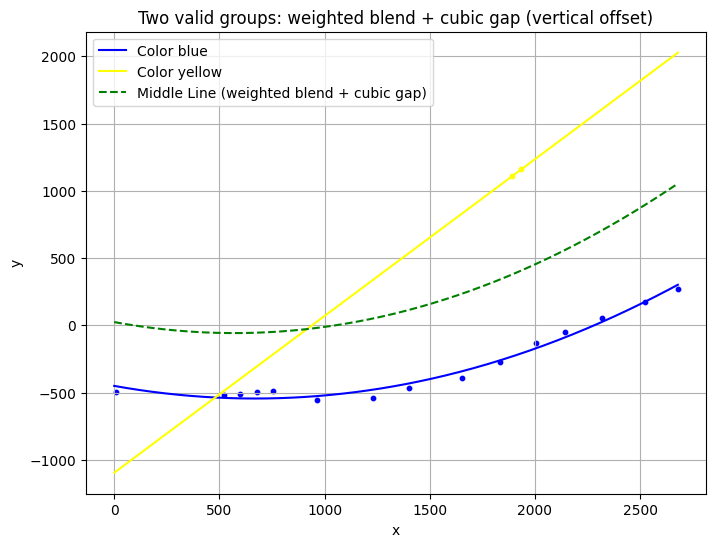

{'x_list': [np.float64(-89.791259765625), np.float64(424.38348388671875), np.float64(500.1944580078125), np.float64(578.1810302734375), np.float64(865.310546875), np.float64(2218.45947265625), np.float64(1733.150146484375), np.float64(1302.5103759765625), np.float64(2041.652587890625), np.float64(2425.62744140625), np.float64(1905.0928955078125), np.float64(1551.3187255859375), np.float64(1128.3221435546875), np.float64(656.527587890625), np.float64(2579.917236328125), np.float64(1835.8922119140625), np.float64(1793.7017822265625)], 'y_list': [np.float64(-497.1043395996094), np.float64(-518.7748413085938), np.float64(-507.76171875), np.float64(-498.9352111816406), np.float64(-557.3388061523438), np.float64(57.58485794067383), np.float64(-276.1504211425781), np.float64(-467.9249572753906), np.float64(-47.20774459838867), np.float64(175.56222534179688), np.float64(-129.1669158935547), np.float64(-394.4137878417969), np.float64(-540.7289428710938), np.float64(-491.2867736816406), np.float

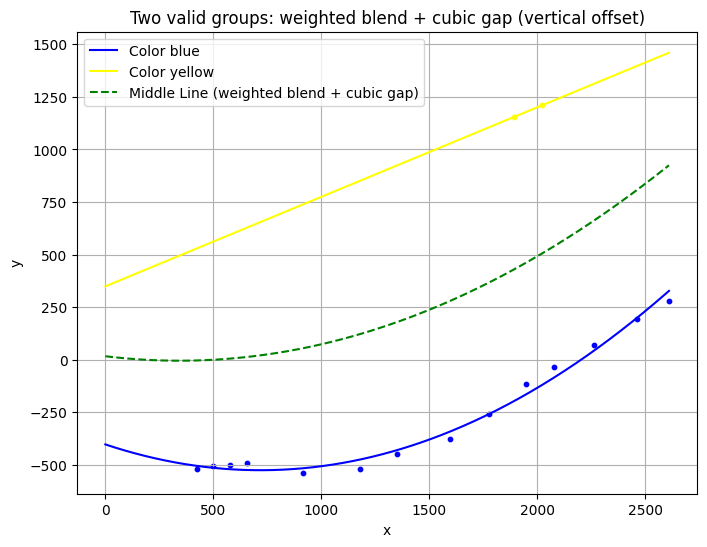

{'x_list': [np.float64(324.38348388671875), np.float64(400.1944580078125), np.float64(478.1810302734375), np.float64(556.527587890625), np.float64(817.5294189453125), np.float64(1848.4298095703125), np.float64(1678.9190673828125), np.float64(1496.3677978515625), np.float64(2164.95654296875), np.float64(1077.8428955078125), np.float64(1977.43359375), np.float64(1250.2325439453125), np.float64(2361.662353515625), np.float64(2510.127685546875), np.float64(1924.373291015625), np.float64(1790.4305419921875)], 'y_list': [np.float64(-518.7748413085938), np.float64(-507.76171875), np.float64(-498.9352111816406), np.float64(-491.2867736816406), np.float64(-537.6854858398438), np.float64(-114.35877990722656), np.float64(-259.57958984375), np.float64(-376.91314697265625), np.float64(71.4273681640625), np.float64(-520.6417846679688), np.float64(-33.87071990966797), np.float64(-450.9806213378906), np.float64(192.3495635986328), np.float64(280.25323486328125), np.float64(1210.8638916015625), np.floa

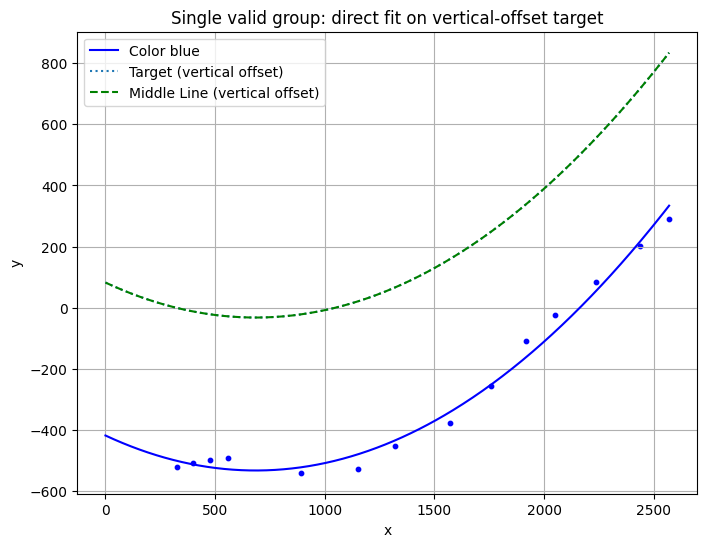

{'x_list': [np.float64(224.38348388671875), np.float64(300.1944580078125), np.float64(378.1810302734375), np.float64(456.527587890625), np.float64(1049.3590087890625), np.float64(1659.2222900390625), np.float64(1951.68017578125), np.float64(1469.0697021484375), np.float64(792.38427734375), np.float64(1221.971435546875), np.float64(1817.5302734375), np.float64(2338.516357421875), np.float64(2134.486328125), np.float64(2469.971923828125)], 'y_list': [np.float64(-518.7748413085938), np.float64(-507.76171875), np.float64(-498.9352111816406), np.float64(-491.2867736816406), np.float64(-525.4032592773438), np.float64(-256.79840087890625), np.float64(-23.612354278564453), np.float64(-375.4515686035156), np.float64(-539.0057983398438), np.float64(-451.4626159667969), np.float64(-107.04876708984375), np.float64(202.08718872070312), np.float64(83.27854919433594), np.float64(290.5933837890625)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


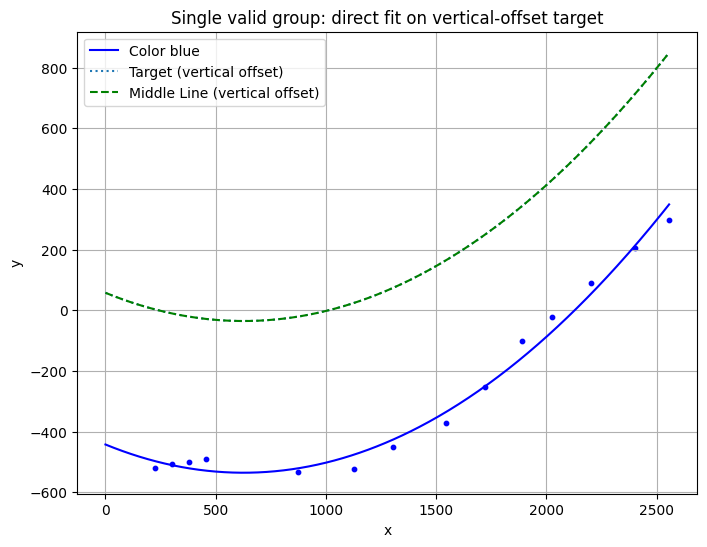

{'x_list': [np.float64(124.38348388671875), np.float64(200.1944580078125), np.float64(278.1810302734375), np.float64(356.527587890625), np.float64(2104.03564453125), np.float64(771.3294067382812), np.float64(1621.0679931640625), np.float64(1787.5740966796875), np.float64(1025.9901123046875), np.float64(2302.48779296875), np.float64(1202.712646484375), np.float64(2455.949462890625), np.float64(1443.195556640625), np.float64(1925.8294677734375)], 'y_list': [np.float64(-518.7748413085938), np.float64(-507.76171875), np.float64(-498.9352111816406), np.float64(-491.2867736816406), np.float64(88.49409484863281), np.float64(-533.2529907226562), np.float64(-251.4110107421875), np.float64(-101.77946472167969), np.float64(-522.2283935546875), np.float64(206.0404815673828), np.float64(-451.7957458496094), np.float64(298.82879638671875), np.float64(-371.03173828125), np.float64(-21.379621505737305)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


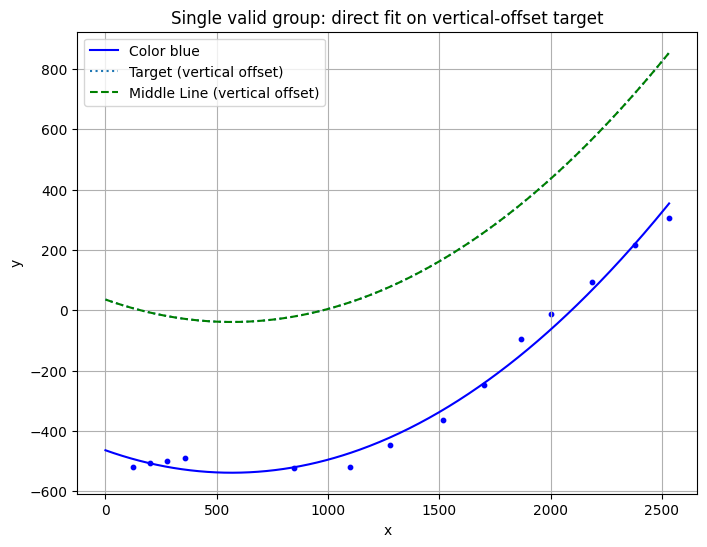

{'x_list': [np.float64(24.38348388671875), np.float64(100.1944580078125), np.float64(178.1810302734375), np.float64(256.527587890625), np.float64(2084.701904296875), np.float64(1000.9383544921875), np.float64(1901.3236083984375), np.float64(745.5730590820312), np.float64(1602.5850830078125), np.float64(1765.5322265625), np.float64(2432.834716796875), np.float64(1178.116455078125), np.float64(1418.6788330078125), np.float64(2280.456298828125)], 'y_list': [np.float64(-518.7748413085938), np.float64(-507.76171875), np.float64(-498.9352111816406), np.float64(-491.2867736816406), np.float64(93.98339080810547), np.float64(-519.0718994140625), np.float64(-11.520544052124023), np.float64(-523.8873901367188), np.float64(-247.1535186767578), np.float64(-95.23649597167969), np.float64(305.4301452636719), np.float64(-445.9486999511719), np.float64(-365.2703552246094), np.float64(215.41587829589844)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


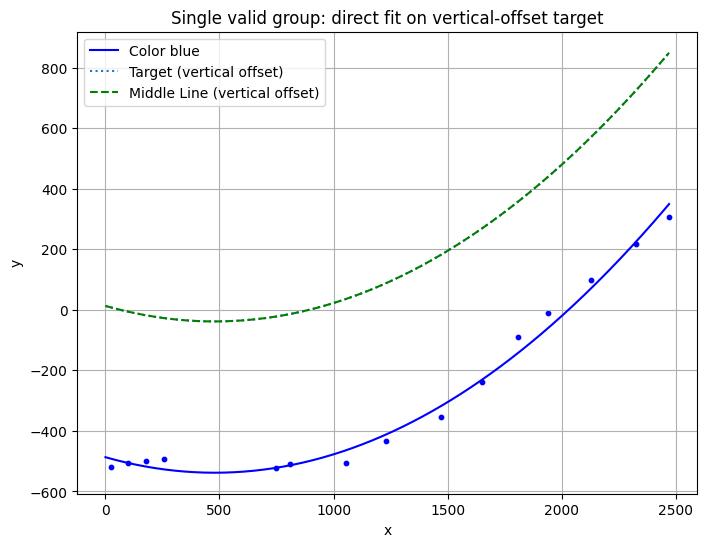

{'x_list': [np.float64(-75.61651611328125), np.float64(0.1944580078125), np.float64(78.1810302734375), np.float64(156.527587890625), np.float64(645.5730590820312), np.float64(953.47607421875), np.float64(707.8305053710938), np.float64(2029.4462890625), np.float64(1551.1646728515625), np.float64(1710.8646240234375), np.float64(1131.104248046875), np.float64(1838.7821044921875), np.float64(2225.9267578125), np.float64(2371.328369140625), np.float64(1372.3983154296875)], 'y_list': [np.float64(-518.7748413085938), np.float64(-507.76171875), np.float64(-498.9352111816406), np.float64(-491.2867736816406), np.float64(-523.8873901367188), np.float64(-504.62701416015625), np.float64(-507.81695556640625), np.float64(97.67845916748047), np.float64(-239.6891326904297), np.float64(-90.70143127441406), np.float64(-434.88092041015625), np.float64(-9.300437927246094), np.float64(217.0506134033203), np.float64(307.2901306152344), np.float64(-355.70257568359375)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1

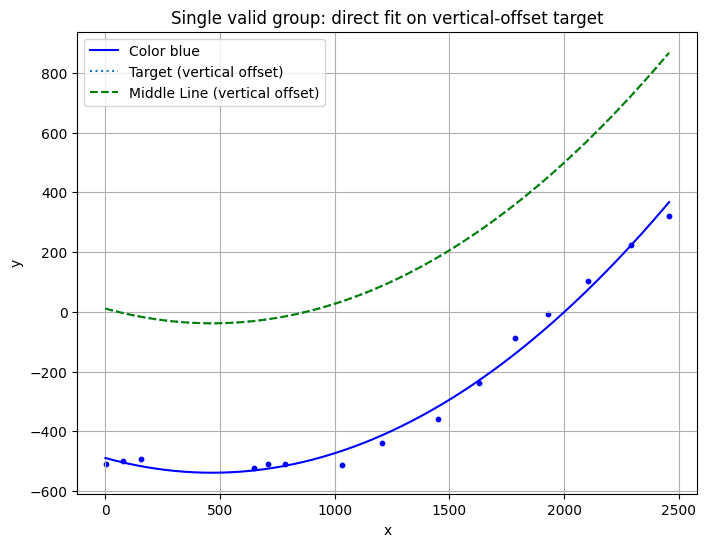

{'x_list': [np.float64(-99.8055419921875), np.float64(-21.8189697265625), np.float64(56.527587890625), np.float64(545.5730590820312), np.float64(607.8305053710938), np.float64(1348.9647216796875), np.float64(929.4267578125), np.float64(2001.738525390625), np.float64(1528.1136474609375), np.float64(2193.10009765625), np.float64(1107.2706298828125), np.float64(682.9164428710938), np.float64(1684.0709228515625), np.float64(1830.544189453125), np.float64(2357.46533203125)], 'y_list': [np.float64(-507.76171875), np.float64(-498.9352111816406), np.float64(-491.2867736816406), np.float64(-523.8873901367188), np.float64(-507.81695556640625), np.float64(-357.4900817871094), np.float64(-512.3351440429688), np.float64(104.4788589477539), np.float64(-238.0912322998047), np.float64(222.8009796142578), np.float64(-437.9924011230469), np.float64(-510.546142578125), np.float64(-87.6725845336914), np.float64(-5.5585503578186035), np.float64(319.7892150878906)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

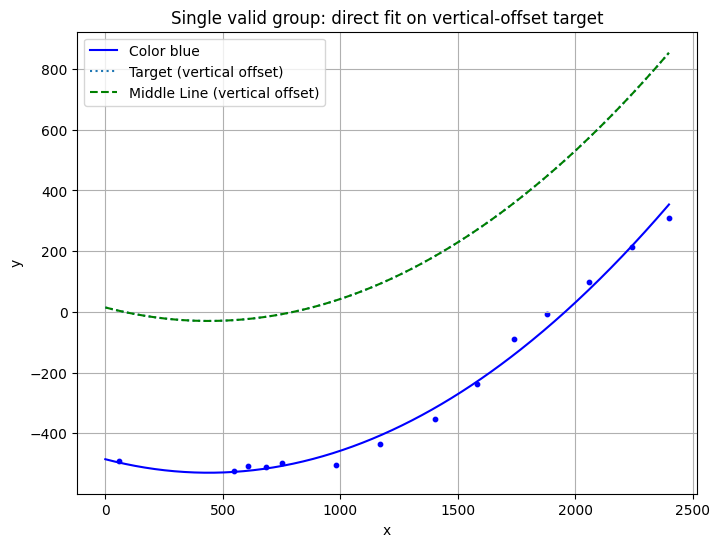

{'x_list': [np.float64(-43.472412109375), np.float64(445.57305908203125), np.float64(507.83050537109375), np.float64(582.9164428710938), np.float64(882.7257690429688), np.float64(1957.5771484375), np.float64(1479.8507080078125), np.float64(1067.4451904296875), np.float64(1638.8411865234375), np.float64(1301.626220703125), np.float64(1778.6798095703125), np.float64(2140.885498046875), np.float64(2298.674072265625), np.float64(650.030029296875)], 'y_list': [np.float64(-491.2867736816406), np.float64(-523.8873901367188), np.float64(-507.81695556640625), np.float64(-510.546142578125), np.float64(-502.8565368652344), np.float64(98.38481140136719), np.float64(-238.85679626464844), np.float64(-435.73004150390625), np.float64(-88.86504364013672), np.float64(-354.4001770019531), np.float64(-7.214885711669922), np.float64(213.5347442626953), np.float64(309.8603210449219), np.float64(-499.0834045410156)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


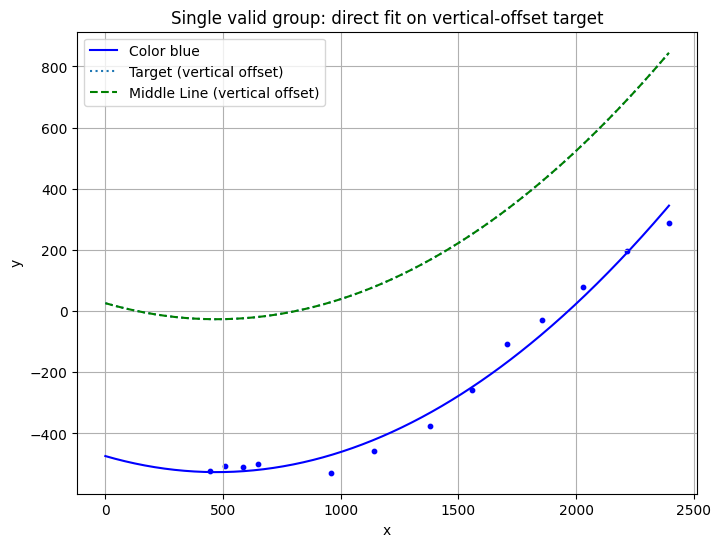

{'x_list': [np.float64(345.57305908203125), np.float64(407.83050537109375), np.float64(482.91644287109375), np.float64(550.030029296875), np.float64(857.313232421875), np.float64(1928.7418212890625), np.float64(1040.536376953125), np.float64(2116.209716796875), np.float64(1277.73046875), np.float64(1455.8250732421875), np.float64(1604.436767578125), np.float64(2294.406494140625), np.float64(1752.894287109375)], 'y_list': [np.float64(-523.8873901367188), np.float64(-507.81695556640625), np.float64(-510.546142578125), np.float64(-499.0834045410156), np.float64(-528.4464111328125), np.float64(77.74407196044922), np.float64(-456.9084167480469), np.float64(196.8220672607422), np.float64(-375.0105285644531), np.float64(-258.4990539550781), np.float64(-108.74755859375), np.float64(289.3548889160156), np.float64(-28.5352783203125)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


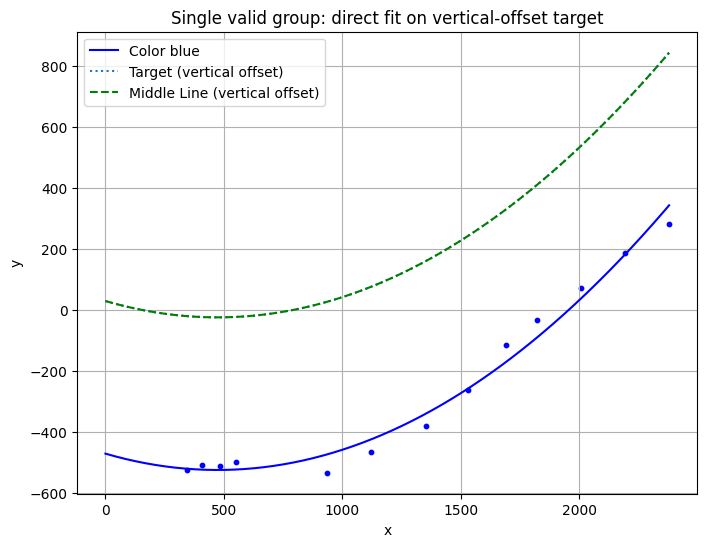

{'x_list': [np.float64(245.57305908203125), np.float64(307.83050537109375), np.float64(382.91644287109375), np.float64(450.030029296875), np.float64(837.6235961914062), np.float64(1021.9600830078125), np.float64(2280.456298828125), np.float64(2094.326171875), np.float64(1252.7169189453125), np.float64(1908.703857421875), np.float64(1590.883544921875), np.float64(1429.2855224609375), np.float64(1723.5706787109375)], 'y_list': [np.float64(-523.8873901367188), np.float64(-507.81695556640625), np.float64(-510.546142578125), np.float64(-499.0834045410156), np.float64(-534.1607666015625), np.float64(-466.1222839355469), np.float64(281.1744079589844), np.float64(186.6970977783203), np.float64(-382.0071105957031), np.float64(71.33097839355469), np.float64(-114.54560852050781), np.float64(-263.388427734375), np.float64(-33.3854866027832)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


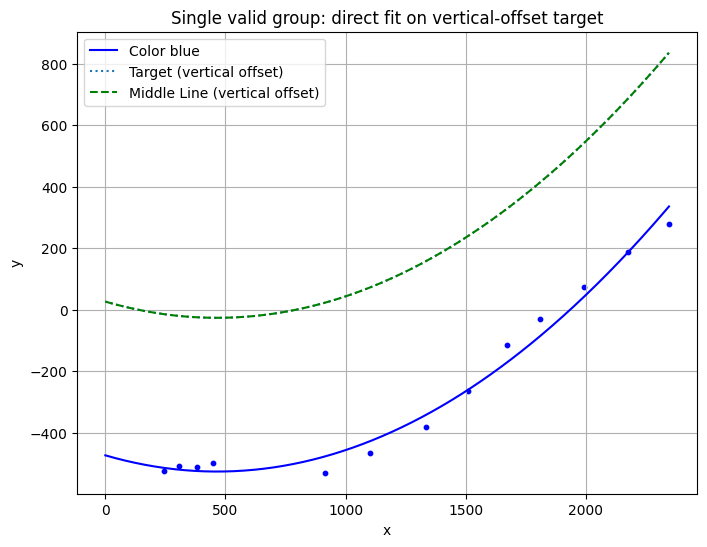

{'x_list': [np.float64(145.57305908203125), np.float64(207.83050537109375), np.float64(282.91644287109375), np.float64(350.030029296875), np.float64(814.3438110351562), np.float64(1001.350341796875), np.float64(2246.09130859375), np.float64(1571.809326171875), np.float64(1235.84521484375), np.float64(1408.7537841796875), np.float64(2074.3828125), np.float64(1891.853271484375), np.float64(1708.9044189453125)], 'y_list': [np.float64(-523.8873901367188), np.float64(-507.81695556640625), np.float64(-510.546142578125), np.float64(-499.0834045410156), np.float64(-530.125), np.float64(-465.1851501464844), np.float64(279.4497985839844), np.float64(-114.99645233154297), np.float64(-380.4212341308594), np.float64(-263.0761413574219), np.float64(187.14593505859375), np.float64(72.67041778564453), np.float64(-31.39664649963379)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


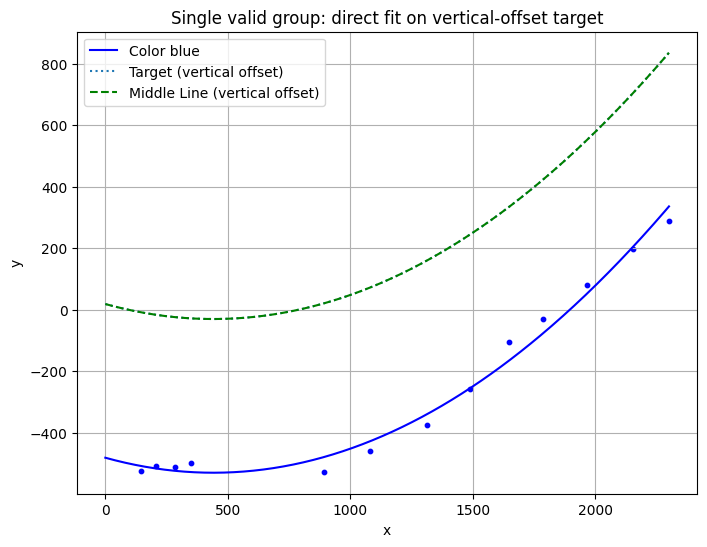

{'x_list': [np.float64(45.57305908203125), np.float64(107.83050537109375), np.float64(182.91644287109375), np.float64(250.030029296875), np.float64(794.435546875), np.float64(981.3963623046875), np.float64(1388.178955078125), np.float64(1548.1717529296875), np.float64(1866.01708984375), np.float64(2054.78466796875), np.float64(1212.1905517578125), np.float64(2201.201416015625), np.float64(1687.303466796875)], 'y_list': [np.float64(-523.8873901367188), np.float64(-507.81695556640625), np.float64(-510.546142578125), np.float64(-499.0834045410156), np.float64(-528.1793823242188), np.float64(-461.0312194824219), np.float64(-256.9643249511719), np.float64(-107.0611572265625), np.float64(79.3637466430664), np.float64(197.89401245117188), np.float64(-375.5260314941406), np.float64(287.4649963378906), np.float64(-29.330078125)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


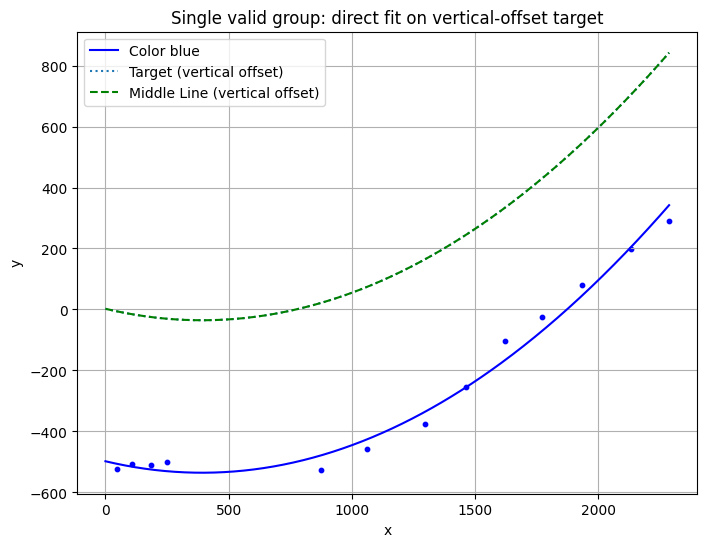

{'x_list': [np.float64(-54.42694091796875), np.float64(7.83050537109375), np.float64(82.91644287109375), np.float64(150.030029296875), np.float64(962.0673828125), np.float64(776.588134765625), np.float64(1523.3883056640625), np.float64(1195.2493896484375), np.float64(1832.5108642578125), np.float64(1363.155517578125), np.float64(1671.8785400390625), np.float64(2033.226318359375), np.float64(2187.372314453125)], 'y_list': [np.float64(-523.8873901367188), np.float64(-507.81695556640625), np.float64(-510.546142578125), np.float64(-499.0834045410156), np.float64(-459.1379089355469), np.float64(-525.5045776367188), np.float64(-104.06636810302734), np.float64(-374.05218505859375), np.float64(79.98377227783203), np.float64(-254.5359649658203), np.float64(-25.69329833984375), np.float64(198.23904418945312), np.float64(290.5149841308594)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


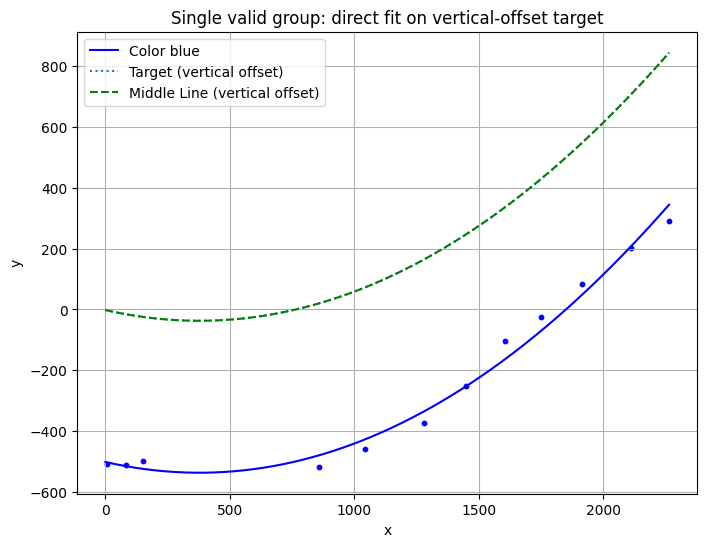

{'x_list': [np.float64(-92.16949462890625), np.float64(-17.08355712890625), np.float64(50.030029296875), np.float64(1816.1474609375), np.float64(943.727294921875), np.float64(1505.666015625), np.float64(1348.4990234375), np.float64(1179.614013671875), np.float64(1651.05712890625), np.float64(757.41748046875), np.float64(2012.794189453125), np.float64(2164.145751953125)], 'y_list': [np.float64(-507.81695556640625), np.float64(-510.546142578125), np.float64(-499.0834045410156), np.float64(83.0550765991211), np.float64(-458.35186767578125), np.float64(-103.04276275634766), np.float64(-253.6805419921875), np.float64(-372.609619140625), np.float64(-23.724393844604492), np.float64(-520.1919555664062), np.float64(202.63084411621094), np.float64(292.202880859375)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


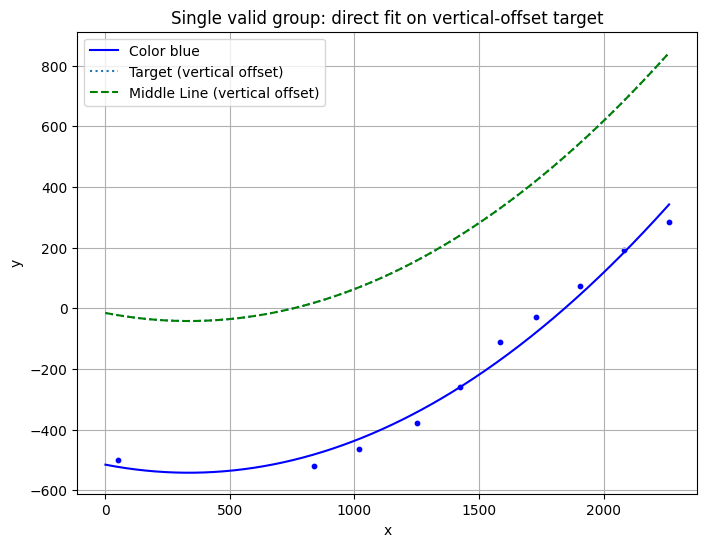

{'x_list': [np.float64(-49.969970703125), np.float64(1806.6829833984375), np.float64(738.0692138671875), np.float64(918.5421142578125), np.float64(1150.7080078125), np.float64(1983.91357421875), np.float64(2163.3349609375), np.float64(1325.16748046875), np.float64(1482.571533203125), np.float64(1630.67578125)], 'y_list': [np.float64(-499.0834045410156), np.float64(71.7031478881836), np.float64(-518.4523315429688), np.float64(-462.8411560058594), np.float64(-378.4722900390625), np.float64(192.07359313964844), np.float64(283.5450134277344), np.float64(-261.1322937011719), np.float64(-112.49617767333984), np.float64(-30.18057632446289)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


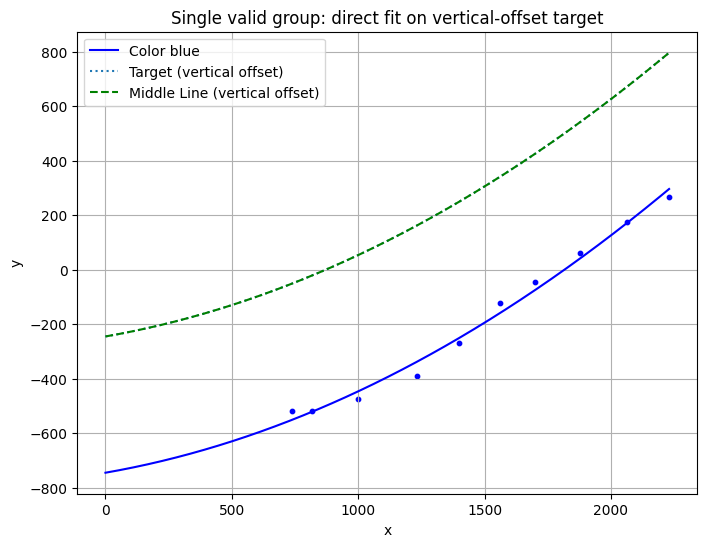

{'x_list': [np.float64(638.0692138671875), np.float64(716.30859375), np.float64(1298.982666015625), np.float64(1776.3275146484375), np.float64(900.75341796875), np.float64(1132.3863525390625), np.float64(2130.486572265625), np.float64(1460.63720703125), np.float64(1965.061279296875), np.float64(1598.8817138671875)], 'y_list': [np.float64(-518.4523315429688), np.float64(-517.6264038085938), np.float64(-270.33990478515625), np.float64(61.5597038269043), np.float64(-474.160400390625), np.float64(-390.71380615234375), np.float64(266.9184265136719), np.float64(-123.22932434082031), np.float64(176.58433532714844), np.float64(-44.48763656616211)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


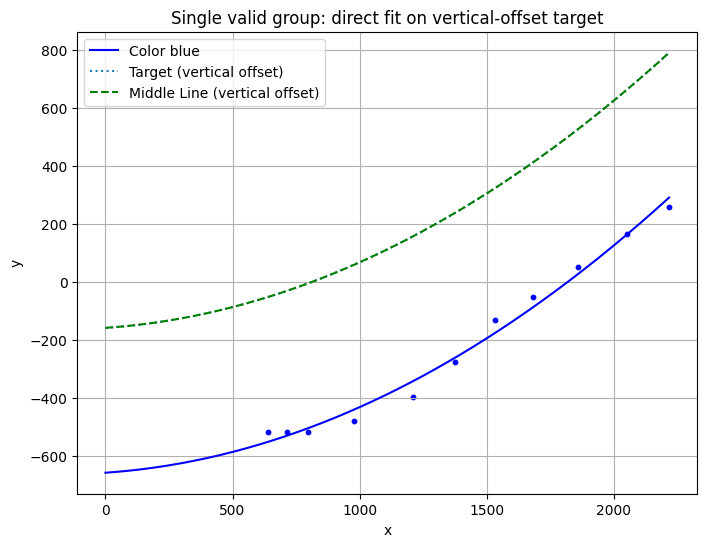

{'x_list': [np.float64(538.0692138671875), np.float64(616.30859375), np.float64(876.9808959960938), np.float64(1275.5633544921875), np.float64(1111.4615478515625), np.float64(1758.8009033203125), np.float64(1953.53173828125), np.float64(1584.140625), np.float64(695.8120727539062), np.float64(1433.2943115234375), np.float64(2118.139892578125)], 'y_list': [np.float64(-518.4523315429688), np.float64(-517.6264038085938), np.float64(-480.14239501953125), np.float64(-277.3221740722656), np.float64(-396.8187255859375), np.float64(50.313621520996094), np.float64(165.97232055664062), np.float64(-52.36370849609375), np.float64(-518.7136840820312), np.float64(-131.77377319335938), np.float64(257.22357177734375)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


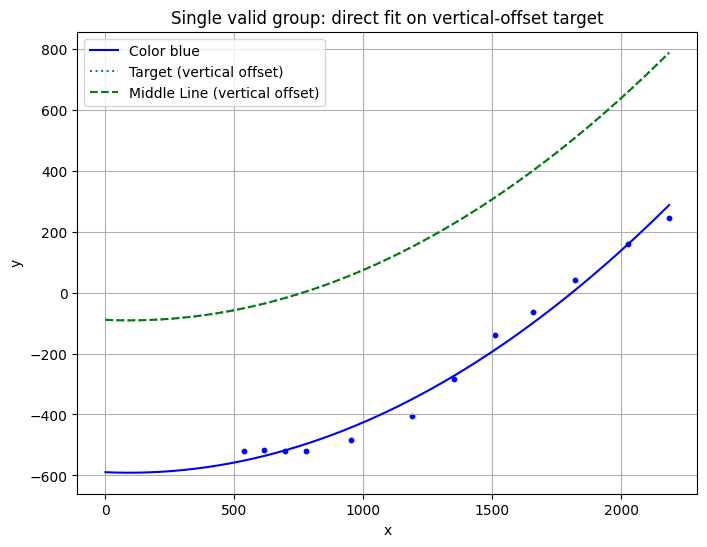

{'x_list': [np.float64(438.0692138671875), np.float64(516.30859375), np.float64(595.8120727539062), np.float64(852.2373657226562), np.float64(1090.7176513671875), np.float64(1250.5162353515625), np.float64(1926.09033203125), np.float64(2086.468017578125), np.float64(1723.057373046875), np.float64(1412.0311279296875), np.float64(1558.885986328125), np.float64(676.697021484375)], 'y_list': [np.float64(-518.4523315429688), np.float64(-517.6264038085938), np.float64(-518.7136840820312), np.float64(-484.89312744140625), np.float64(-405.1104431152344), np.float64(-283.3152770996094), np.float64(160.02854919433594), np.float64(245.43325805664062), np.float64(42.32733154296875), np.float64(-139.00978088378906), np.float64(-62.95293045043945), np.float64(-518.8746948242188)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


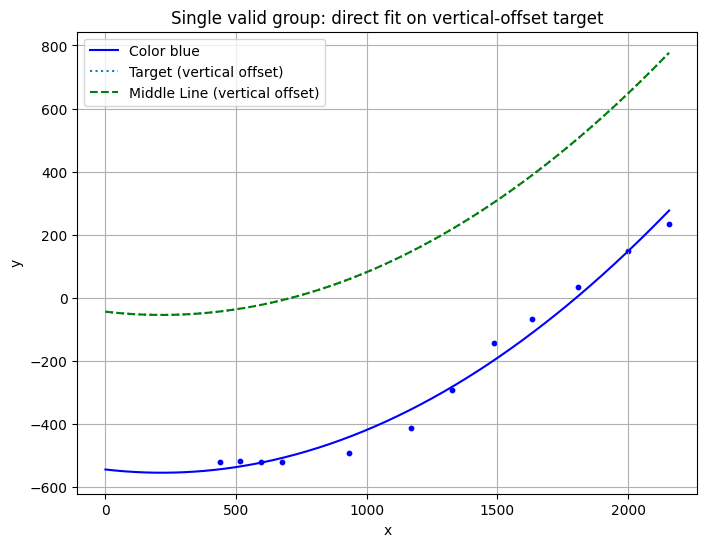

{'x_list': [np.float64(338.0692138671875), np.float64(416.30859375), np.float64(495.81207275390625), np.float64(576.697021484375), np.float64(830.4257202148438), np.float64(1387.8203125), np.float64(1900.759765625), np.float64(1067.7218017578125), np.float64(1707.6849365234375), np.float64(1226.7847900390625), np.float64(2057.17333984375), np.float64(1530.6431884765625)], 'y_list': [np.float64(-518.4523315429688), np.float64(-517.6264038085938), np.float64(-518.7136840820312), np.float64(-518.8746948242188), np.float64(-491.3595886230469), np.float64(-144.1653289794922), np.float64(148.44554138183594), np.float64(-410.98388671875), np.float64(35.01341247558594), np.float64(-290.41900634765625), np.float64(233.95054626464844), np.float64(-68.25282287597656)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


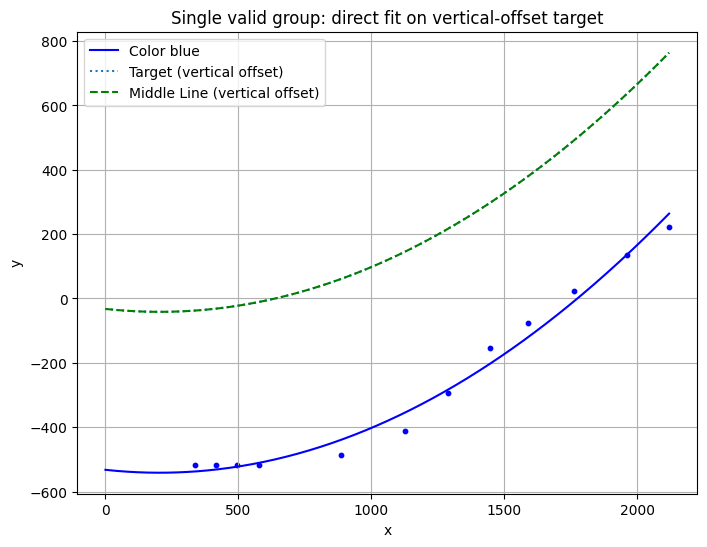

{'x_list': [np.float64(238.0692138671875), np.float64(316.30859375), np.float64(395.81207275390625), np.float64(476.697021484375), np.float64(783.580078125), np.float64(1027.386962890625), np.float64(1661.0521240234375), np.float64(2018.77392578125), np.float64(1185.9630126953125), np.float64(1859.6463623046875), np.float64(1346.3753662109375), np.float64(1487.130615234375)], 'y_list': [np.float64(-518.4523315429688), np.float64(-517.6264038085938), np.float64(-518.7136840820312), np.float64(-518.8746948242188), np.float64(-485.2181701660156), np.float64(-410.8902893066406), np.float64(22.187713623046875), np.float64(221.81150817871094), np.float64(-293.3283996582031), np.float64(134.1625213623047), np.float64(-153.05865478515625), np.float64(-75.75630187988281)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


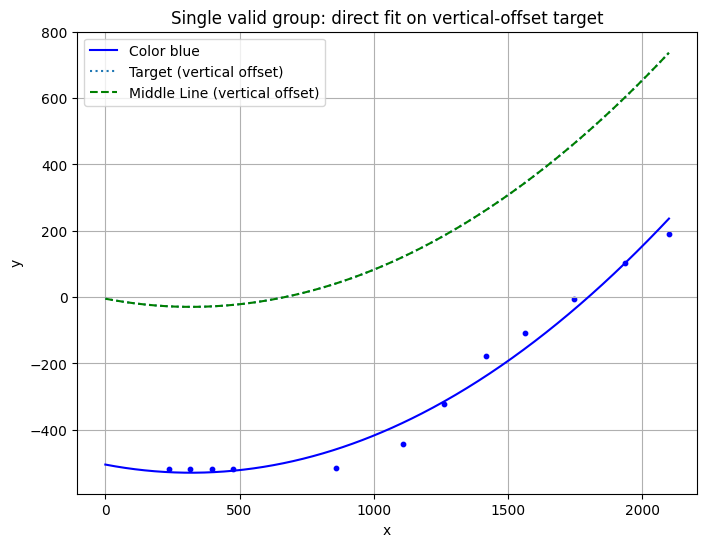

{'x_list': [np.float64(138.0692138671875), np.float64(216.30859375), np.float64(295.81207275390625), np.float64(376.697021484375), np.float64(761.2039794921875), np.float64(1008.708740234375), np.float64(1318.9140625), np.float64(1647.248291015625), np.float64(1160.0634765625), np.float64(1835.192626953125), np.float64(1464.495849609375), np.float64(2000.062255859375)], 'y_list': [np.float64(-518.4523315429688), np.float64(-517.6264038085938), np.float64(-518.7136840820312), np.float64(-518.8746948242188), np.float64(-516.0119018554688), np.float64(-441.77301025390625), np.float64(-178.2203369140625), np.float64(-6.778397560119629), np.float64(-321.61016845703125), np.float64(102.70601654052734), np.float64(-106.83580780029297), np.float64(189.6658935546875)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


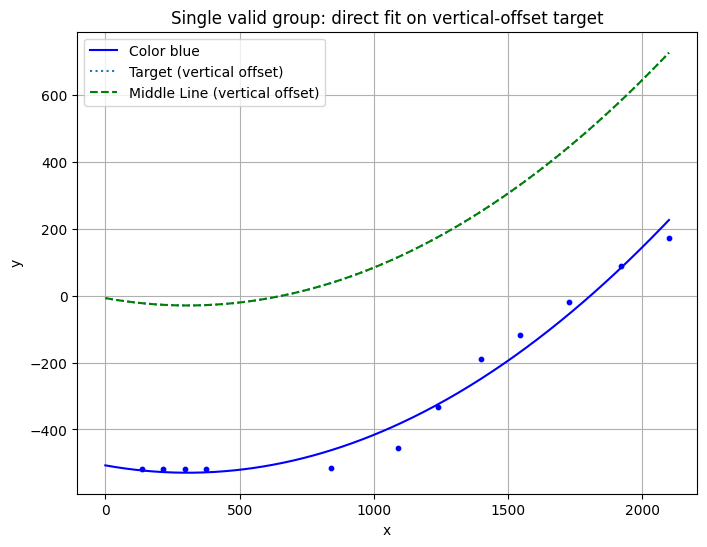

{'x_list': [np.float64(38.0692138671875), np.float64(116.30859375), np.float64(195.81207275390625), np.float64(276.697021484375), np.float64(1628.1634521484375), np.float64(1139.658447265625), np.float64(991.77587890625), np.float64(1819.438720703125), np.float64(1444.127685546875), np.float64(741.674072265625), np.float64(1297.4404296875), np.float64(1999.306396484375)], 'y_list': [np.float64(-518.4523315429688), np.float64(-517.6264038085938), np.float64(-518.7136840820312), np.float64(-518.8746948242188), np.float64(-20.120386123657227), np.float64(-332.59136962890625), np.float64(-456.4783630371094), np.float64(88.93680572509766), np.float64(-117.53871154785156), np.float64(-514.346435546875), np.float64(-189.3751678466797), np.float64(173.5241241455078)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


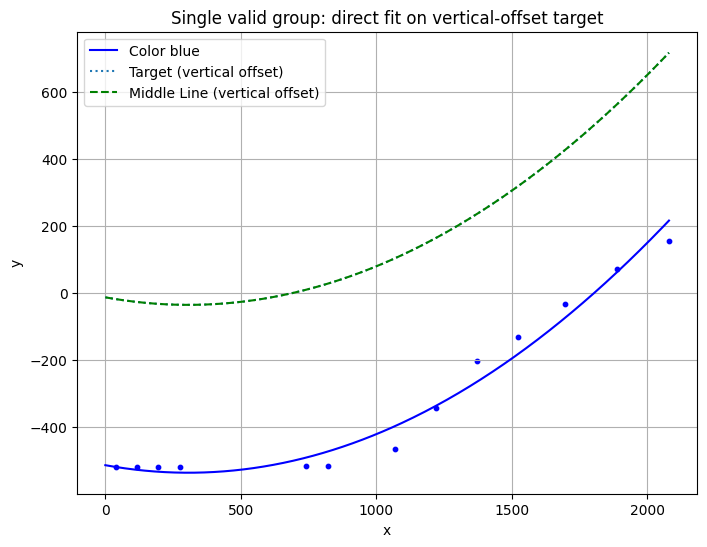

{'x_list': [np.float64(-61.9307861328125), np.float64(16.30859375), np.float64(95.81207275390625), np.float64(176.697021484375), np.float64(641.674072265625), np.float64(722.9114379882812), np.float64(970.04638671875), np.float64(1271.66650390625), np.float64(1980.166259765625), np.float64(1118.5166015625), np.float64(1597.030029296875), np.float64(1788.6551513671875), np.float64(1423.1536865234375)], 'y_list': [np.float64(-518.4523315429688), np.float64(-517.6264038085938), np.float64(-518.7136840820312), np.float64(-518.8746948242188), np.float64(-514.346435546875), np.float64(-514.4471435546875), np.float64(-465.43341064453125), np.float64(-200.99485778808594), np.float64(156.05979919433594), np.float64(-343.23809814453125), np.float64(-32.95380401611328), np.float64(71.15370178222656), np.float64(-129.4621124267578)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


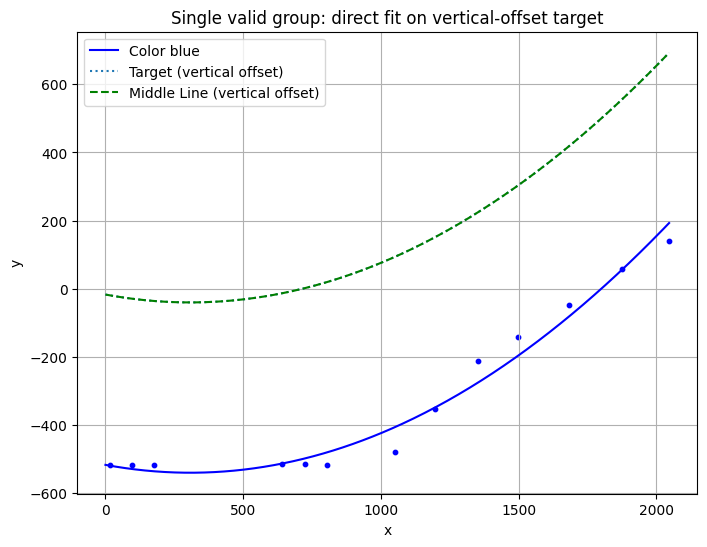

{'x_list': [np.float64(-83.69140625), np.float64(-4.18792724609375), np.float64(76.697021484375), np.float64(541.674072265625), np.float64(622.9114379882812), np.float64(949.4835205078125), np.float64(703.4698486328125), np.float64(1945.7833251953125), np.float64(1096.3560791015625), np.float64(1584.140625), np.float64(1251.5126953125), np.float64(1773.6143798828125), np.float64(1399.1717529296875)], 'y_list': [np.float64(-517.6264038085938), np.float64(-518.7136840820312), np.float64(-518.8746948242188), np.float64(-514.346435546875), np.float64(-514.4471435546875), np.float64(-478.2940979003906), np.float64(-518.0999145507812), np.float64(139.7064208984375), np.float64(-352.6838073730469), np.float64(-49.09097671508789), np.float64(-212.8189697265625), np.float64(57.93854904174805), np.float64(-142.12216186523438)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


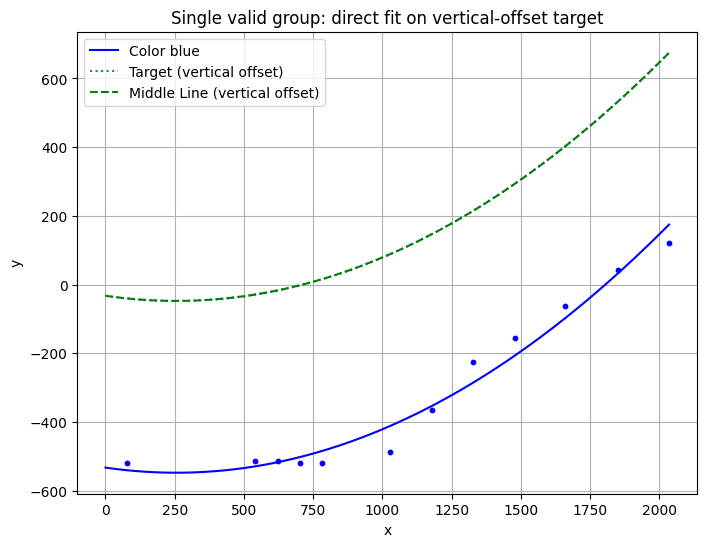

{'x_list': [np.float64(-23.302978515625), np.float64(441.674072265625), np.float64(522.9114379882812), np.float64(603.4698486328125), np.float64(927.01123046875), np.float64(1080.3045654296875), np.float64(1559.4906005859375), np.float64(1379.318115234375), np.float64(1750.4715576171875), np.float64(1935.162109375), np.float64(1228.2550048828125), np.float64(680.195068359375)], 'y_list': [np.float64(-518.8746948242188), np.float64(-514.346435546875), np.float64(-514.4471435546875), np.float64(-518.0999145507812), np.float64(-487.5694885253906), np.float64(-365.9333190917969), np.float64(-62.95293045043945), np.float64(-154.86785888671875), np.float64(41.17367172241211), np.float64(121.49510955810547), np.float64(-223.7011260986328), np.float64(-518.1259765625)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


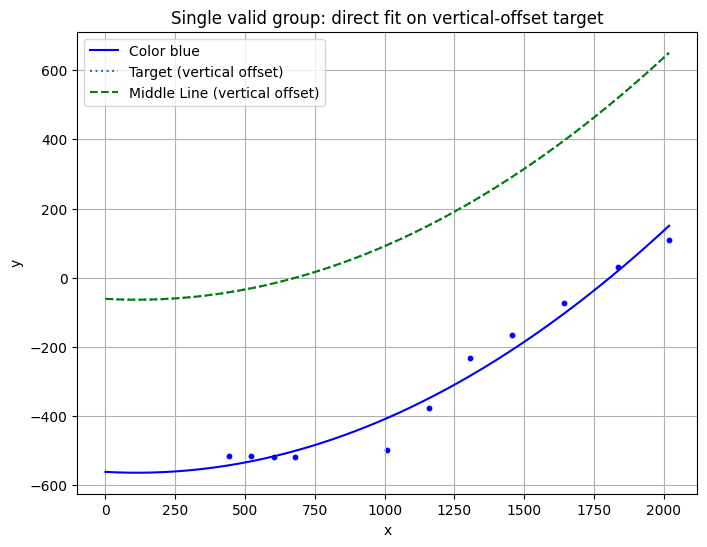

{'x_list': [np.float64(341.674072265625), np.float64(422.91143798828125), np.float64(503.4698486328125), np.float64(580.195068359375), np.float64(1058.139892578125), np.float64(1542.185791015625), np.float64(907.1685180664062), np.float64(1735.99658203125), np.float64(1205.269287109375), np.float64(1918.548583984375), np.float64(1355.5703125)], 'y_list': [np.float64(-514.346435546875), np.float64(-514.4471435546875), np.float64(-518.0999145507812), np.float64(-518.1259765625), np.float64(-375.87286376953125), np.float64(-73.50467681884766), np.float64(-497.54962158203125), np.float64(30.205602645874023), np.float64(-231.6563262939453), np.float64(108.8416976928711), np.float64(-165.3807373046875)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


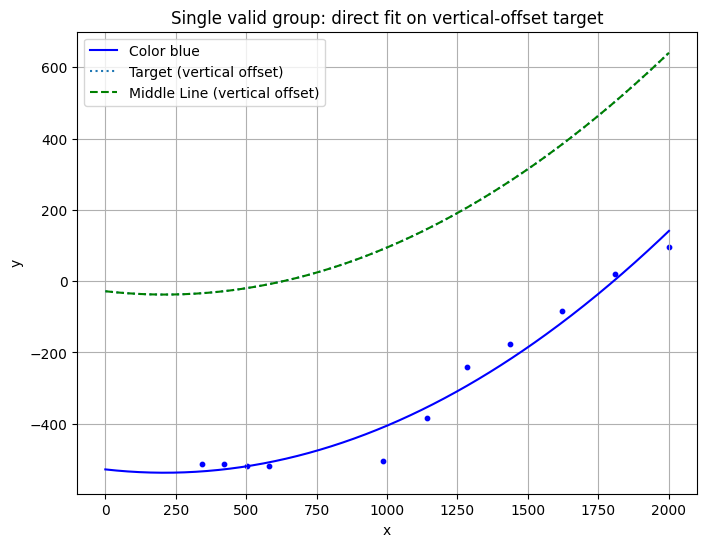

{'x_list': [np.float64(241.674072265625), np.float64(322.91143798828125), np.float64(403.4698486328125), np.float64(480.195068359375), np.float64(887.04345703125), np.float64(1041.1297607421875), np.float64(1520.43505859375), np.float64(1708.3406982421875), np.float64(1901.48193359375), np.float64(1183.49169921875), np.float64(1338.3447265625)], 'y_list': [np.float64(-514.346435546875), np.float64(-514.4471435546875), np.float64(-518.0999145507812), np.float64(-518.1259765625), np.float64(-504.1344909667969), np.float64(-382.99163818359375), np.float64(-85.14521789550781), np.float64(19.25737953186035), np.float64(94.46534729003906), np.float64(-240.62413024902344), np.float64(-176.10299682617188)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


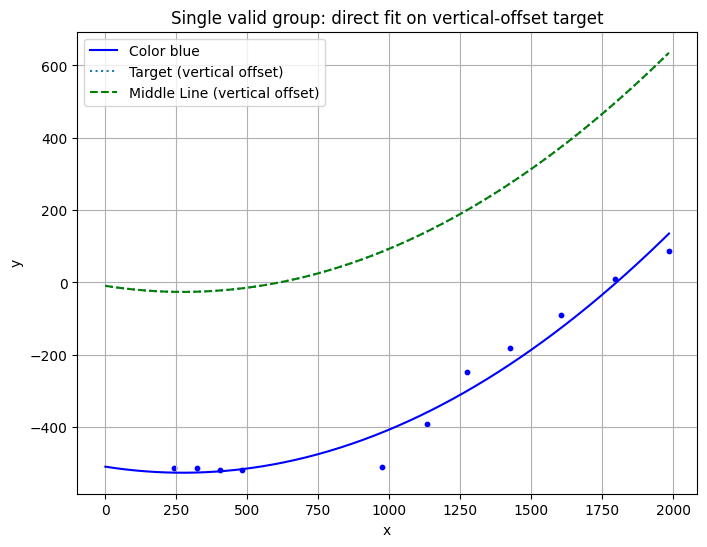

{'x_list': [np.float64(141.674072265625), np.float64(222.91143798828125), np.float64(303.4698486328125), np.float64(380.195068359375), np.float64(874.04345703125), np.float64(1695.792236328125), np.float64(1032.1719970703125), np.float64(1172.8614501953125), np.float64(1503.9114990234375), np.float64(1885.40576171875), np.float64(1325.16748046875)], 'y_list': [np.float64(-514.346435546875), np.float64(-514.4471435546875), np.float64(-518.0999145507812), np.float64(-518.1259765625), np.float64(-509.7025451660156), np.float64(10.427352905273438), np.float64(-390.42449951171875), np.float64(-247.5143585205078), np.float64(-90.552734375), np.float64(87.96945190429688), np.float64(-181.53582763671875)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


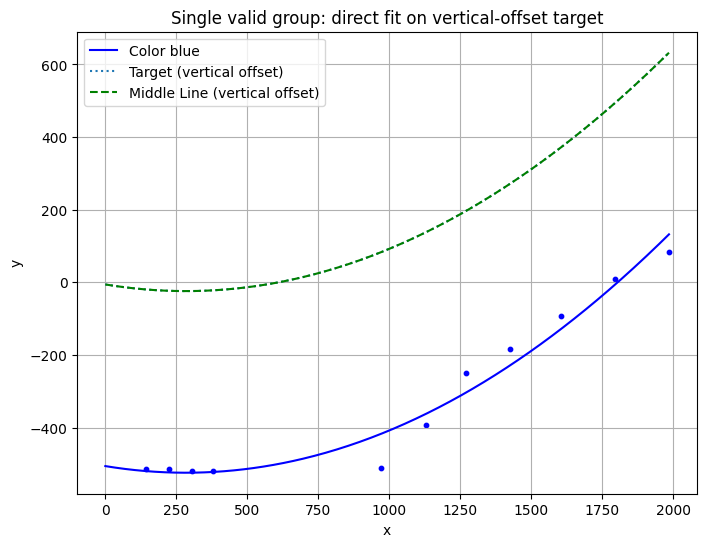

{'x_list': [np.float64(41.674072265625), np.float64(122.91143798828125), np.float64(203.4698486328125), np.float64(280.195068359375), np.float64(871.2938232421875), np.float64(1695.792236328125), np.float64(1884.689453125), np.float64(1503.9114990234375), np.float64(1029.07373046875), np.float64(1169.5118408203125), np.float64(1324.6444091796875)], 'y_list': [np.float64(-514.346435546875), np.float64(-514.4471435546875), np.float64(-518.0999145507812), np.float64(-518.1259765625), np.float64(-510.6171569824219), np.float64(8.689460754394531), np.float64(84.14469909667969), np.float64(-93.67524719238281), np.float64(-391.7529296875), np.float64(-249.36924743652344), np.float64(-184.3286895751953)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


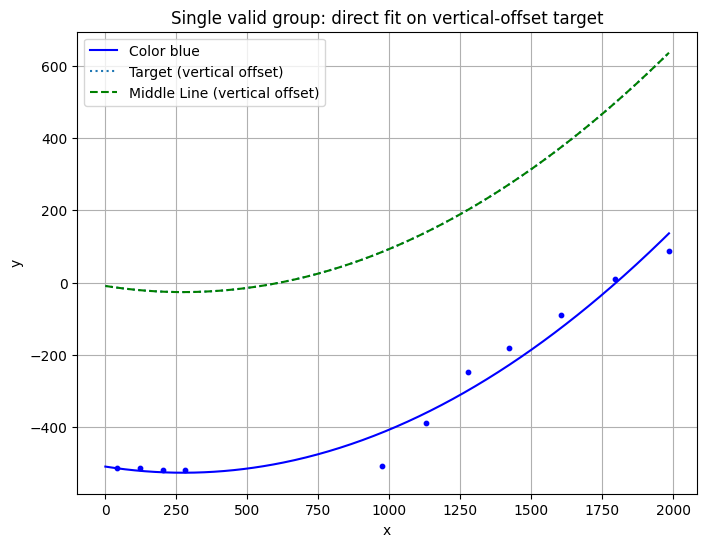

{'x_list': [np.float64(-58.325927734375), np.float64(22.91143798828125), np.float64(103.4698486328125), np.float64(180.195068359375), np.float64(873.6741333007812), np.float64(1695.1412353515625), np.float64(1029.4954833984375), np.float64(1176.2288818359375), np.float64(1884.689453125), np.float64(1503.32666015625), np.float64(1320.4788818359375)], 'y_list': [np.float64(-514.346435546875), np.float64(-514.4471435546875), np.float64(-518.0999145507812), np.float64(-518.1259765625), np.float64(-508.7166442871094), np.float64(10.427352905273438), np.float64(-388.375732421875), np.float64(-248.16917419433594), np.float64(87.96945190429688), np.float64(-90.552734375), np.float64(-181.00503540039062)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


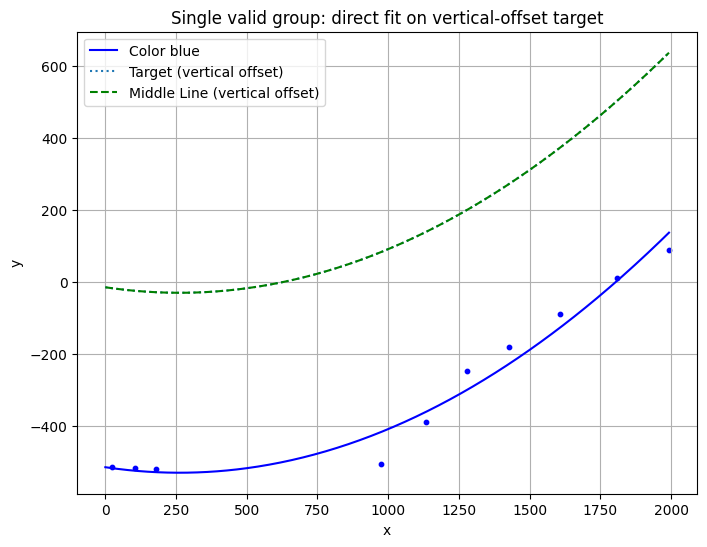

{'x_list': [np.float64(-77.08856201171875), np.float64(3.4698486328125), np.float64(80.195068359375), np.float64(876.0642700195312), np.float64(1034.861328125), np.float64(1179.140869140625), np.float64(1892.6922607421875), np.float64(1708.3406982421875), np.float64(1509.1875), np.float64(1328.8345947265625)], 'y_list': [np.float64(-514.4471435546875), np.float64(-518.0999145507812), np.float64(-518.1259765625), np.float64(-505.82037353515625), np.float64(-387.9586181640625), np.float64(-247.56436157226562), np.float64(90.24425506591797), np.float64(12.254694938659668), np.float64(-89.28421783447266), np.float64(-179.26869201660156)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


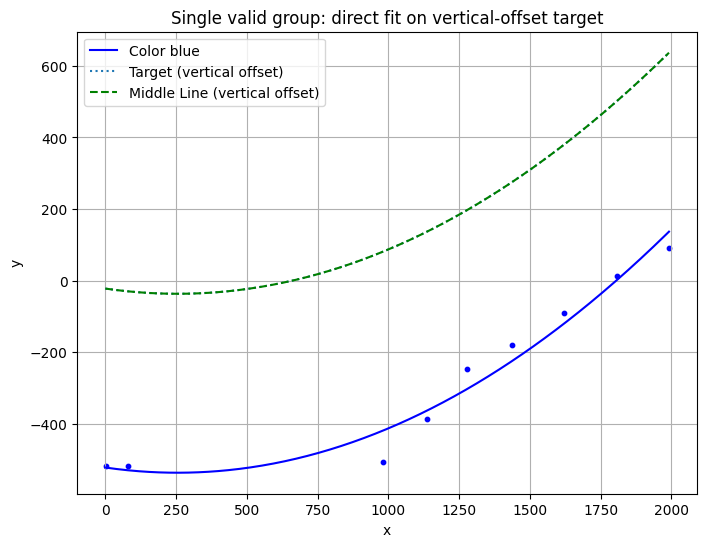

{'x_list': [np.float64(-96.5301513671875), np.float64(-19.804931640625), np.float64(880.1312255859375), np.float64(1707.6849365234375), np.float64(1037.5633544921875), np.float64(1179.140869140625), np.float64(1891.972900390625), np.float64(1519.253662109375), np.float64(1337.2891845703125)], 'y_list': [np.float64(-518.0999145507812), np.float64(-518.1259765625), np.float64(-506.9359436035156), np.float64(12.254694938659668), np.float64(-387.74859619140625), np.float64(-246.30126953125), np.float64(90.24425506591797), np.float64(-89.87550354003906), np.float64(-180.32945251464844)], 'c_list': [1, 1, 1, 1, 1, 1, 1, 1, 1]}


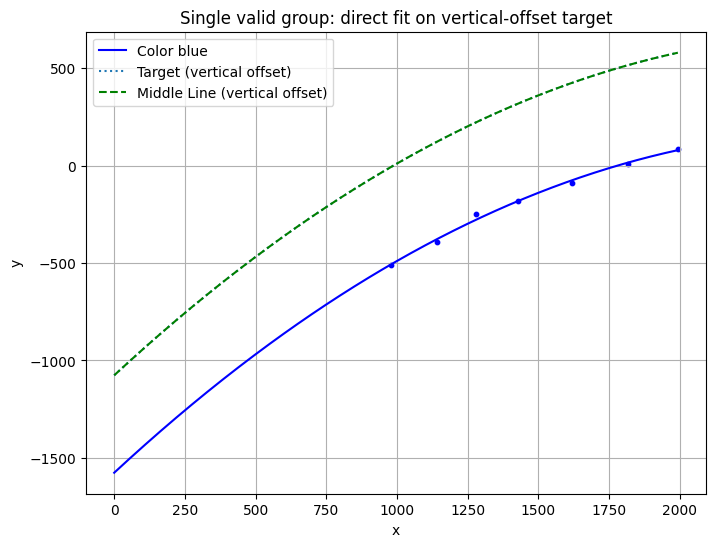

{'x_list': [np.float64(880.1312255859375), np.float64(1715.013671875), np.float64(1040.2783203125), np.float64(1179.614013671875), np.float64(1892.6922607421875), np.float64(1519.253662109375), np.float64(1328.8345947265625)], 'y_list': [np.float64(-508.9200134277344), np.float64(10.54278564453125), np.float64(-390.94696044921875), np.float64(-248.8274383544922), np.float64(86.4040756225586), np.float64(-91.45226287841797), np.float64(-180.6692352294922)], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


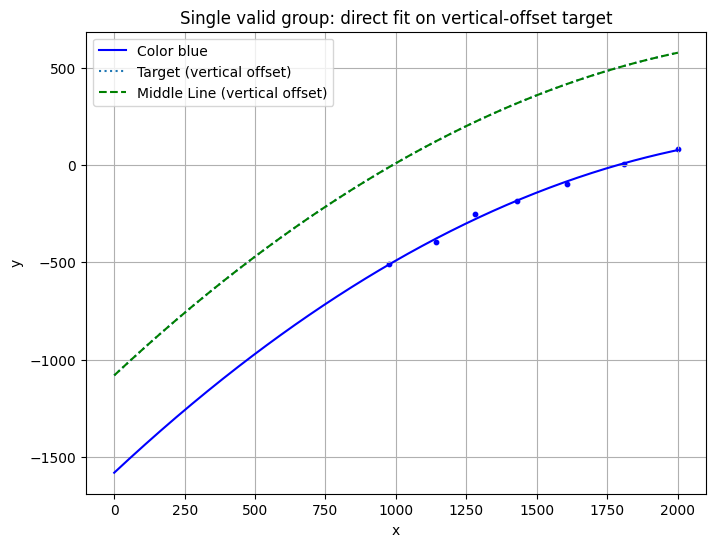

{'x_list': [np.float64(876.434326171875), np.float64(1900.759765625), np.float64(1508.6007080078125), np.float64(1708.3406982421875), np.float64(1179.614013671875), np.float64(1040.7039794921875), np.float64(1328.8345947265625)], 'y_list': [np.float64(-510.760009765625), np.float64(80.97029876708984), np.float64(-95.54977416992188), np.float64(5.252012252807617), np.float64(-252.61668395996094), np.float64(-395.49285888671875), np.float64(-184.87083435058594)], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


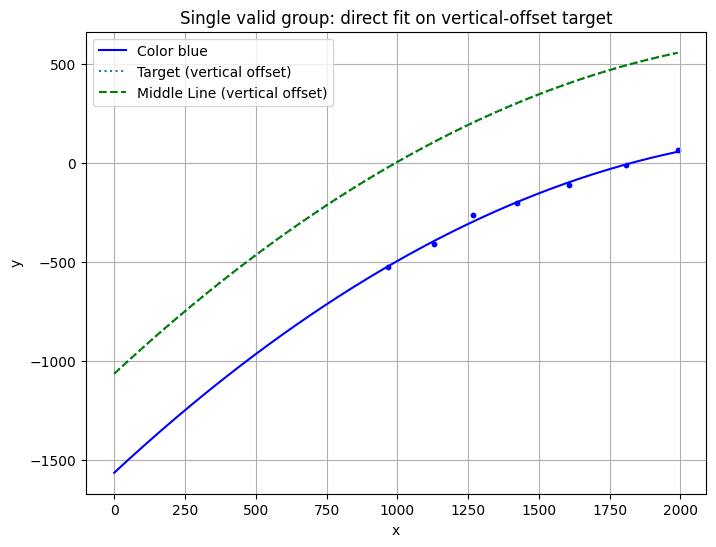

{'x_list': [np.float64(868.92333984375), np.float64(1707.0291748046875), np.float64(1031.32666015625), np.float64(1507.4271240234375), np.float64(1168.572998046875), np.float64(1323.59814453125), np.float64(1891.253662109375)], 'y_list': [np.float64(-525.2734375), np.float64(-14.005366325378418), np.float64(-408.4787902832031), np.float64(-112.7800521850586), np.float64(-265.6596984863281), np.float64(-202.48226928710938), np.float64(61.442901611328125)], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


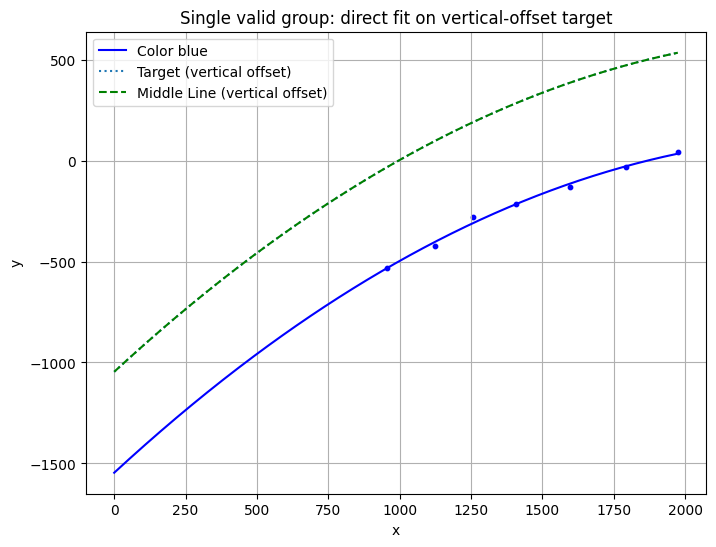

{'x_list': [np.float64(854.4127197265625), np.float64(1496.921142578125), np.float64(1693.1881103515625), np.float64(1022.5013427734375), np.float64(1158.170654296875), np.float64(1874.6099853515625), np.float64(1307.0927734375)], 'y_list': [np.float64(-534.2534790039062), np.float64(-129.16061401367188), np.float64(-31.282058715820312), np.float64(-421.2814025878906), np.float64(-279.7416687011719), np.float64(39.999324798583984), np.float64(-215.31729125976562)], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


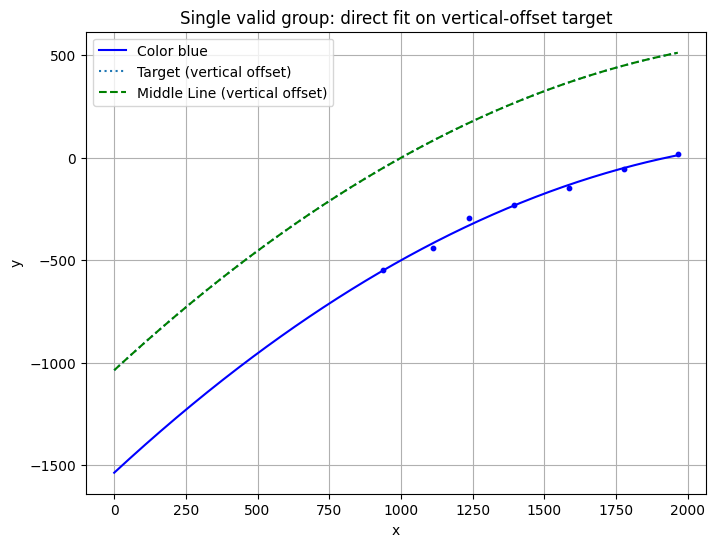

{'x_list': [np.float64(839.23681640625), np.float64(1013.383056640625), np.float64(1137.388671875), np.float64(1485.3931884765625), np.float64(1866.0323486328125), np.float64(1679.5477294921875), np.float64(1293.9373779296875)], 'y_list': [np.float64(-548.707275390625), np.float64(-439.4674987792969), np.float64(-293.7886657714844), np.float64(-149.966552734375), np.float64(18.971410751342773), np.float64(-53.48426055908203), np.float64(-231.24954223632812)], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


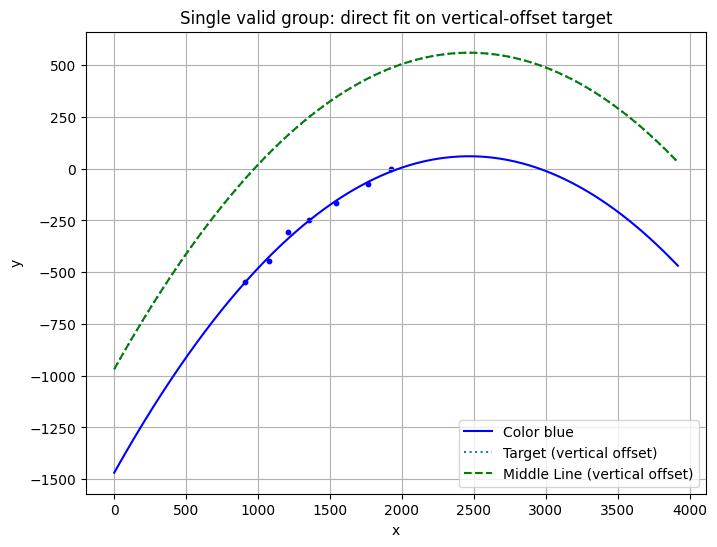

{'x_list': [np.float64(1665.4619140625), np.float64(978.13525390625), np.float64(1442.9986572265625), np.float64(809.0508422851562), np.float64(1825.54296875), np.float64(1107.1666259765625), np.float64(1256.2978515625)], 'y_list': [np.float64(-75.36701202392578), np.float64(-448.10821533203125), np.float64(-165.75973510742188), np.float64(-548.443603515625), np.float64(-3.7201755046844482), np.float64(-306.2882385253906), np.float64(-246.76123046875)], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


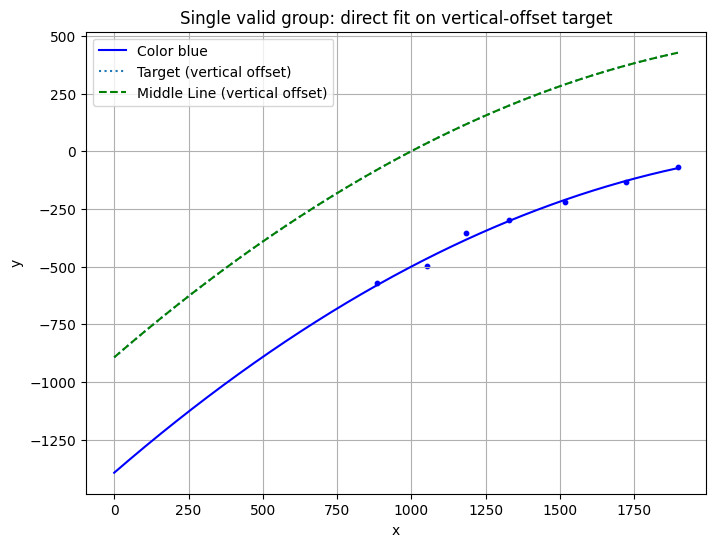

{'x_list': [np.float64(1418.4085693359375), np.float64(1621.4737548828125), np.float64(953.4012451171875), np.float64(1228.7449951171875), np.float64(1796.605224609375), np.float64(1084.5401611328125), np.float64(783.1417846679688)], 'y_list': [np.float64(-219.5482940673828), np.float64(-131.9944305419922), np.float64(-498.404296875), np.float64(-295.6517639160156), np.float64(-69.59590148925781), np.float64(-353.9035339355469), np.float64(-572.150146484375)], 'c_list': [1, 1, 1, 1, 1, 1, 1]}


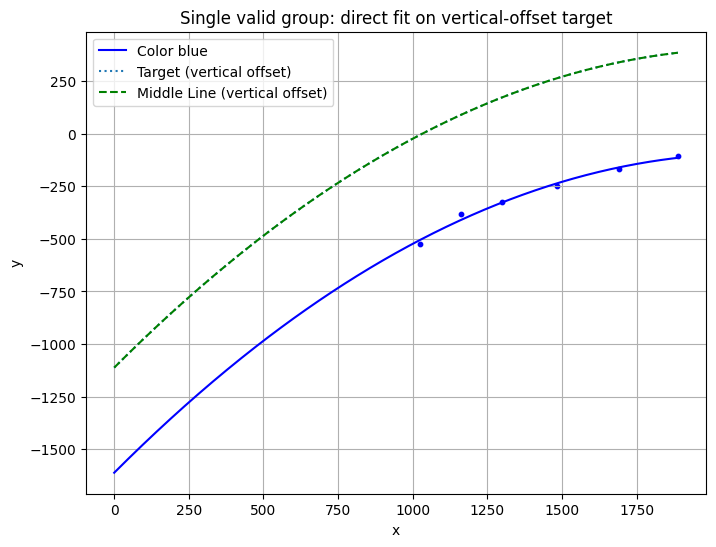

{'x_list': [np.float64(925.5572509765625), np.float64(1590.56298828125), np.float64(1061.816650390625), np.float64(1384.3720703125), np.float64(1787.9716796875), np.float64(1198.7313232421875)], 'y_list': [np.float64(-522.6644287109375), np.float64(-165.8428497314453), np.float64(-381.4082946777344), np.float64(-249.7054443359375), np.float64(-107.64277648925781), np.float64(-322.5752258300781)], 'c_list': [1, 1, 1, 1, 1, 1]}


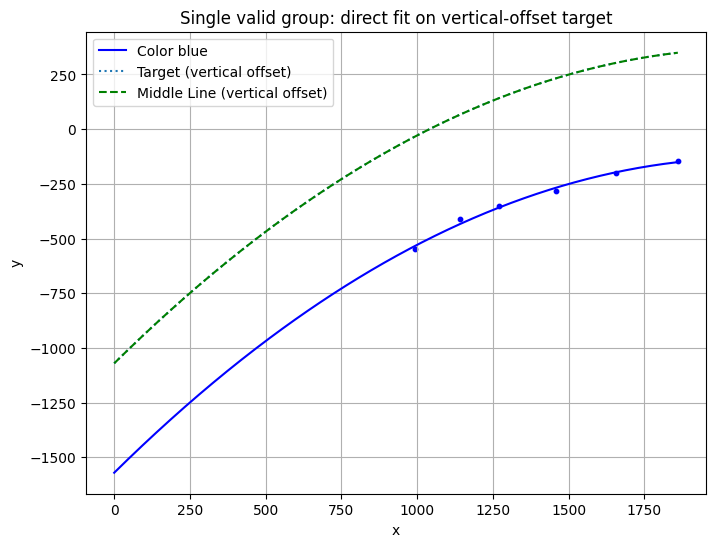

{'x_list': [np.float64(1357.172607421875), np.float64(1041.555419921875), np.float64(893.0771484375), np.float64(1556.2947998046875), np.float64(1170.45068359375), np.float64(1760.1470947265625)], 'y_list': [np.float64(-282.2878112792969), np.float64(-412.5399475097656), np.float64(-547.3592529296875), np.float64(-201.09056091308594), np.float64(-352.1243896484375), np.float64(-145.55010986328125)], 'c_list': [1, 1, 1, 1, 1, 1]}


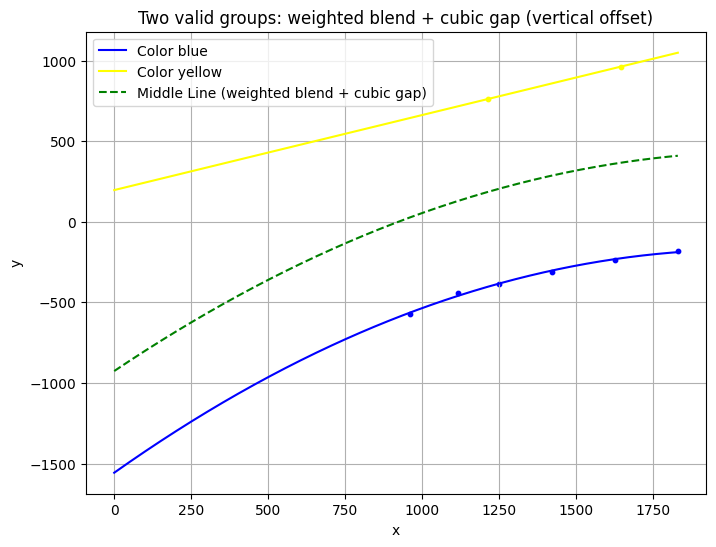

{'x_list': [np.float64(1545.1129150390625), np.float64(1527.5963134765625), np.float64(861.7271728515625), np.float64(1015.4669189453125), np.float64(1148.854248046875), np.float64(1322.0435791015625), np.float64(1731.1607666015625), np.float64(1116.0042724609375)], 'y_list': [np.float64(962.0830078125), np.float64(-235.7182159423828), np.float64(-574.5350952148438), np.float64(-440.5800476074219), np.float64(-383.65997314453125), np.float64(-311.8855895996094), np.float64(-184.1002960205078), np.float64(762.3790893554688)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


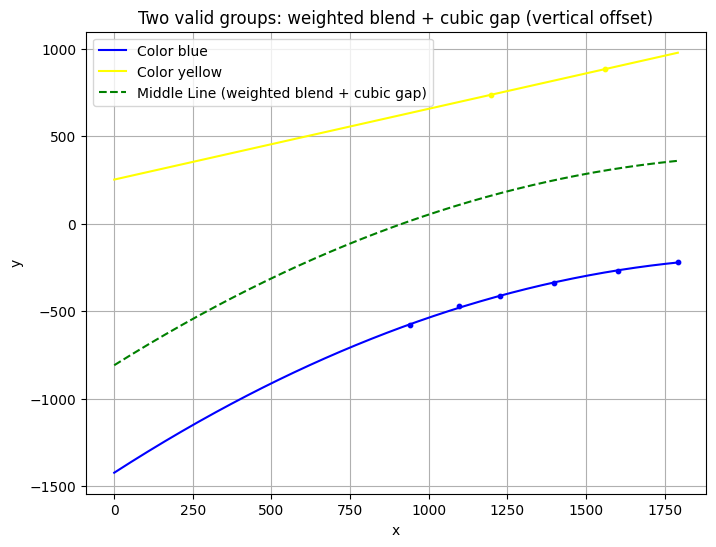

{'x_list': [np.float64(1461.3546142578125), np.float64(839.9517822265625), np.float64(995.8765869140625), np.float64(1501.001708984375), np.float64(1125.7022705078125), np.float64(1691.856689453125), np.float64(1297.5255126953125), np.float64(1097.4351806640625)], 'y_list': [np.float64(884.7777709960938), np.float64(-580.1982421875), np.float64(-468.519775390625), np.float64(-267.65814208984375), np.float64(-410.7528381347656), np.float64(-218.1781463623047), np.float64(-340.7167663574219), np.float64(737.5458374023438)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


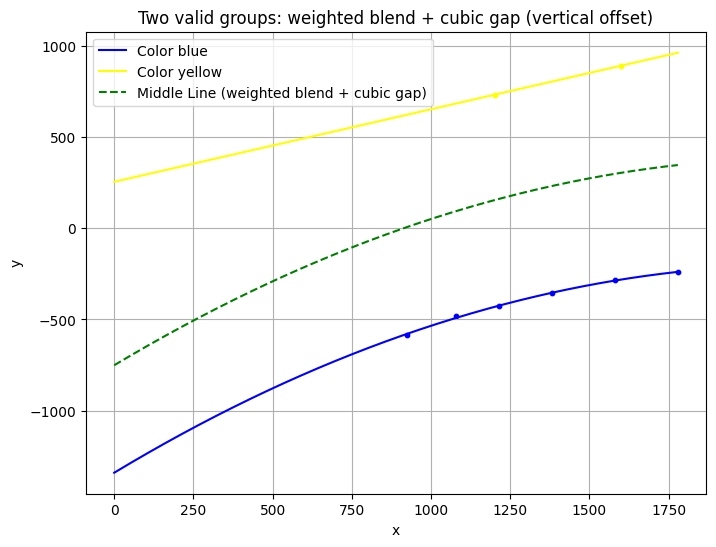

{'x_list': [np.float64(823.13232421875), np.float64(1498.01416015625), np.float64(979.753173828125), np.float64(1480.3436279296875), np.float64(1678.9190673828125), np.float64(1280.6309814453125), np.float64(1115.5157470703125), np.float64(1101.788330078125)], 'y_list': [np.float64(-582.7341918945312), np.float64(891.0741577148438), np.float64(-482.6611022949219), np.float64(-284.1734313964844), np.float64(-238.9507598876953), np.float64(-357.1368408203125), np.float64(-426.8807067871094), np.float64(733.416748046875)], 'c_list': [1, 0, 1, 1, 1, 1, 1, 0]}


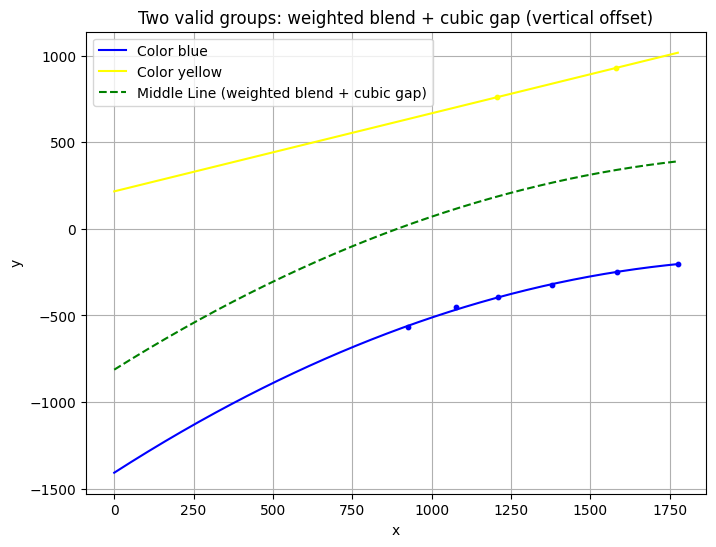

{'x_list': [np.float64(1482.645263671875), np.float64(824.064697265625), np.float64(1481.260498046875), np.float64(975.6837158203125), np.float64(1675.0867919921875), np.float64(1278.7412109375), np.float64(1107.7177734375), np.float64(1105.044921875)], 'y_list': [np.float64(-251.9158935546875), np.float64(-568.2256469726562), np.float64(929.0986328125), np.float64(-453.60943603515625), np.float64(-200.40773010253906), np.float64(-325.09906005859375), np.float64(-396.2220153808594), np.float64(759.4808959960938)], 'c_list': [1, 1, 0, 1, 1, 1, 1, 0]}


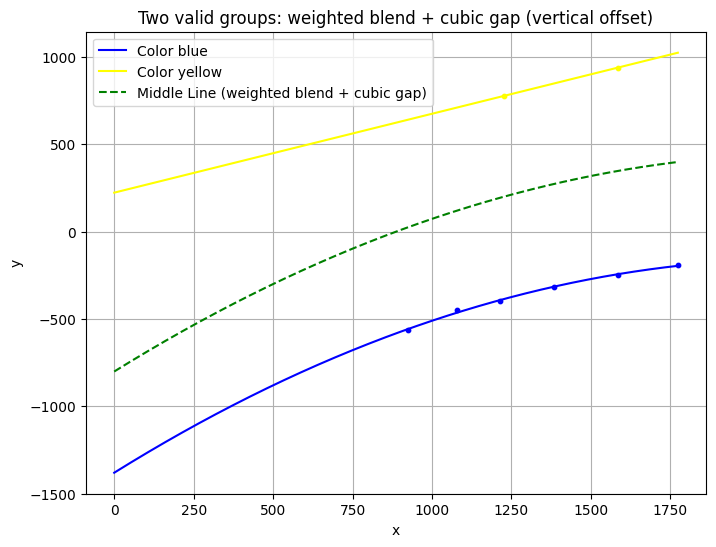

{'x_list': [np.float64(1485.84521484375), np.float64(825.185791015625), np.float64(980.15771484375), np.float64(1485.4580078125), np.float64(1285.0726318359375), np.float64(1112.9033203125), np.float64(1673.803466796875), np.float64(1125.40625)], 'y_list': [np.float64(938.3595581054688), np.float64(-565.5843505859375), np.float64(-448.10821533203125), np.float64(-246.5669708251953), np.float64(-320.16827392578125), np.float64(-395.8191833496094), np.float64(-193.55618286132812), np.float64(775.6373901367188)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


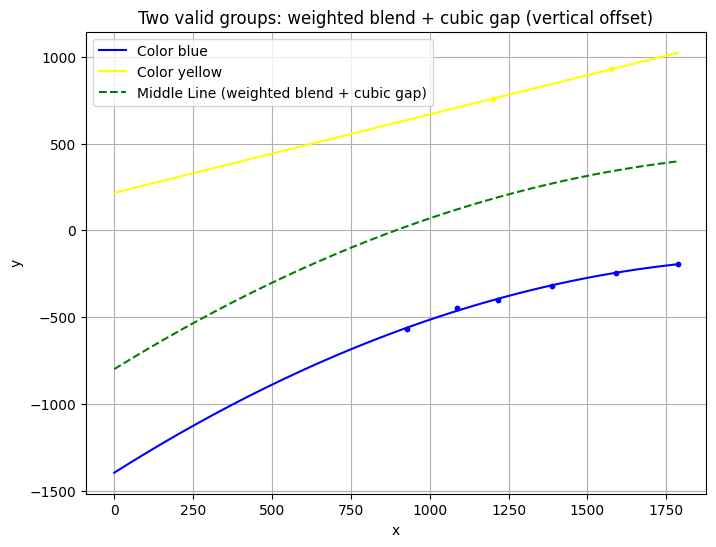

{'x_list': [np.float64(1475.5474853515625), np.float64(829.2110595703125), np.float64(985.4849853515625), np.float64(1491.763916015625), np.float64(1289.030029296875), np.float64(1116.4166259765625), np.float64(1686.6571044921875), np.float64(1101.551513671875)], 'y_list': [np.float64(927.6281127929688), np.float64(-566.8838500976562), np.float64(-447.9803161621094), np.float64(-244.27542114257812), np.float64(-319.7225036621094), np.float64(-399.22369384765625), np.float64(-193.2334747314453), np.float64(758.7655029296875)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


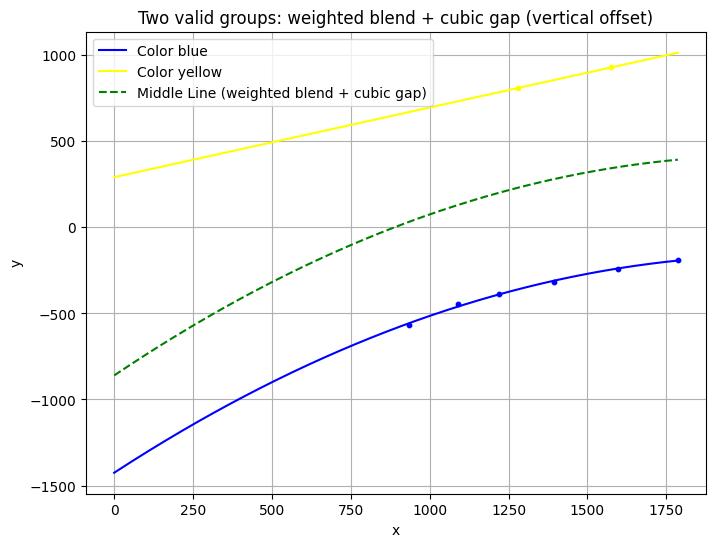

{'x_list': [np.float64(1475.5474853515625), np.float64(833.2684326171875), np.float64(990.452880859375), np.float64(1496.3677978515625), np.float64(1293.5211181640625), np.float64(1119.0445556640625), np.float64(1686.6571044921875), np.float64(1178.5914306640625)], 'y_list': [np.float64(929.1742553710938), np.float64(-565.3480834960938), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-316.5453796386719), np.float64(-389.3846130371094), np.float64(-189.7828826904297), np.float64(808.9981689453125)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


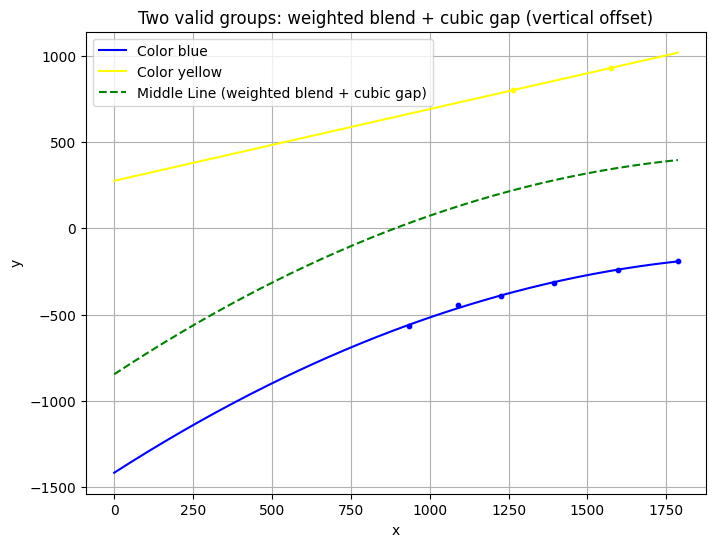

{'x_list': [np.float64(1475.5474853515625), np.float64(835.4873046875), np.float64(990.452880859375), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1125.7022705078125), np.float64(1686.6571044921875), np.float64(1165.4638671875)], 'y_list': [np.float64(929.1742553710938), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-316.5453796386719), np.float64(-393.7895812988281), np.float64(-189.7828826904297), np.float64(800.3917846679688)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


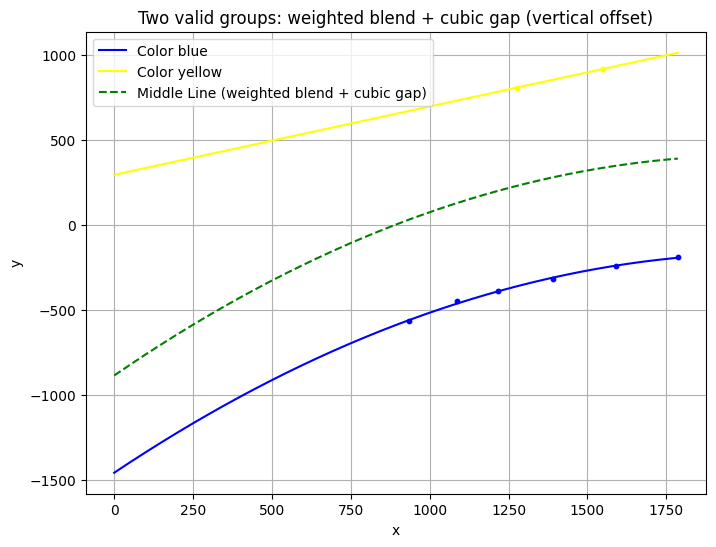

{'x_list': [np.float64(1450.94873046875), np.float64(835.1312866210938), np.float64(987.9632568359375), np.float64(1491.763916015625), np.float64(1289.5396728515625), np.float64(1116.4166259765625), np.float64(1686.6571044921875), np.float64(1175.641845703125)], 'y_list': [np.float64(917.3738403320312), np.float64(-567.427001953125), np.float64(-445.7415466308594), np.float64(-241.18333435058594), np.float64(-317.0014343261719), np.float64(-390.8063049316406), np.float64(-189.7828826904297), np.float64(806.8292846679688)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


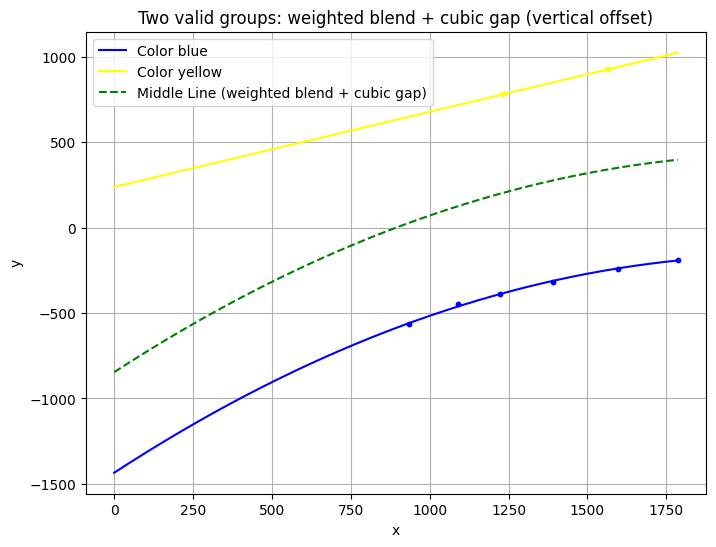

{'x_list': [np.float64(1465.9580078125), np.float64(835.4873046875), np.float64(990.452880859375), np.float64(1496.94873046875), np.float64(1289.5396728515625), np.float64(1122.59130859375), np.float64(1686.6571044921875), np.float64(1132.6798095703125)], 'y_list': [np.float64(926.2516479492188), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-317.0014343261719), np.float64(-391.5815124511719), np.float64(-189.7828826904297), np.float64(779.65625)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


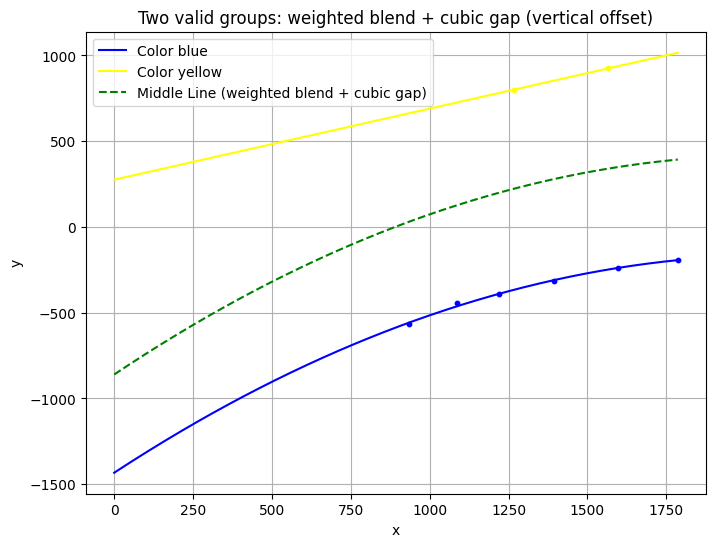

{'x_list': [np.float64(1465.9580078125), np.float64(835.4873046875), np.float64(987.9632568359375), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(1165.938232421875)], 'y_list': [np.float64(924.7156372070312), np.float64(-566.4765014648438), np.float64(-445.7415466308594), np.float64(-241.9689178466797), np.float64(-317.9097595214844), np.float64(-389.3846130371094), np.float64(-189.7828826904297), np.float64(800.3917846679688)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


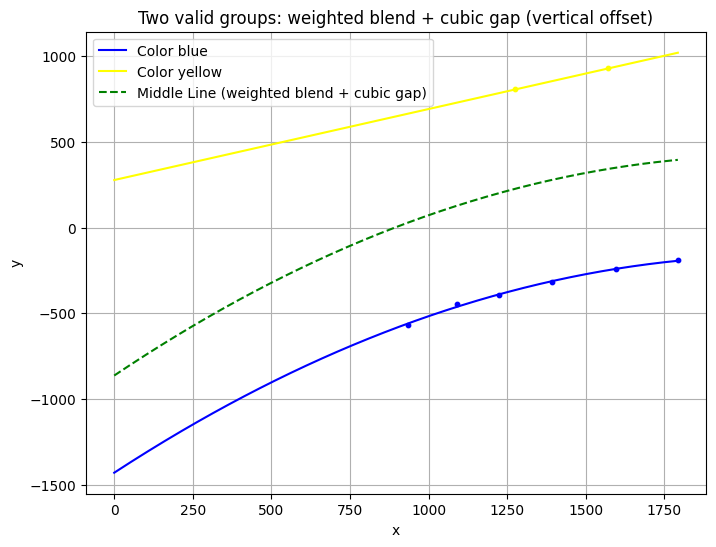

{'x_list': [np.float64(1471.02587890625), np.float64(835.4873046875), np.float64(990.452880859375), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1122.59130859375), np.float64(1693.154052734375), np.float64(1175.641845703125)], 'y_list': [np.float64(929.2493286132812), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-317.9097595214844), np.float64(-391.5815124511719), np.float64(-190.47299194335938), np.float64(806.8292846679688)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


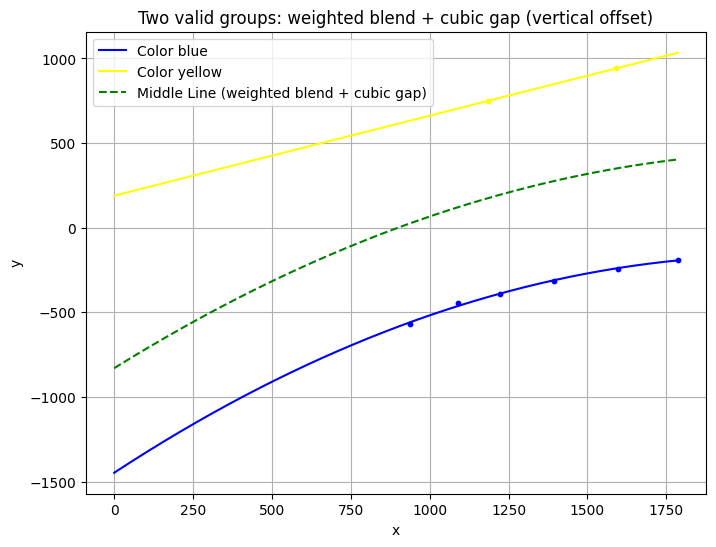

{'x_list': [np.float64(1491.6295166015625), np.float64(837.0015258789062), np.float64(990.452880859375), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1122.59130859375), np.float64(1686.6571044921875), np.float64(1083.617919921875)], 'y_list': [np.float64(941.4361572265625), np.float64(-567.6094970703125), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-316.5453796386719), np.float64(-390.3728942871094), np.float64(-189.7828826904297), np.float64(748.6251831054688)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


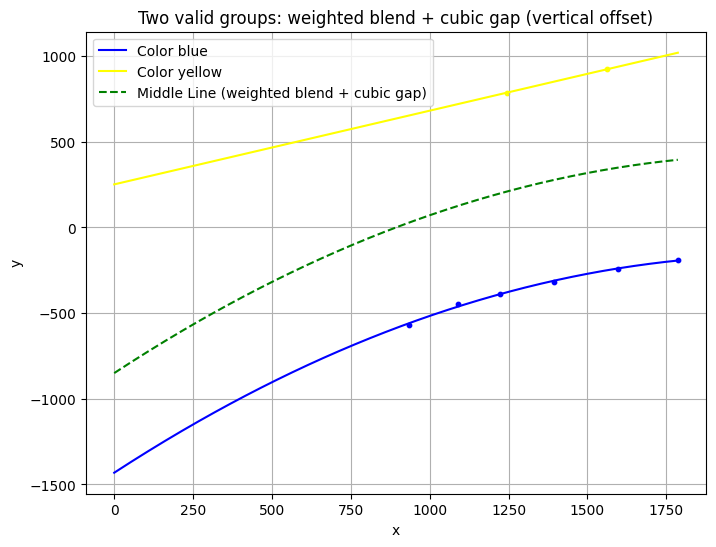

{'x_list': [np.float64(1460.9228515625), np.float64(835.1312866210938), np.float64(990.452880859375), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1122.59130859375), np.float64(1686.6571044921875), np.float64(1146.054443359375)], 'y_list': [np.float64(923.2734375), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-316.5453796386719), np.float64(-390.3728942871094), np.float64(-189.7828826904297), np.float64(787.8202514648438)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


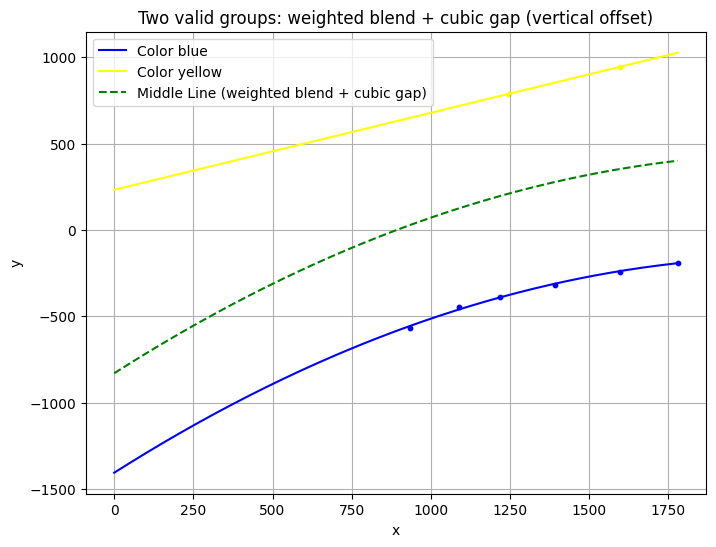

{'x_list': [np.float64(1496.8651123046875), np.float64(833.623779296875), np.float64(987.9632568359375), np.float64(1293.5211181640625), np.float64(1496.94873046875), np.float64(1119.49609375), np.float64(1680.20703125), np.float64(1145.5875244140625)], 'y_list': [np.float64(944.5330200195312), np.float64(-565.3480834960938), np.float64(-445.7415466308594), np.float64(-317.9097595214844), np.float64(-241.9689178466797), np.float64(-390.5901794433594), np.float64(-189.0977325439453), np.float64(787.8202514648438)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


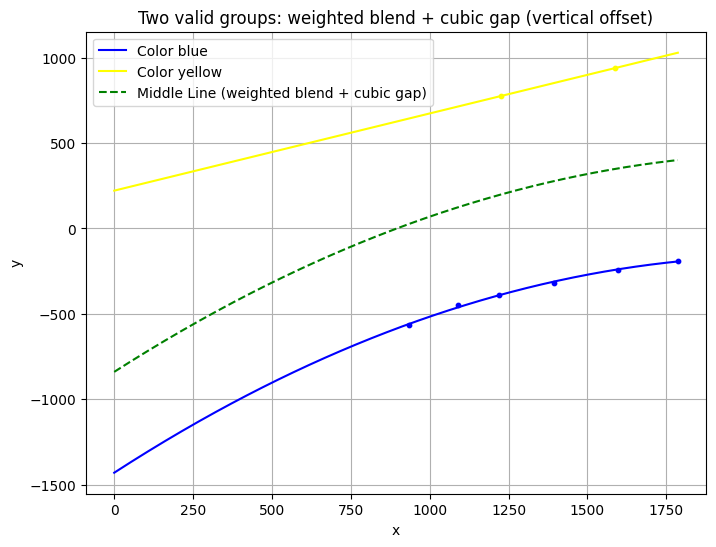

{'x_list': [np.float64(1486.4281005859375), np.float64(835.1312866210938), np.float64(990.452880859375), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(1126.3258056640625)], 'y_list': [np.float64(938.3595581054688), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-317.9097595214844), np.float64(-390.5901794433594), np.float64(-189.7828826904297), np.float64(775.6373901367188)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


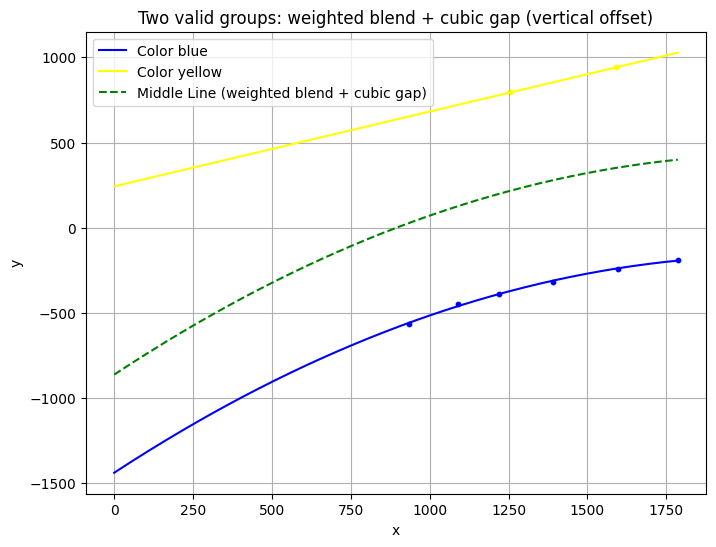

{'x_list': [np.float64(1491.6295166015625), np.float64(833.623779296875), np.float64(990.452880859375), np.float64(1496.94873046875), np.float64(1289.5396728515625), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(1155.9176025390625)], 'y_list': [np.float64(941.4361572265625), np.float64(-566.2966918945312), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-317.0014343261719), np.float64(-389.3846130371094), np.float64(-189.7828826904297), np.float64(794.05615234375)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


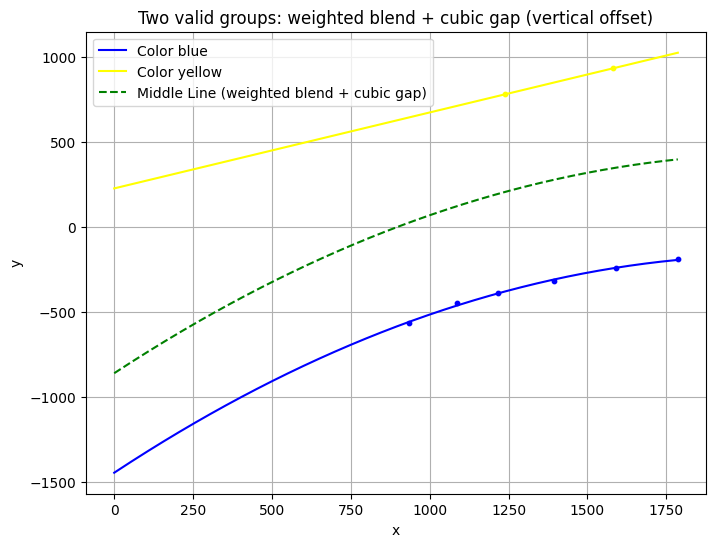

{'x_list': [np.float64(1481.260498046875), np.float64(835.4873046875), np.float64(987.9632568359375), np.float64(1491.763916015625), np.float64(1293.5211181640625), np.float64(1116.4166259765625), np.float64(1686.6571044921875), np.float64(1139.5645751953125)], 'y_list': [np.float64(935.3030395507812), np.float64(-566.4765014648438), np.float64(-445.7415466308594), np.float64(-241.18333435058594), np.float64(-317.9097595214844), np.float64(-388.4013366699219), np.float64(-189.7828826904297), np.float64(782.4769287109375)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


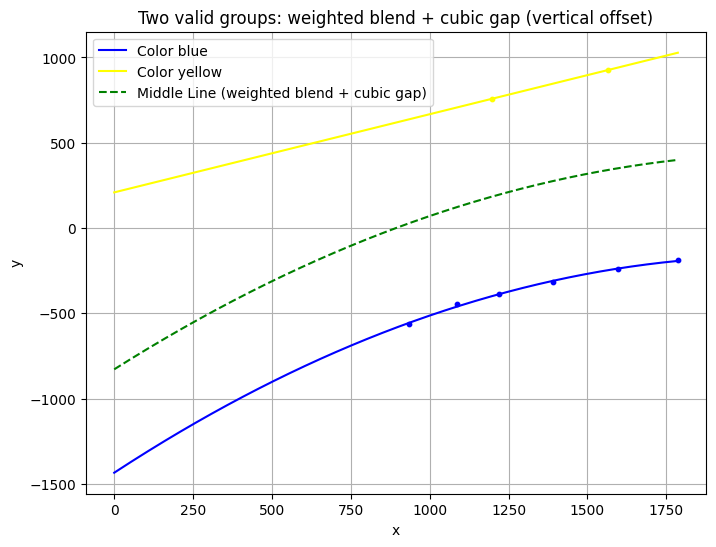

{'x_list': [np.float64(1465.9580078125), np.float64(833.2684326171875), np.float64(987.9632568359375), np.float64(1496.94873046875), np.float64(1289.5396728515625), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(1098.9742431640625)], 'y_list': [np.float64(926.2516479492188), np.float64(-565.3480834960938), np.float64(-445.7415466308594), np.float64(-241.9689178466797), np.float64(-315.6409606933594), np.float64(-389.3846130371094), np.float64(-189.7828826904297), np.float64(758.0536499023438)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


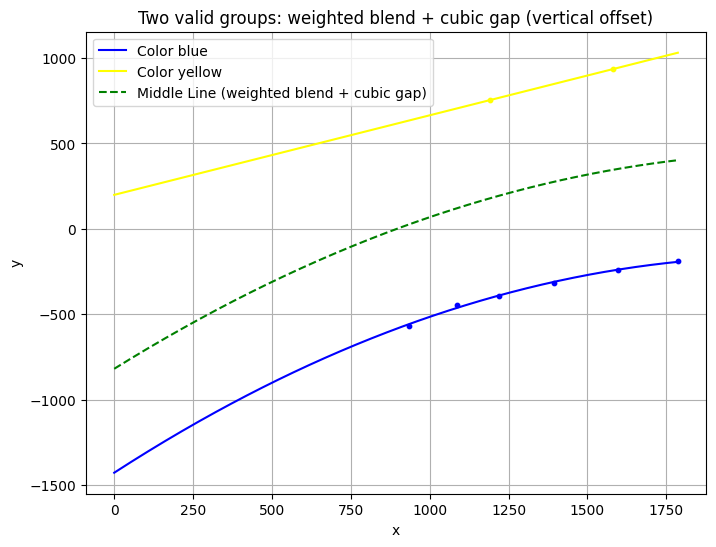

{'x_list': [np.float64(1481.260498046875), np.float64(835.1312866210938), np.float64(987.9632568359375), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(1092.517333984375)], 'y_list': [np.float64(935.3030395507812), np.float64(-566.4765014648438), np.float64(-445.7415466308594), np.float64(-241.9689178466797), np.float64(-317.9097595214844), np.float64(-390.5901794433594), np.float64(-189.7828826904297), np.float64(754.25390625)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


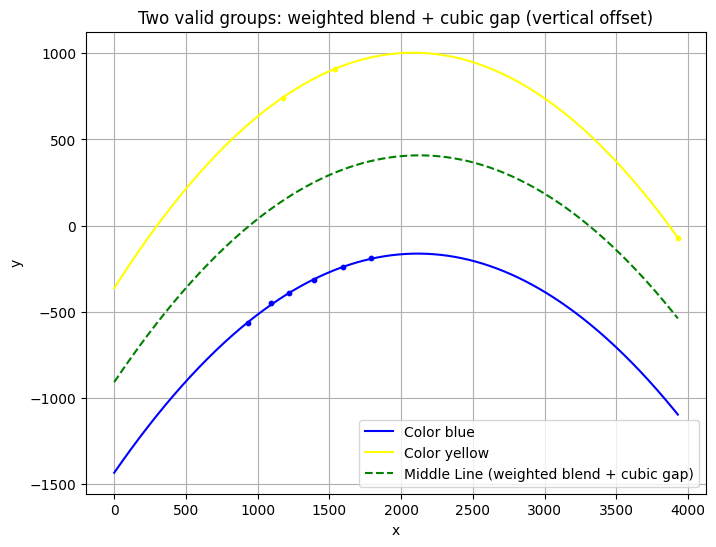

{'x_list': [np.float64(1436.2247314453125), np.float64(835.1312866210938), np.float64(990.452880859375), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(3829.054443359375), np.float64(1074.850341796875)], 'y_list': [np.float64(908.6646728515625), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.9689178466797), np.float64(-317.9097595214844), np.float64(-389.3846130371094), np.float64(-189.7828826904297), np.float64(-69.59590148925781), np.float64(743.0797729492188)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0, 0]}


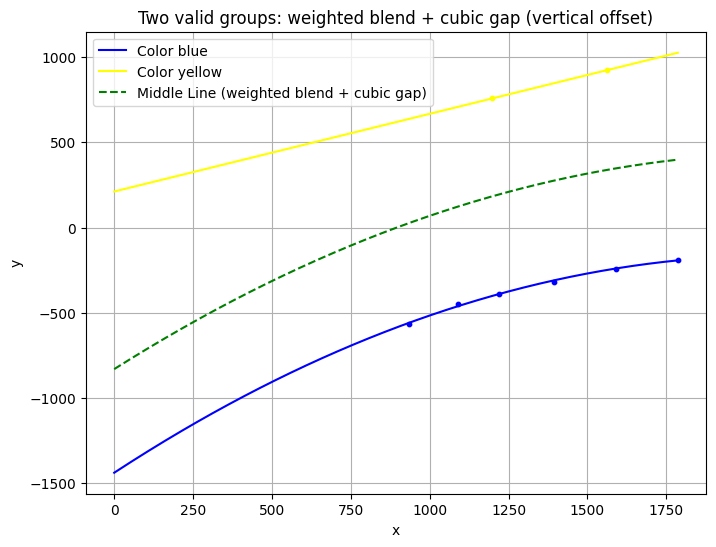

{'x_list': [np.float64(1460.9228515625), np.float64(835.1312866210938), np.float64(990.452880859375), np.float64(1491.763916015625), np.float64(1293.5211181640625), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(1098.52490234375)], 'y_list': [np.float64(923.2734375), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.18333435058594), np.float64(-317.9097595214844), np.float64(-389.3846130371094), np.float64(-189.7828826904297), np.float64(758.0536499023438)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


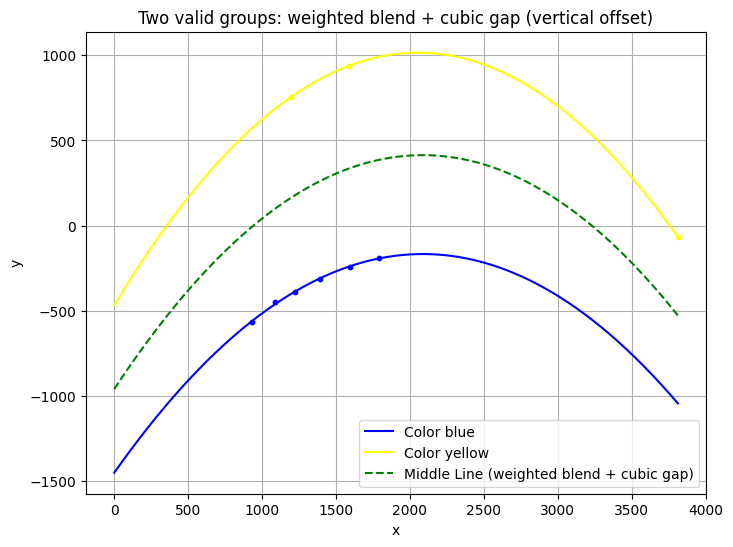

{'x_list': [np.float64(1486.4281005859375), np.float64(835.1312866210938), np.float64(990.452880859375), np.float64(1491.763916015625), np.float64(1293.5211181640625), np.float64(1119.49609375), np.float64(1693.154052734375), np.float64(3711.769287109375), np.float64(1095.9617919921875)], 'y_list': [np.float64(938.3595581054688), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.18333435058594), np.float64(-316.5453796386719), np.float64(-389.3846130371094), np.float64(-190.47299194335938), np.float64(-67.51840209960938), np.float64(756.1490478515625)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0, 0]}


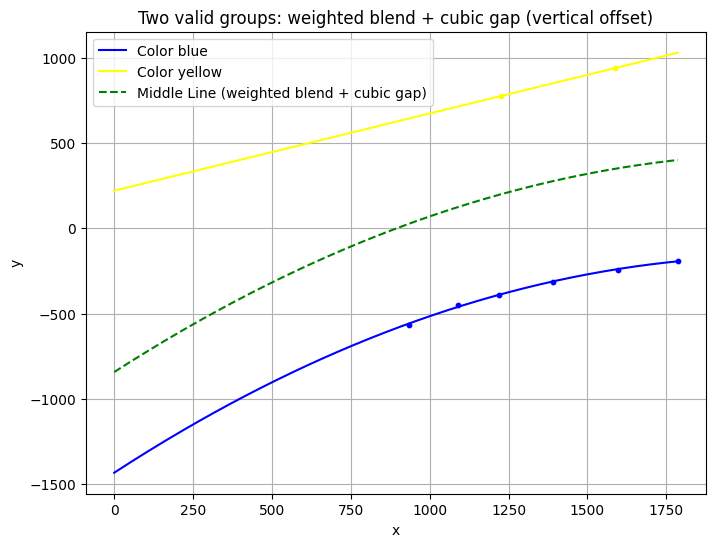

{'x_list': [np.float64(1486.4281005859375), np.float64(833.623779296875), np.float64(990.452880859375), np.float64(1289.5396728515625), np.float64(1496.94873046875), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(1126.7855224609375)], 'y_list': [np.float64(938.3595581054688), np.float64(-565.3480834960938), np.float64(-446.7615661621094), np.float64(-317.0014343261719), np.float64(-241.9689178466797), np.float64(-389.3846130371094), np.float64(-189.7828826904297), np.float64(775.6373901367188)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


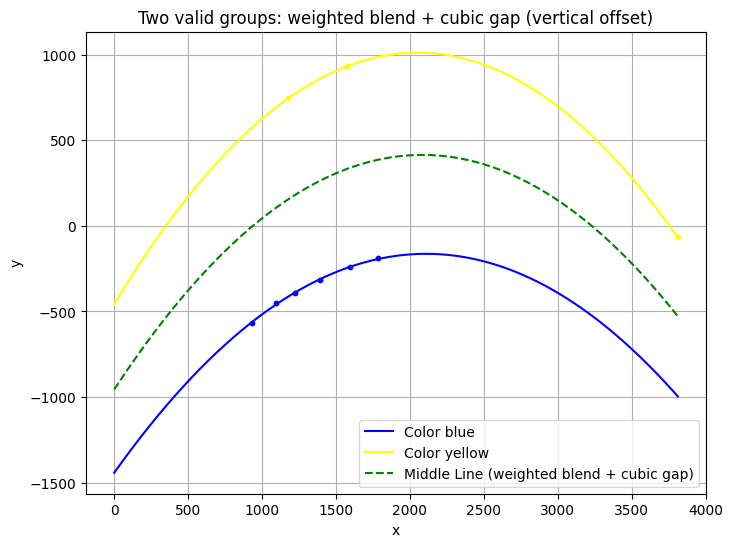

{'x_list': [np.float64(1476.1265869140625), np.float64(835.1312866210938), np.float64(992.9539794921875), np.float64(1496.94873046875), np.float64(1293.5211181640625), np.float64(1119.49609375), np.float64(1686.6571044921875), np.float64(3711.769287109375), np.float64(1078.199951171875)], 'y_list': [np.float64(932.2662963867188), np.float64(-566.4765014648438), np.float64(-447.7862243652344), np.float64(-241.9689178466797), np.float64(-316.5453796386719), np.float64(-389.3846130371094), np.float64(-189.7828826904297), np.float64(-67.51840209960938), np.float64(744.9190673828125)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0, 0]}


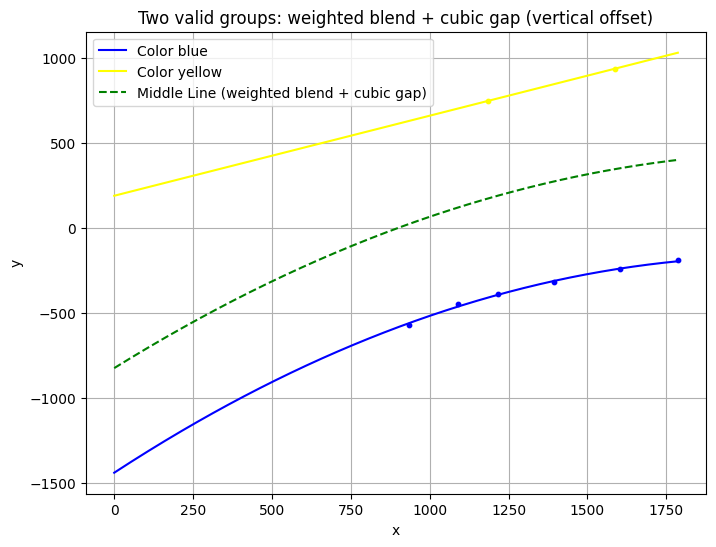

{'x_list': [np.float64(1486.4281005859375), np.float64(835.4873046875), np.float64(990.452880859375), np.float64(1293.5211181640625), np.float64(1502.1676025390625), np.float64(1116.4166259765625), np.float64(1686.6571044921875), np.float64(1083.617919921875)], 'y_list': [np.float64(938.3595581054688), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-317.9097595214844), np.float64(-242.7596893310547), np.float64(-388.4013366699219), np.float64(-189.7828826904297), np.float64(748.6251831054688)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


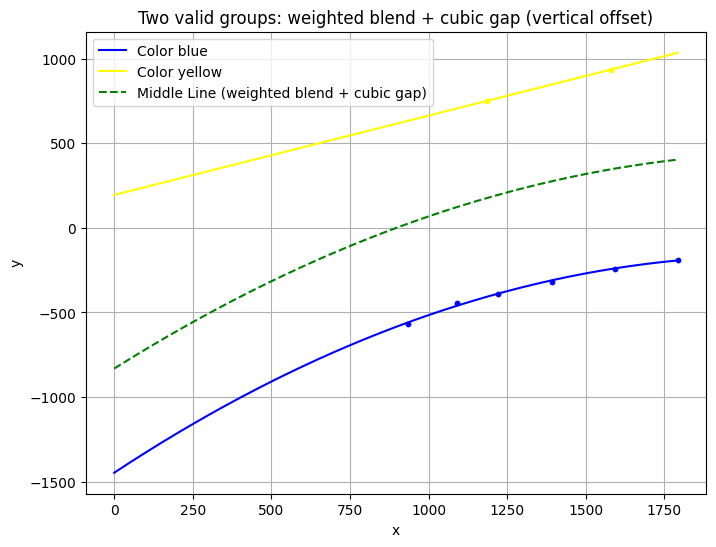

{'x_list': [np.float64(1481.260498046875), np.float64(835.4873046875), np.float64(990.452880859375), np.float64(1491.763916015625), np.float64(1293.5211181640625), np.float64(1119.49609375), np.float64(1693.154052734375), np.float64(1087.014404296875)], 'y_list': [np.float64(935.3030395507812), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.18333435058594), np.float64(-317.9097595214844), np.float64(-389.3846130371094), np.float64(-190.47299194335938), np.float64(750.4920654296875)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


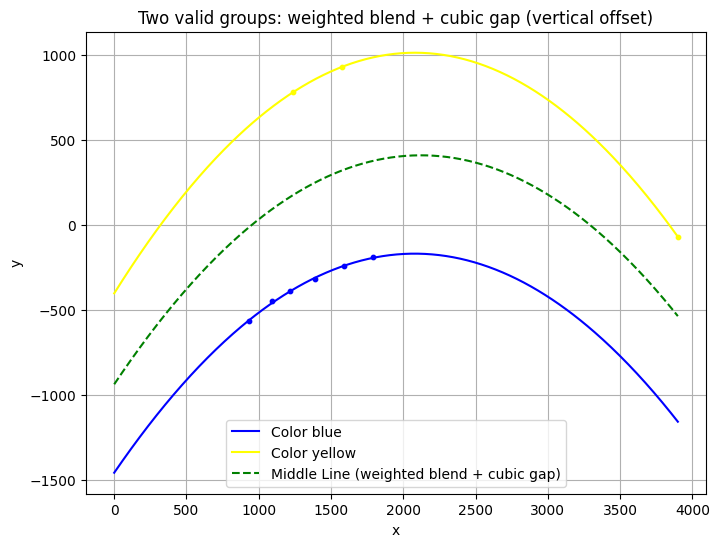

{'x_list': [np.float64(1476.1265869140625), np.float64(835.4873046875), np.float64(990.452880859375), np.float64(1491.763916015625), np.float64(1289.5396728515625), np.float64(1119.49609375), np.float64(1693.154052734375), np.float64(3799.061767578125), np.float64(1139.0999755859375)], 'y_list': [np.float64(932.2662963867188), np.float64(-566.4765014648438), np.float64(-446.7615661621094), np.float64(-241.18333435058594), np.float64(-317.0014343261719), np.float64(-389.3846130371094), np.float64(-190.47299194335938), np.float64(-69.06462860107422), np.float64(783.7169799804688)], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0, 0]}


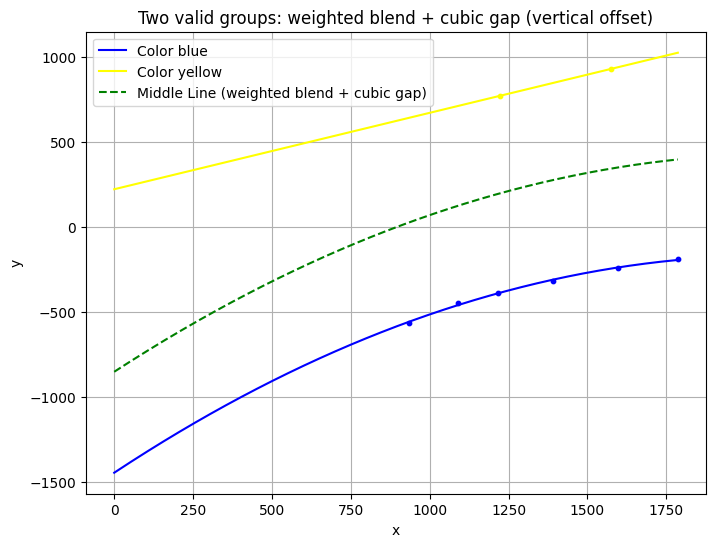

{'x_list': [1576.1265869140625, 933.623779296875, 1090.452880859375, 1596.94873046875, 1389.5396728515625, 1216.4166259765625, 1786.6571044921875, 1223.6318359375], 'y_list': [932.2662963867188, -565.3480834960938, -446.7615661621094, -241.9689178466797, -315.6409606933594, -388.4013366699219, -189.7828826904297, 773.6434326171875], 'c_list': [0, 1, 1, 1, 1, 1, 1, 0]}


In [ ]:
'''
filename = os.path.join(os.getcwd(), "detection_results.json")
with open(filename, 'r', encoding='utf-8') as f:
    frames = json.load(f)

frame = frames[60]
'''
#frame = {"x_list": [1591.6295166015625, 937.0015258789062, 1090.452880859375, 1596.94873046875, 1393.5211181640625, 1222.59130859375, 1786.6571044921875, 1183.617919921875], "y_list": [941.4361572265625, -567.6094970703125, -446.7615661621094, -241.9689178466797, -316.5453796386719, -390.3728942871094, -189.7828826904297, 748.6251831054688], "c_list": [0, 1, 1, 1, 1, 1, 1, 0], "n": 8}
#poly_middle = generate_middle_line(frame)

filename = os.path.join(os.getcwd(), "detection_results.json")
Global_Map = {"x_list":[], "y_list":[], "c_list":[]}
for i, frame in enumerate(iter_frames(filename), 1):
    if is_empty_detection(frame):
      continue

    if is_empty_detection(Global_Map):
      Global_Map = frame_to_map(frame)


    else:
        heading = frame.get("heading_angle_in_radians", 0.0)
        wheel_speed = frame.get("wheel_speed", 1000)
        predicted_map = update_Cones_Map(heading, wheel_speed, Global_Map)
        print(predicted_map)

        predicted_filtered = filter_x_range(predicted_map, x_min=0.0, x_max=750.0)

        current_map = frame_to_map(frame)

        fused_map = merge_maps(current_map, predicted_filtered)

        poly_middle = generate_middle_line(fused_map)

        Global_Map = fused_map

print(Global_Map)

